# Kaggle Titanic

Учебный проект для соревнования [Titanic на Kaggle](https://www.kaggle.com/c/titanic/overview).

Полученный score: 0.77511

In [5]:
import pandas as pd
import re
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [6]:
#Загрузка данных
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

PassengerId = test['PassengerId']

train.head(3)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S


In [7]:
# Код в этом блоке взят из https://www.kaggle.com/code/arthurtok/introduction-to-ensembling-stacking-in-python/notebook

full_data = [train, test]

# длина имени
train['Name_length'] = train['Name'].apply(len)
test['Name_length'] = test['Name'].apply(len)
# Наличие каюты
train['Has_Cabin'] = train["Cabin"].apply(lambda x: 0 if type(x) == float else 1)
test['Has_Cabin'] = test["Cabin"].apply(lambda x: 0 if type(x) == float else 1)

# Новая фича - размер семьи = SibSp + Parch
for dataset in full_data:
    dataset['FamilySize'] = dataset['SibSp'] + dataset['Parch'] + 1
# Новая фича - одиночка = да/нет
for dataset in full_data:
    dataset['IsAlone'] = 0
    dataset.loc[dataset['FamilySize'] == 1, 'IsAlone'] = 1
# Замена пропущенных значений
for dataset in full_data:
    dataset['Embarked'] = dataset['Embarked'].fillna('S')
for dataset in full_data:
    dataset['Fare'] = dataset['Fare'].fillna(train['Fare'].median())
train['CategoricalFare'] = pd.qcut(train['Fare'], 4)
# Новая фича - категорийный возраст
for dataset in full_data:
    age_avg = dataset['Age'].mean()
    age_std = dataset['Age'].std()
    age_null_count = dataset['Age'].isnull().sum()
    age_null_random_list = np.random.randint(age_avg - age_std, age_avg + age_std, size=age_null_count)
    dataset['Age'][np.isnan(dataset['Age'])] = age_null_random_list
    dataset['Age'] = dataset['Age'].astype(int)
train['CategoricalAge'] = pd.cut(train['Age'], 5)
# Функция для поиска и извлечения обращения из имени
def get_title(name):
    title_search = re.search(' ([A-Za-z]+)\.', name)
    if title_search:
        return title_search.group(1)
    return ""
# Новая фича - обращения
for dataset in full_data:
    dataset['Title'] = dataset['Name'].apply(get_title)
# Редкие обращения объединяются в одну категорию
for dataset in full_data:
    dataset['Title'] = dataset['Title'].replace(['Lady', 'Countess','Capt', 'Col','Don', 'Dr', 'Major', 'Rev', 'Sir', 'Jonkheer', 'Dona'], 'Rare')

    dataset['Title'] = dataset['Title'].replace('Mlle', 'Miss')
    dataset['Title'] = dataset['Title'].replace('Ms', 'Miss')
    dataset['Title'] = dataset['Title'].replace('Mme', 'Mrs')

#     кодирование категоирийных фичей
for dataset in full_data:
    
    dataset['Sex'] = dataset['Sex'].map( {'female': 0, 'male': 1} ).astype(int)
    
    title_mapping = {"Mr": 1, "Miss": 2, "Mrs": 3, "Master": 4, "Rare": 5}
    dataset['Title'] = dataset['Title'].map(title_mapping)
    dataset['Title'] = dataset['Title'].fillna(0)
    
    dataset['Embarked'] = dataset['Embarked'].map( {'S': 0, 'C': 1, 'Q': 2} ).astype(int)
    
    dataset.loc[ dataset['Fare'] <= 7.91, 'Fare'] = 0
    dataset.loc[(dataset['Fare'] > 7.91) & (dataset['Fare'] <= 14.454), 'Fare'] = 1
    dataset.loc[(dataset['Fare'] > 14.454) & (dataset['Fare'] <= 31), 'Fare']   = 2
    dataset.loc[ dataset['Fare'] > 31, 'Fare'] = 3
    dataset['Fare'] = dataset['Fare'].astype(int)
    
    dataset.loc[ dataset['Age'] <= 16, 'Age'] 					       = 0
    dataset.loc[(dataset['Age'] > 16) & (dataset['Age'] <= 32), 'Age'] = 1
    dataset.loc[(dataset['Age'] > 32) & (dataset['Age'] <= 48), 'Age'] = 2
    dataset.loc[(dataset['Age'] > 48) & (dataset['Age'] <= 64), 'Age'] = 3
    dataset.loc[ dataset['Age'] > 64, 'Age'] = 4

In [8]:
# Удаление лишних фичей
drop_elements = ['PassengerId', 'Name', 'Ticket', 'Cabin', 'SibSp']
train = train.drop(drop_elements, axis = 1)
train = train.drop(['CategoricalAge', 'CategoricalFare'], axis = 1)
test  = test.drop(drop_elements, axis = 1)

In [9]:
train.head(3)

,Survived,Pclass,Sex,Age,Parch,Fare,Embarked,Name_length,Has_Cabin,FamilySize,IsAlone,Title
0,0,3,1,1,0,0,0,23,0,2,0,1
1,1,1,0,2,0,3,1,51,1,2,0,3
2,1,3,0,1,0,1,0,22,0,1,1,2


<AxesSubplot:title={'center':'Pearson Correlation of Features'}>

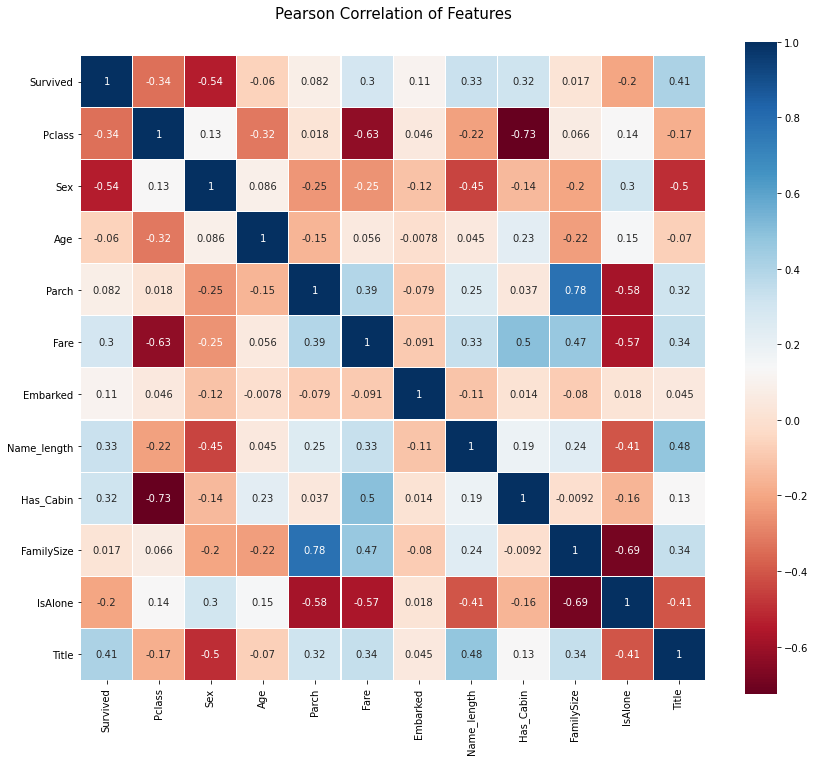

In [10]:
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(train.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

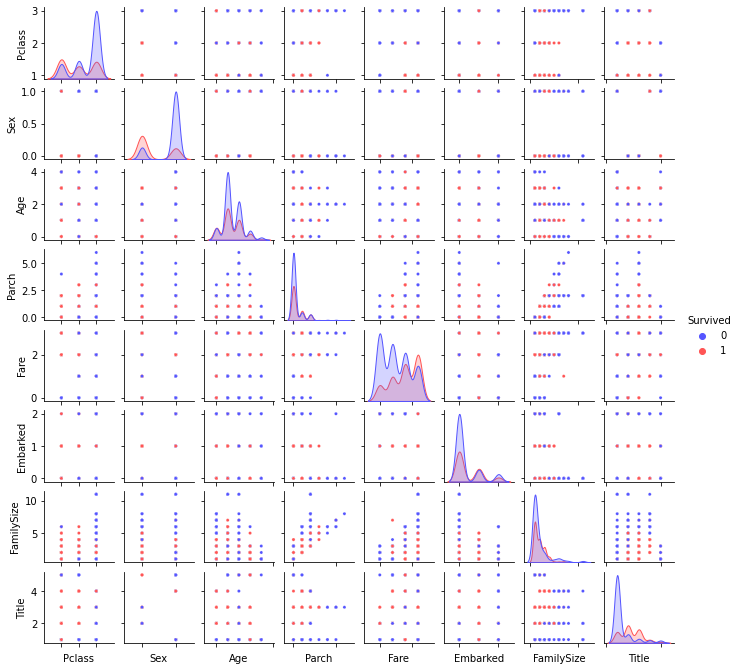

In [11]:
g = sns.pairplot(train[[u'Survived', u'Pclass', u'Sex', u'Age', u'Parch', u'Fare', 
                        u'Embarked', u'FamilySize', u'Title']], 
                 hue='Survived', palette = 'seismic', size=1.2, plot_kws=dict(s=10))
g.set(xticklabels=[])

Получились два датасета с новыми признаками. Теперь приступим к построению модели.

### Построение модели


Используем собственный алгоритм стекинга. В качестве базовых алгоритмов выберем RandomForestClassifier, SVC, GradientBoostingClassifier и LogisticRegression; в качестве мета-алгоритма - XGBoost.

In [12]:
# функция стекинга

def stacking(models, meta_alg, data_train, targets_train, data_test, targets_test=None, random_state=None, test_size=None, cv=5):
    if test_size is None:
        meta_mtrx = np.empty((data_train.shape[0], len(models)))
        for n, model in enumerate(models):
            meta_mtrx[:, n] = cross_val_predict(model, data_train, targets_train, cv=cv, method='predict')
            model.fit(data_train, targets_train)
            
        meta_model = meta_alg.fit(meta_mtrx, targets_train)
        meta_mtrx_test = np.empty((data_test.shape[0], len(models)))
        
        for n, model in enumerate(models):
            meta_mtrx_test[:, n] = model.predict(data_test)
        
        meta_alg_pred = meta_model.predict(meta_mtrx_test)
        print(meta_alg_pred)
        
        return meta_alg_pred
        
        if targets_test is not None:
            print(f'\n{n} auc: {roc_auc_score(targets_test, meta_alg_pred)}')
            
        
            
            
            
    
    elif test_size > 0 and test_size < 1:
        x_train = data_train
        x_test = data_test
        y_train = targets_train
        y_test = targets_test
        train, valid, train_true, valid_true = train_test_split(x_train, 
                                                        y_train,
                                                        test_size=test_size,
                                                        random_state=0)

        meta_mtrx = np.empty((valid.shape[0], len(models)))
        
        for n, model in enumerate(models):
            tr_model = model.fit(train, train_true)
            meta_mtrx[:, n] = tr_model.predict(valid)
        meta_model = meta_alg.fit(meta_mtrx, valid_true)
        
        meta_mtrx_test = np.empty((x_test.shape[0], len(models)))
        for n, model in enumerate(models):
            meta_mtrx_test[:, n] = tr_model.predict(x_test)
        meta_alg_pred = meta_model.predict(meta_mtrx_test)
        
        if targets_test is not None:
            print(f'\n{n} auc: {roc_auc_score(y_test, meta_alg_pred)}')
            print(meta_alg_pred)

        
    
    else:
        raise ValueError("test_size must be between 0 and 1")

In [13]:
# Параметры базовых моделей для GridSearch 

from sklearn.model_selection import (GridSearchCV,
                                     train_test_split,
                                     StratifiedKFold)

from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

from xgboost import XGBClassifier


gbc_params = {'learning_rate': np.arange(0.1, 0.6, 0.1)} # GradientBoostingClassifier

rfc_params = {'n_estimators': range(10, 100, 10), # RandomForestClassifier
              'min_samples_leaf': range(1, 5)}

svc_params = {'kernel': ['linear', 'rbf'], # SVC
              'C': np.arange(0.1, 1, 0.2)}

lr_params = {'C': np.arange(0.5, 1, 0.1)} #LogisticRegression

skf = StratifiedKFold(n_splits=5, random_state=17)

In [14]:
split = train_test_split(train, random_state=17,  test_size=.3)

target_learn = split[0].loc[:, 'Survived']
features_learn = split[0].drop(columns = 'Survived')

target_valid = split[1].loc[:, 'Survived']
features_valid = split[1].drop(columns = 'Survived')


Подбираем лучшие параметры с помощью GridSearchCV, проверяем долю правильно классифицированных объектов.

In [15]:
from sklearn.metrics import accuracy_score

gbc_grid = GridSearchCV(GradientBoostingClassifier(random_state = 17), gbc_params, cv = skf).fit(features_learn, target_learn)
gbc_bp = gbc_grid.best_params_
gbc = GradientBoostingClassifier(learning_rate = gbc_bp['learning_rate']).fit(features_learn, target_learn)

print(f'best params: {gbc_bp}')

gbc_prediction = gbc.predict(features_valid)
acc = accuracy_score(target_valid, gbc_prediction)

print(f'accuracy: {acc}')

best params: {'learning_rate': 0.1}
accuracy: 0.7649253731343284


In [16]:
rfc_grid = GridSearchCV(RandomForestClassifier(random_state = 17), rfc_params, cv = skf).fit(features_learn, target_learn)
rfc_bp = rfc_grid.best_params_
rfc = RandomForestClassifier(min_samples_leaf = rfc_bp['min_samples_leaf'],
                            n_estimators = rfc_bp['n_estimators']).fit(features_learn, target_learn)

print(f'best params: {rfc_bp}')

rfc_prediction = rfc.predict(features_valid)
acc = accuracy_score(target_valid, rfc_prediction)

print(f'accuracy: {acc}')

best params: {'min_samples_leaf': 3, 'n_estimators': 10}
accuracy: 0.7985074626865671


In [17]:
svc_grid = GridSearchCV(SVC(random_state = 17), svc_params, cv = skf).fit(features_learn, target_learn)
svc_bp = svc_grid.best_params_

print(f'best params: {svc_bp}')

svc = SVC(C = svc_bp['C'], kernel = svc_bp['kernel']).fit(features_learn, target_learn)

svc_prediction = rfc.predict(features_valid)
acc = accuracy_score(target_valid, svc_prediction)

print(f'accuracy: {acc}')

best params: {'C': 0.5000000000000001, 'kernel': 'linear'}
accuracy: 0.7985074626865671


In [18]:
lr_grid = GridSearchCV(LogisticRegression(random_state = 17), lr_params, cv = skf).fit(features_learn, target_learn)
lr_bp = lr_grid.best_params_

lr = LogisticRegression(C = lr_bp['C']).fit(features_learn, target_learn)

print(f'best params: {lr_bp}')

lr_prediction = lr.predict(features_valid)
acc = accuracy_score(target_valid, lr_prediction)

print(f'accuracy: {acc}')

best params: {'C': 0.5}
accuracy: 0.8022388059701493


С помощью GridSearchCV настраиваем мета-алгоритм на мета-признаках. Матрицу метапризнаков берем из предсказаний, полученных ранее базовыми алгоритмами.

In [19]:
xgb_params = {'n_estimators': range(10, 100, 5),
              'eta': np.arange(0.1, 1., .1),
              'min_child_weight': range(1, 10, 1),
              'subsample': np.arange(0.1, 1., 0.2)}

In [20]:
meta_features = pd.DataFrame(columns = ['gbc', 'rfc', 'svc', 'lr'])
meta_features.gbc = gbc_prediction
meta_features.rfc = rfc_prediction
meta_features.svc = svc_prediction
meta_features.lr = lr_prediction

xgb_grid = GridSearchCV(XGBClassifier(random_state = 17), xgb_params, cv = 5, verbose=10).fit(meta_features, target_valid)

best_hyperparams = xgb_grid.best_params_


print('Best params: ', best_hyperparams)

# Best params:  {'eta': 0.7000000000000001,
#                'min_child_weight': 1, 
#                'n_estimators': 20, 
#                'subsample': 0.30000000000000004}

Fitting 5 folds for each of 7290 candidates, totalling 36450 fits
[CV] eta=0.1, min_child_weight=1, n_estimators=10, subsample=0.1 .....
[16:27:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=10, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=10, subsample=0.1 .....
[16:27:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=10, subsample=0.1, score=0.852

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.0s remaining:    0.0s



[CV]  eta=0.1, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001 
[16:27:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001 
[16:27:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.1, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004 
[16:27:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001 
[16:27:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[16:27:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=20, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=20, subsample=0.1 .....
[16:27:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=20, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=20, subsample=0.1 .....
[16:27:21] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.1, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001 
[16:27:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001 
[16:27:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001 
[16:27:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=25, subsample=0.9000000000000001 
[16:27:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001 
[16:27:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001 
[16:27:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001 
[16:27:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001 
[16:27:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[16:27:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=40, subsample=0.5000000000000001 
[16:27:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=40, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=40, subsample=0.5000000000000001 

[CV]  eta=0.1, min_child_weight=1, n_estimators=45, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=45, subsample=0.30000000000000004 
[16:27:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=45, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=45, subsample=0.30000000000000004 
[16:27:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.1, min_child_weight=1, n_estimators=50, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004 
[16:27:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004 
[16:27:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.1, min_child_weight=1, n_estimators=50, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=55, subsample=0.1 .....
[16:27:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=55, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=55, subsample=0.1 .....
[16:27:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, 

[CV]  eta=0.1, min_child_weight=1, n_estimators=55, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=55, subsample=0.7000000000000001 
[16:27:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=55, subsample=0.7000000000000001, score=0.755, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=55, subsample=0.9000000000000001 
[16:27:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=1, n_estimators=60, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=60, subsample=0.5000000000000001 
[16:27:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=60, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=60, subsample=0.5000000000000001 
[16:27:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=1, n_estimators=65, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=65, subsample=0.30000000000000004 
[16:27:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=65, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=65, subsample=0.30000000000000004 
[16:27:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.1, min_child_weight=1, n_estimators=65, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=65, subsample=0.9000000000000001 
[16:27:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=65, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=70, subsample=0.1 .....
[16:27:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.1, min_child_weight=1, n_estimators=70, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=70, subsample=0.7000000000000001 
[16:27:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=70, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=70, subsample=0.7000000000000001 
[16:27:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=1, n_estimators=75, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001 
[16:27:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001 
[16:27:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001 
[16:27:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001 
[16:27:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001 
[16:27:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001 
[16:27:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=1, n_estimators=90, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=90, subsample=0.30000000000000004 
[16:27:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=90, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=90, subsample=0.5000000000000001 
[16:27:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.1, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004 
[16:27:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004 
[16:27:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:27:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=10, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=10, subsample=0.1 .....
[16:27:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=10, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=10, subsample=0.30000000000000004 
[16:27:29] WARNING: C:/Users/Administra

[16:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001 
[16:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001 


[16:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=15, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=15, subsample=0.7000000000000001 
[16:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=15, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=15, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004 
[16:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004 
[16:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.1, min_child_weight=2, n_estimators=20, subsample=0.9000000000000001 
[16:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=20, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=20, subsample=0.9000000000000001 
[16:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=20, subsample=0.9000000000000001, score=0.736, total=   0.0s


[16:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=25, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=25, subsample=0.7000000000000001 
[16:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=25, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=25, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001 
[16:27:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001 
[16:27:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001 
[16:27:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=35, subsample=0.9000000000000001 
[16:27:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:27:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001 
[16:27:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=40, subsample=0.9000000000000001 


[CV] eta=0.1, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001 
[16:27:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001 
[16:27:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001, score=0.833, total=   0.0s


[CV]  eta=0.1, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001 
[16:27:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001 
[16:27:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004 
[16:27:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004 
[16:27:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.1, min_child_weight=2, n_estimators=60, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=60, subsample=0.1 .....
[16:27:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=60, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=60, subsample=0.1 .....
[16:27:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=60

[CV]  eta=0.1, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001 
[16:27:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001 
[16:27:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.1, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001 
[16:27:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001 
[16:27:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s


[CV]  eta=0.1, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001 
[16:27:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001 
[16:27:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.1, min_child_weight=2, n_estimators=75, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=75, subsample=0.1 .....
[16:27:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=75, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=75, subsample=0.1 .....
[16:27:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=75

[CV]  eta=0.1, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001 
[16:27:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001 
[16:27:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:27:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001 
[16:27:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001 


[CV]  eta=0.1, min_child_weight=2, n_estimators=85, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=85, subsample=0.1 .....
[16:27:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=85, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004 
[16:27:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_es

[CV]  eta=0.1, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=90, subsample=0.1 .....
[16:27:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=90, subsample=0.1 .....
[16:27:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=90

[CV]  eta=0.1, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001 
[16:27:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001 
[16:27:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:27:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:27:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001 
[16:27:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=10, subsample=0.7000000000000001 
[16:27:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=3, n_estimators=15, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=15, subsample=0.30000000000000004 
[16:27:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=15, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=15, subsample=0.5000000000000001 
[16:27:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.1, min_child_weight=3, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=20, subsample=0.1 .....
[16:27:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=20, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=20, subsample=0.1 .....
[16:27:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=20

[CV]  eta=0.1, min_child_weight=3, n_estimators=20, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=20, subsample=0.7000000000000001 
[16:27:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=20, subsample=0.9000000000000001 
[16:27:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:27:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001 
[16:27:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001 


[CV]  eta=0.1, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001 
[16:27:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001 
[16:27:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=3, n_estimators=35, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=35, subsample=0.1 .....
[16:27:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=35, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004 
[16:27:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_es

[16:27:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=40, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=40, subsample=0.1 .....
[16:27:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=40, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=40, subsample=0.30000000000000004 
[16:27:39] WARNING: C:/Users/Administra

[CV]  eta=0.1, min_child_weight=3, n_estimators=45, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=45, subsample=0.1 .....
[16:27:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=45, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=45, subsample=0.30000000000000004 
[16:27:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_es

[16:27:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=50, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=50, subsample=0.1 .....
[16:27:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=50, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=50, subsample=0.1 .....
[16:27:40] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.1, min_child_weight=3, n_estimators=50, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=55, subsample=0.1 .....
[16:27:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=55, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=55, subsample=0.1 .....
[16:27:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, 

[CV]  eta=0.1, min_child_weight=3, n_estimators=55, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=55, subsample=0.9000000000000001 
[16:27:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=55, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=55, subsample=0.9000000000000001 
[16:27:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=3, n_estimators=60, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=60, subsample=0.7000000000000001 
[16:27:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=60, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=60, subsample=0.7000000000000001 
[16:27:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=3, n_estimators=65, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=65, subsample=0.5000000000000001 
[16:27:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=65, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=65, subsample=0.5000000000000001 
[16:27:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004 
[16:27:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004 
[16:27:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.1, min_child_weight=3, n_estimators=75, subsample=0.1, score=0.704, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=75, subsample=0.1 .....
[16:27:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=75, subsample=0.1, score=0.870, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=75, subsample=0.1 .....
[16:27:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=75

[16:27:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=75, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=75, subsample=0.7000000000000001 
[16:27:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001 


[CV] eta=0.1, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001 
[16:27:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001 
[16:27:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001, score=0.796, total=   0.0s


[CV]  eta=0.1, min_child_weight=3, n_estimators=85, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=85, subsample=0.1 .....
[16:27:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=85, subsample=0.1 .....
[16:27:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=85

[16:27:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001 
[16:27:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=90, subsample=0.1 .....
[16:27:44]

[CV]  eta=0.1, min_child_weight=3, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001 
[16:27:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001 
[16:27:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004 
[16:27:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004 
[16:27:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.1, min_child_weight=4, n_estimators=10, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=10, subsample=0.30000000000000004 
[16:27:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=10, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001 
[16:27:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.1, min_child_weight=4, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=15, subsample=0.1 .....
[16:27:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004 
[16:27:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_es

[16:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001 
[16:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001 


[16:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=20, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001 
[16:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004 
[16:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004 
[16:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.1, min_child_weight=4, n_estimators=25, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=30, subsample=0.1 .....
[16:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=30, subsample=0.1 .....
[16:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, 

[16:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=35, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=35, subsample=0.1 .....
[16:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=35, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=35, subsample=0.1 .....
[16:27:46] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.1, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001 
[16:27:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001 
[16:27:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=4, n_estimators=40, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001 
[16:27:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001 
[16:27:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:27:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=45, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001 
[16:27:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=4, n_estimators=50, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=50, subsample=0.5000000000000001 
[16:27:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=50, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=50, subsample=0.5000000000000001 
[16:27:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:27:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=55, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=55, subsample=0.30000000000000004 
[16:27:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=55, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=55, subsample=0.500000000000000

[CV]  eta=0.1, min_child_weight=4, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=60, subsample=0.30000000000000004 
[16:27:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=60, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=60, subsample=0.30000000000000004 
[16:27:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.1, min_child_weight=4, n_estimators=60, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=65, subsample=0.1 .....
[16:27:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=65, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=65, subsample=0.1 .....
[16:27:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, 

[CV]  eta=0.1, min_child_weight=4, n_estimators=65, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=65, subsample=0.7000000000000001 
[16:27:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=65, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=65, subsample=0.9000000000000001 
[16:27:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=4, n_estimators=70, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=70, subsample=0.5000000000000001 
[16:27:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=70, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=70, subsample=0.5000000000000001 
[16:27:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=4, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=75, subsample=0.30000000000000004 
[16:27:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=75, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=75, subsample=0.30000000000000004 
[16:27:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.1, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001 
[16:27:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=80, subsample=0.1 .....
[16:27:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[16:27:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=80, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=80, subsample=0.7000000000000001 
[16:27:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=80, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=80, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004 
[16:27:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=85, subsample=0.5000000000000001 
[16:27:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.1, min_child_weight=4, n_estimators=90, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=90, subsample=0.1 .....
[16:27:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=90, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004 
[16:27:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_es

[CV]  eta=0.1, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=95, subsample=0.1 .....
[16:27:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=95, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=95, subsample=0.1 .....
[16:27:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, 

[CV]  eta=0.1, min_child_weight=4, n_estimators=95, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=95, subsample=0.7000000000000001 
[16:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=4, n_estimators=95, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=4, n_estimators=95, subsample=0.9000000000000001 
[16:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=5, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=10, subsample=0.7000000000000001 
[16:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=10, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=10, subsample=0.7000000000000001 
[16:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001 
[16:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001 
[16:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004 
[16:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=20, subsample=0.300000000000000

[16:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001 
[16:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001 


[CV]  eta=0.1, min_child_weight=5, n_estimators=25, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=25, subsample=0.5000000000000001 
[16:27:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=25, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=25, subsample=0.7000000000000001 
[16:27:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.1, min_child_weight=5, n_estimators=30, subsample=0.30000000000000004 
[16:27:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=30, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=30, subsample=0.5000000000000001 
[16:27:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=30, subsample=0.5000000000000001, score=0.741, total=   0.0

[CV]  eta=0.1, min_child_weight=5, n_estimators=35, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=35, subsample=0.30000000000000004 
[16:27:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=35, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=35, subsample=0.30000000000000004 
[16:27:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:27:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=40, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=40, subsample=0.30000000000000004 
[16:27:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=40, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=40, subsample=0.30000000000000004 
[16:27:55] W

[16:27:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=40, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=40, subsample=0.9000000000000001 
[16:27:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=40, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=40, subsample=0.9000000000000001 


[CV] eta=0.1, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001 
[16:27:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001 
[16:27:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001, score=0.811, total=   0.0s


[16:27:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004 
[16:27:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=50, subsample=0.500000000000000

[16:27:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=55, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=55, subsample=0.1 .....
[16:27:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=55, subsample=0.1 .....
[16:27:56] WARNING: C:/Users/Administrator/workspa

[16:27:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=55, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=60, subsample=0.1 .....
[16:27:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=60, subsample=0.1 .....
[16:27:56] WARNING: C:/Users/Admini

[16:27:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001 
[16:27:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001 


[CV]  eta=0.1, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:27:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:27:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:27:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:27:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=5, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:27:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:27:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.1, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001 
[16:27:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001 
[16:27:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:27:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:27:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:27:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004 
[16:27:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=85, subsample=0.500000000000000

[CV]  eta=0.1, min_child_weight=5, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:27:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=90, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:27:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, 

[CV]  eta=0.1, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001 
[16:27:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001 
[16:27:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001 
[16:28:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001 
[16:28:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=10, subsample=0.7000000000000001 
[16:28:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=10, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=10, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004 
[16:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=15, subsample=0.5000000000000001 
[16:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV] eta=0.1, min_child_weight=6, n_estimators=20, subsample=0.1 .....
[16:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=20, subsample=0.1 .....
[16:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=20,

[CV]  eta=0.1, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=20, subsample=0.9000000000000001 
[16:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=20, subsample=0.9000000000000001 
[16:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001 
[16:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001 


[16:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=30, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=30, subsample=0.1 .....
[16:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=30, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=30, subsample=0.1 .....
[16:28:01] WARNING: C:/Users/Administrator/workspa

[16:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=30, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=30, subsample=0.9000000000000001 
[16:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=30, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=35, subsample=0.1 .....
[16:28:02]

[CV]  eta=0.1, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001 
[16:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001 
[16:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=6, n_estimators=40, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001 
[16:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001 
[16:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=6, n_estimators=45, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001 
[16:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001 
[16:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.1, min_child_weight=6, n_estimators=50, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=50, subsample=0.1 .....
[16:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=50, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=50, subsample=0.1 .....
[16:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=50

[16:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001 
[16:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001 


[CV]  eta=0.1, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001 
[16:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001 
[16:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=6, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=60, subsample=0.1 .....
[16:28:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=60, subsample=0.30000000000000004 
[16:28:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_es

[16:28:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001 
[16:28:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=65, subsample=0.1 .....
[16:28:04]

[CV]  eta=0.1, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001 
[16:28:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001 
[16:28:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001 
[16:28:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001 
[16:28:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004 
[16:28:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004 
[16:28:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.1, min_child_weight=6, n_estimators=80, subsample=0.1 .....
[16:28:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=80, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=80, subsample=0.1 .....
[16:28:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=80, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=80,

[16:28:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001 
[16:28:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=80, subsample=0.9000000000000001 


[CV]  eta=0.1, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001 
[16:28:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001 
[16:28:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=90, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=90, subsample=0.1 .....
[16:28:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=90, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=90, subsample=0.1 .....
[16:28:07] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.1, min_child_weight=6, n_estimators=90, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=90, subsample=0.7000000000000001 
[16:28:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=90, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=90, subsample=0.9000000000000001 
[16:28:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=6, n_estimators=95, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=95, subsample=0.5000000000000001 
[16:28:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=6, n_estimators=95, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=6, n_estimators=95, subsample=0.5000000000000001 
[16:28:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=7, n_estimators=10, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=10, subsample=0.5000000000000001 
[16:28:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=10, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001 
[16:28:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=7, n_estimators=15, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=15, subsample=0.30000000000000004 
[16:28:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=15, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001 
[16:28:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[16:28:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=20, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=20, subsample=0.1 .....
[16:28:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=20, subsample=0.1 .....
[16:28:08] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.1, min_child_weight=7, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:28:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:28:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=25, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=25, subsample=0.5000000000000001 
[16:28:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=25, subsample=0.5000000000000001 


[16:28:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=30, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=30, subsample=0.30000000000000004 
[16:28:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=30, subsample=0.30000000000000004, score=0.755, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=30, subsample=0.500000000000000

[CV]  eta=0.1, min_child_weight=7, n_estimators=35, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=35, subsample=0.30000000000000004 
[16:28:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=35, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=35, subsample=0.30000000000000004 
[16:28:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:28:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=40, subsample=0.1 .....
[16:28:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=40, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=40, subsample=0.1 .....
[16:28:09] WARNING: C:/Users/Administrator/workspa

[16:28:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001 
[16:28:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001 


[16:28:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=45, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=45, subsample=0.7000000000000001 
[16:28:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=45, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=45, subsample=0.7000000000000001 


[16:28:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=50, subsample=0.30000000000000004, score=0.755, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001 
[16:28:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001 

[CV]  eta=0.1, min_child_weight=7, n_estimators=55, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=55, subsample=0.1 .....
[16:28:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=55, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=55, subsample=0.1 .....
[16:28:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=55

[CV]  eta=0.1, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001 
[16:28:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=55, subsample=0.9000000000000001 
[16:28:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.1, min_child_weight=7, n_estimators=60, subsample=0.7000000000000001 
[16:28:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=60, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=60, subsample=0.7000000000000001 
[16:28:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=60, subsample=0.7000000000000001, score=0.796, total=   0.0s


[CV]  eta=0.1, min_child_weight=7, n_estimators=65, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=65, subsample=0.5000000000000001 
[16:28:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=65, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=65, subsample=0.5000000000000001 
[16:28:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=7, n_estimators=70, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=70, subsample=0.30000000000000004 
[16:28:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=70, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=70, subsample=0.30000000000000004 
[16:28:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.1, min_child_weight=7, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=75, subsample=0.1 .....
[16:28:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=75, subsample=0.1 .....
[16:28:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=75

[CV]  eta=0.1, min_child_weight=7, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001 
[16:28:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001 
[16:28:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=80, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=80, subsample=0.5000000000000001 
[16:28:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=80, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004 
[16:28:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004 
[16:28:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.1, min_child_weight=7, n_estimators=85, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=85, subsample=0.9000000000000001 
[16:28:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=85, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=85, subsample=0.9000000000000001 
[16:28:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=7, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001 
[16:28:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001 
[16:28:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.1, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001 
[16:28:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001 
[16:28:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001, score=0.852, total=   0.0s


[CV]  eta=0.1, min_child_weight=8, n_estimators=10, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=10, subsample=0.1 .....
[16:28:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=10, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=10, subsample=0.1 .....
[16:28:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=10

[CV]  eta=0.1, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001 
[16:28:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001 
[16:28:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001 
[16:28:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001 
[16:28:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.1, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001 
[16:28:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001 
[16:28:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001, score=0.852, total=   0.0s


[16:28:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=25, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=25, subsample=0.1 .....
[16:28:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=25, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=25, subsample=0.1 .....
[16:28:16] WARNING: C:/Users/Administrator/workspa

[16:28:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=25, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=25, subsample=0.7000000000000001 
[16:28:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=25, subsample=0.9000000000000001 


[16:28:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001 
[16:28:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=8, n_estimators=35, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=35, subsample=0.5000000000000001 
[16:28:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=35, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=35, subsample=0.5000000000000001 
[16:28:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=8, n_estimators=40, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=40, subsample=0.30000000000000004 
[16:28:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=40, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001 
[16:28:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.1, min_child_weight=8, n_estimators=45, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=45, subsample=0.1 .....
[16:28:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=45, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004 
[16:28:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_es

[16:28:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 
[16:28:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 


[CV]  eta=0.1, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001 
[16:28:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001 
[16:28:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004 
[16:28:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004 
[16:28:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:28:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=55, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=60, subsample=0.1 .....
[16:28:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=60, subsample=0.1, score=0.407, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=60, subsample=0.1 .....
[16:28:18] WARNING: C:/Users/Admini

[CV]  eta=0.1, min_child_weight=8, n_estimators=60, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=60, subsample=0.7000000000000001 
[16:28:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=60, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=60, subsample=0.7000000000000001 
[16:28:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001 
[16:28:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001 
[16:28:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=8, n_estimators=70, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=70, subsample=0.30000000000000004 
[16:28:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=70, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=70, subsample=0.30000000000000004 
[16:28:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.1, min_child_weight=8, n_estimators=75, subsample=0.1 .....
[16:28:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=75, subsample=0.1 .....
[16:28:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=75, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=75,

[CV]  eta=0.1, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001 
[16:28:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=75, subsample=0.9000000000000001 
[16:28:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001 
[16:28:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001 
[16:28:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=8, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=85, subsample=0.30000000000000004 
[16:28:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=85, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=85, subsample=0.30000000000000004 
[16:28:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.1, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001 
[16:28:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001 
[16:28:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001 
[16:28:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=8, n_estimators=95, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=95, subsample=0.30000000000000004 
[16:28:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=95, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=95, subsample=0.30000000000000004 
[16:28:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.1, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001 
[16:28:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001 
[16:28:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=10, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=15, subsample=0.1 .....
[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=15, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=15, subsample=0.1 .....
[16:28:23] WARNING: C:/Users/Admini

[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001 
[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=15, subsample=0.9000000000000001 


[CV]  eta=0.1, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001 
[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001 
[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=9, n_estimators=25, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=25, subsample=0.1 .....
[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=25, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=25, subsample=0.30000000000000004 
[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_es

[CV]  eta=0.1, min_child_weight=9, n_estimators=30, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=30, subsample=0.1 .....
[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=30, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=30, subsample=0.1 .....
[16:28:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=30

[CV]  eta=0.1, min_child_weight=9, n_estimators=35, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=35, subsample=0.1 .....
[16:28:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=35, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=35, subsample=0.1 .....
[16:28:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=35

[CV]  eta=0.1, min_child_weight=9, n_estimators=35, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=35, subsample=0.9000000000000001 
[16:28:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=35, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=35, subsample=0.9000000000000001 
[16:28:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=40, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=40, subsample=0.7000000000000001 
[16:28:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=40, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=40, subsample=0.7000000000000001 


[CV]  eta=0.1, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001 
[16:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001 
[16:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=9, n_estimators=50, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=50, subsample=0.30000000000000004 
[16:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=50, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=50, subsample=0.30000000000000004 
[16:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.1, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001 
[16:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001 
[16:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=9, n_estimators=55, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=55, subsample=0.7000000000000001 
[16:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=55, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=55, subsample=0.7000000000000001 
[16:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001 
[16:28:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001 
[16:28:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004 
[16:28:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001 
[16:28:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.1, min_child_weight=9, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=70, subsample=0.1 .....
[16:28:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004 
[16:28:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_es

[CV]  eta=0.1, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001 
[16:28:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=75, subsample=0.1 .....
[16:28:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.1, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001 
[16:28:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001 
[16:28:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001 
[16:28:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001 
[16:28:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004 
[16:28:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004 
[16:28:28] W

[CV]  eta=0.1, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:28:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:28:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001 
[16:28:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001 
[16:28:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.1, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004 
[16:28:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.1, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.1, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004 
[16:28:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=1, n_estimators=10, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=10, subsample=0.1 .....
[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=10, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=10, subsample=0.1 .....
[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=10

[CV]  eta=0.2, min_child_weight=1, n_estimators=10, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=10, subsample=0.9000000000000001 
[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=10, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=10, subsample=0.9000000000000001 
[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=15, subsample=0.7000000000000001 
[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=15, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=15, subsample=0.7000000000000001 
[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=20, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=20, subsample=0.30000000000000004 
[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=20, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=20, subsample=0.300000000000000

[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=20, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=20, subsample=0.9000000000000001 
[16:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=20, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=25, subsample=0.1 .....
[16:28:30]

[CV]  eta=0.2, min_child_weight=1, n_estimators=25, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=25, subsample=0.9000000000000001 
[16:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=25, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=25, subsample=0.9000000000000001 
[16:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=1, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=30, subsample=0.7000000000000001 
[16:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=30, subsample=0.7000000000000001 
[16:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.2, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001 
[16:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001 
[16:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001, score=0.849, total=   0.0s


[CV]  eta=0.2, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004 
[16:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004 
[16:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001 
[16:28:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=45, subsample=0.1 .....
[16:28:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.2, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001 
[16:28:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001 
[16:28:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004 
[16:28:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004 
[16:28:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=1, n_estimators=55, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=55, subsample=0.1 .....
[16:28:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=55, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004 
[16:28:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_es

[CV]  eta=0.2, min_child_weight=1, n_estimators=55, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=55, subsample=0.9000000000000001 
[16:28:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=55, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=60, subsample=0.1 .....
[16:28:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.2, min_child_weight=1, n_estimators=60, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=60, subsample=0.7000000000000001 
[16:28:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=60, subsample=0.7000000000000001, score=0.755, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001 
[16:28:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001 
[16:28:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001 
[16:28:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004 
[16:28:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=70, subsample=0.300000000000000

[CV]  eta=0.2, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001 
[16:28:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001 
[16:28:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=1, n_estimators=75, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=75, subsample=0.5000000000000001 
[16:28:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=75, subsample=0.5000000000000001, score=0.792, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001 
[16:28:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=1, n_estimators=80, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=80, subsample=0.30000000000000004 
[16:28:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=80, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=80, subsample=0.30000000000000004 
[16:28:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=1, n_estimators=85, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=85, subsample=0.1 .....
[16:28:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=85, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=85, subsample=0.1 .....
[16:28:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=85

[CV]  eta=0.2, min_child_weight=1, n_estimators=85, subsample=0.7000000000000001, score=0.792, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=85, subsample=0.9000000000000001 
[16:28:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=85, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=85, subsample=0.9000000000000001 
[16:28:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=1, n_estimators=90, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=90, subsample=0.5000000000000001 
[16:28:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=90, subsample=0.7000000000000001 
[16:28:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004 
[16:28:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004 
[16:28:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=1, n_estimators=95, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=1, n_estimators=95, subsample=0.9000000000000001 
[16:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=1, n_estimators=95, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=10, subsample=0.1 .....
[16:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.2, min_child_weight=2, n_estimators=10, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=10, subsample=0.7000000000000001 
[16:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=10, subsample=0.7000000000000001 
[16:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=2, n_estimators=15, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=15, subsample=0.5000000000000001 
[16:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=15, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=15, subsample=0.5000000000000001 
[16:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=2, n_estimators=20, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=20, subsample=0.1 .....
[16:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=20, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004 
[16:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_es

[CV]  eta=0.2, min_child_weight=2, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=20, subsample=0.9000000000000001 
[16:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=20, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=20, subsample=0.9000000000000001 
[16:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=2, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=25, subsample=0.9000000000000001 
[16:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=25, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=25, subsample=0.9000000000000001 
[16:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.2, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001 
[16:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001 
[16:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001, score=0.849, total=   0.0s


[CV]  eta=0.2, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001 
[16:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001 
[16:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004 
[16:28:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004 
[16:28:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=2, n_estimators=45, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=45, subsample=0.1 .....
[16:28:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=45, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=45, subsample=0.1 .....
[16:28:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=45

[CV]  eta=0.2, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001 
[16:28:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=45, subsample=0.9000000000000001 
[16:28:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001 
[16:28:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001 


[CV]  eta=0.2, min_child_weight=2, n_estimators=55, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=55, subsample=0.1 .....
[16:28:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=55, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=55, subsample=0.1 .....
[16:28:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=55

[CV]  eta=0.2, min_child_weight=2, n_estimators=55, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=55, subsample=0.9000000000000001 
[16:28:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=55, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=60, subsample=0.1 .....
[16:28:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.2, min_child_weight=2, n_estimators=60, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001 
[16:28:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001 
[16:28:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=2, n_estimators=65, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001 
[16:28:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001 
[16:28:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004 
[16:28:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004 
[16:28:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=2, n_estimators=75, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=75, subsample=0.1 .....
[16:28:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=75, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=75, subsample=0.1 .....
[16:28:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=75

[CV]  eta=0.2, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001 
[16:28:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001 
[16:28:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001 
[16:28:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001 
[16:28:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004 
[16:28:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004 
[16:28:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=90, subsample=0.1 .....
[16:28:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=90, subsample=0.1 .....
[16:28:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=90

[CV]  eta=0.2, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001 
[16:28:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001 
[16:28:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:28:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:28:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001 
[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=10, subsample=0.7000000000000001 
[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=3, n_estimators=15, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=15, subsample=0.30000000000000004 
[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=15, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=15, subsample=0.5000000000000001 
[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.2, min_child_weight=3, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=20, subsample=0.1 .....
[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=20, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=20, subsample=0.1 .....
[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=20

[CV]  eta=0.2, min_child_weight=3, n_estimators=20, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=20, subsample=0.7000000000000001 
[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=20, subsample=0.9000000000000001 
[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001 
[16:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001 


[CV]  eta=0.2, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001 
[16:28:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001 
[16:28:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[16:28:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004 
[16:28:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=35, subsample=0.300000000000000

[16:28:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=40, subsample=0.1 .....
[16:28:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=40, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=40, subsample=0.1 .....
[16:28:47] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.2, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001 
[16:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001 
[16:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=45, subsample=0.7000000000000001 
[16:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=45, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=45, subsample=0.7000000000000001 
[16:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=3, n_estimators=50, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=50, subsample=0.30000000000000004 
[16:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=50, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=50, subsample=0.30000000000000004 
[16:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=50, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=55, subsample=0.1 .....
[16:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=55, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=55, subsample=0.1 .....
[16:28:48] WARNING: C:/Users/Admini

[16:28:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=55, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=55, subsample=0.9000000000000001 
[16:28:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=55, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=55, subsample=0.9000000000000001 


[CV]  eta=0.2, min_child_weight=3, n_estimators=60, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=60, subsample=0.7000000000000001 
[16:28:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=60, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=60, subsample=0.7000000000000001 
[16:28:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=3, n_estimators=65, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=65, subsample=0.5000000000000001 
[16:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=65, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=65, subsample=0.5000000000000001 
[16:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004 
[16:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004 
[16:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=3, n_estimators=75, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=75, subsample=0.1 .....
[16:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=75, subsample=0.1, score=0.870, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=75, subsample=0.1 .....
[16:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=75

[CV]  eta=0.2, min_child_weight=3, n_estimators=75, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=75, subsample=0.7000000000000001 
[16:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001 
[16:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001 
[16:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001 
[16:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=3, n_estimators=85, subsample=0.1, score=0.717, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004 
[16:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004 
[16:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.2, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=90, subsample=0.1 .....
[16:28:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=90, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=90, subsample=0.1 .....
[16:28:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, 

[CV] eta=0.2, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001 
[16:28:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001 
[16:28:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001, score=0.833, total=   0.0s


[CV]  eta=0.2, min_child_weight=3, n_estimators=95, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001 
[16:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001 
[16:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001 
[16:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001 
[16:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.2, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004 
[16:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004 
[16:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004, score=0.736, total=   0

[CV] eta=0.2, min_child_weight=4, n_estimators=20, subsample=0.1 .....
[16:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=20, subsample=0.1 .....
[16:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=20, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=20,

[CV] eta=0.2, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001 
[16:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001 
[16:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s


[CV]  eta=0.2, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=25, subsample=0.5000000000000001 
[16:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=25, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=25, subsample=0.5000000000000001 
[16:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.2, min_child_weight=4, n_estimators=30, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=30, subsample=0.30000000000000004 
[16:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=30, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=30, subsample=0.5000000000000001 
[16:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.2, min_child_weight=4, n_estimators=35, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004 
[16:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004 
[16:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.2, min_child_weight=4, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=40, subsample=0.1 .....
[16:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=40, subsample=0.1 .....
[16:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=40

[CV]  eta=0.2, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001 
[16:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001 
[16:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=45, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001 
[16:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001 


[CV]  eta=0.2, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004 
[16:28:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004 
[16:28:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:28:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=50, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=55, subsample=0.1 .....
[16:28:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=55, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=55, subsample=0.1 .....
[16:28:56] WARNING: C:/Users/Admini

[16:28:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001 
[16:28:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001 


[CV]  eta=0.2, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001 
[16:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001 
[16:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001 
[16:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001 
[16:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004 
[16:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004 
[16:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=4, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=75, subsample=0.1 .....
[16:28:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=75, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=75, subsample=0.1 .....
[16:28:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=75

[CV]  eta=0.2, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001 
[16:28:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001 
[16:28:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001 
[16:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001 
[16:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.2, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004 
[16:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004 
[16:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004, score=0.870, total=   0

[CV]  eta=0.2, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001 
[16:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001 
[16:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=4, n_estimators=90, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=90, subsample=0.5000000000000001 
[16:29:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001 
[16:29:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=4, n_estimators=95, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=95, subsample=0.30000000000000004 
[16:29:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=4, n_estimators=95, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=4, n_estimators=95, subsample=0.30000000000000004 
[16:29:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=5, n_estimators=10, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=10, subsample=0.5000000000000001 
[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=10, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=10, subsample=0.5000000000000001 
[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.2, min_child_weight=5, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=15, subsample=0.30000000000000004 
[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=15, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=15, subsample=0.30000000000000004 
[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=15, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=15, subsample=0.9000000000000001 
[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=15, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=20, subsample=0.1 .....
[16:29:01]

[CV]  eta=0.2, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001 
[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001 
[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=5, n_estimators=25, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=25, subsample=0.30000000000000004 
[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=25, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=25, subsample=0.30000000000000004 
[16:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=5, n_estimators=30, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=30, subsample=0.1 .....
[16:29:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=30, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=30, subsample=0.30000000000000004 
[16:29:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_es

[CV]  eta=0.2, min_child_weight=5, n_estimators=35, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=35, subsample=0.1 .....
[16:29:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=35, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=35, subsample=0.1 .....
[16:29:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=35

[CV]  eta=0.2, min_child_weight=5, n_estimators=35, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=35, subsample=0.9000000000000001 
[16:29:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=35, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=35, subsample=0.9000000000000001 
[16:29:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001 
[16:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001 
[16:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=5, n_estimators=45, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001 
[16:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001 
[16:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.2, min_child_weight=5, n_estimators=50, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004 
[16:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004 
[16:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.2, min_child_weight=5, n_estimators=55, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=55, subsample=0.1 .....
[16:29:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=55, subsample=0.1 .....
[16:29:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=55

[CV]  eta=0.2, min_child_weight=5, n_estimators=55, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=60, subsample=0.1 .....
[16:29:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=60, subsample=0.1 .....
[16:29:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, 

[CV]  eta=0.2, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001 
[16:29:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001 
[16:29:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:29:05] W

[16:29:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001 
[16:29:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001 


[CV]  eta=0.2, min_child_weight=5, n_estimators=80, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:29:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:29:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004 
[16:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004 
[16:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=5, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=90, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, 

[16:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001 
[16:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001 


[CV]  eta=0.2, min_child_weight=5, n_estimators=95, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=95, subsample=0.30000000000000004 
[16:29:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=5, n_estimators=95, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001 
[16:29:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.2, min_child_weight=6, n_estimators=10, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001 
[16:29:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001 
[16:29:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV] eta=0.2, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004 
[16:29:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004 
[16:29:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.870, total=   0

[CV] eta=0.2, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001 
[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001 
[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001, score=0.736, total=   0.0s


[CV] eta=0.2, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001 
[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001 
[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001, score=0.852, total=   0.0s


[CV]  eta=0.2, min_child_weight=6, n_estimators=25, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=25, subsample=0.30000000000000004 
[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=25, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=25, subsample=0.30000000000000004 
[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=30, subsample=0.1 .....
[16:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=30, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=30, subsample=0.1 .....
[16:29:09] WARNING: C:/Users/Administrator/workspa

[16:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=35, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=35, subsample=0.1 .....
[16:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=35, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=35, subsample=0.1 .....
[16:29:10] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.2, min_child_weight=6, n_estimators=35, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001 
[16:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001 
[16:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001 
[16:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001 
[16:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001 
[16:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001 


[CV]  eta=0.2, min_child_weight=6, n_estimators=50, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=50, subsample=0.7000000000000001 
[16:29:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=50, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=50, subsample=0.7000000000000001 
[16:29:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001 
[16:29:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=55, subsample=0.7000000000000001 
[16:29:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=60, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=60, subsample=0.5000000000000001 
[16:29:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=60, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=60, subsample=0.5000000000000001 


[CV]  eta=0.2, min_child_weight=6, n_estimators=65, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=65, subsample=0.30000000000000004 
[16:29:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=65, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=65, subsample=0.30000000000000004 
[16:29:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:29:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=70, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=70, subsample=0.1 .....
[16:29:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=70, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=70, subsample=0.1 .....
[16:29:12] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.2, min_child_weight=6, n_estimators=70, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=70, subsample=0.9000000000000001 
[16:29:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=70, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=70, subsample=0.9000000000000001 
[16:29:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=6, n_estimators=75, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=75, subsample=0.5000000000000001 
[16:29:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=75, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=75, subsample=0.7000000000000001 
[16:29:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=6, n_estimators=80, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=80, subsample=0.30000000000000004 
[16:29:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=80, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=80, subsample=0.30000000000000004 
[16:29:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.2, min_child_weight=6, n_estimators=80, subsample=0.9000000000000001 
[16:29:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=80, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=85, subsample=0.1 .....
[16:29:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=85, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_w

[16:29:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001 
[16:29:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001 


[CV]  eta=0.2, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004 
[16:29:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001 
[16:29:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.2, min_child_weight=6, n_estimators=95, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=95, subsample=0.1 .....
[16:29:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=95, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=95, subsample=0.1 .....
[16:29:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=95

[CV]  eta=0.2, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001 
[16:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=10, subsample=0.1 .....
[16:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[16:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001 
[16:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001 


[CV]  eta=0.2, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001 
[16:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001 
[16:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=7, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004 
[16:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004 
[16:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.2, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001 
[16:29:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001 
[16:29:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001 
[16:29:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=30, subsample=0.9000000000000001 


[CV] eta=0.2, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001 
[16:29:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001 
[16:29:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001, score=0.852, total=   0.0s


[16:29:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=40, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=40, subsample=0.5000000000000001 
[16:29:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=40, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=40, subsample=0.5000000000000001 


[CV]  eta=0.2, min_child_weight=7, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=45, subsample=0.5000000000000001 
[16:29:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=45, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=45, subsample=0.5000000000000001 
[16:29:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=7, n_estimators=50, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001 
[16:29:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001 
[16:29:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.2, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004 
[16:29:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004 
[16:29:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=7, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004 
[16:29:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004 
[16:29:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.2, min_child_weight=7, n_estimators=65, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=65, subsample=0.1 .....
[16:29:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=65, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=65, subsample=0.1 .....
[16:29:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=65

[CV]  eta=0.2, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001 
[16:29:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001 
[16:29:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001 
[16:29:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001 
[16:29:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=7, n_estimators=75, subsample=0.30000000000000004, score=0.755, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001 
[16:29:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001 
[16:29:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.2, min_child_weight=7, n_estimators=80, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=80, subsample=0.1 .....
[16:29:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=80, subsample=0.1 .....
[16:29:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=80

[CV]  eta=0.2, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001 
[16:29:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001 
[16:29:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001 
[16:29:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=85, subsample=0.7000000000000001 
[16:29:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004 
[16:29:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=90, subsample=0.300000000000000

[CV]  eta=0.2, min_child_weight=7, n_estimators=90, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=90, subsample=0.9000000000000001 
[16:29:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=90, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=90, subsample=0.9000000000000001 
[16:29:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001 
[16:29:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=7, n_estimators=95, subsample=0.7000000000000001 
[16:29:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=8, n_estimators=10, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=10, subsample=0.5000000000000001 
[16:29:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=10, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=10, subsample=0.5000000000000001 
[16:29:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=8, n_estimators=15, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=15, subsample=0.30000000000000004 
[16:29:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=15, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=15, subsample=0.30000000000000004 
[16:29:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.2, min_child_weight=8, n_estimators=20, subsample=0.1 .....
[16:29:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=20, subsample=0.1 .....
[16:29:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=20,

[CV]  eta=0.2, min_child_weight=8, n_estimators=20, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=20, subsample=0.7000000000000001 
[16:29:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=20, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=20, subsample=0.7000000000000001 
[16:29:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=25, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=25, subsample=0.9000000000000001 
[16:29:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=25, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=25, subsample=0.9000000000000001 


[CV]  eta=0.2, min_child_weight=8, n_estimators=35, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=35, subsample=0.1 .....
[16:29:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=35, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=35, subsample=0.1 .....
[16:29:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=35

[CV]  eta=0.2, min_child_weight=8, n_estimators=40, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=40, subsample=0.30000000000000004 
[16:29:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=40, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=40, subsample=0.30000000000000004 
[16:29:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.2, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004 
[16:29:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004 
[16:29:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.2, min_child_weight=8, n_estimators=50, subsample=0.30000000000000004 
[16:29:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=50, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=50, subsample=0.30000000000000004 
[16:29:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=50, subsample=0.30000000000000004, score=0.593, total=   0

[16:29:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=55, subsample=0.1 .....
[16:29:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004 
[16:29:26] WARNING: C:/Users/Administra

[16:29:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=60, subsample=0.1, score=0.407, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=60, subsample=0.1 .....
[16:29:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=60, subsample=0.1 .....
[16:29:26] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.2, min_child_weight=8, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=60, subsample=0.9000000000000001 
[16:29:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=60, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=60, subsample=0.9000000000000001 
[16:29:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001 
[16:29:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001 


[16:29:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001 
[16:29:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001 


[CV]  eta=0.2, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004 
[16:29:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004 
[16:29:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=8, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=80, subsample=0.1 .....
[16:29:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=80, subsample=0.1, score=0.407, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=80, subsample=0.1 .....
[16:29:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, 

[16:29:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001 
[16:29:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=80, subsample=0.9000000000000001 


[CV]  eta=0.2, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001 
[16:29:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001 
[16:29:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=8, n_estimators=90, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=90, subsample=0.1 .....
[16:29:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=90, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=90, subsample=0.1 .....
[16:29:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=90

[CV]  eta=0.2, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=90, subsample=0.9000000000000001 
[16:29:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=90, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=90, subsample=0.9000000000000001 
[16:29:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001 
[16:29:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001 
[16:29:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=10, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=10, subsample=0.30000000000000004 
[16:29:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=10, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=10, subsample=0.300000000000000

[CV]  eta=0.2, min_child_weight=9, n_estimators=10, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=10, subsample=0.9000000000000001 
[16:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=10, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=10, subsample=0.9000000000000001 
[16:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001 
[16:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001 
[16:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=9, n_estimators=20, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001 
[16:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001 
[16:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.2, min_child_weight=9, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=25, subsample=0.1 .....
[16:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=25, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=25, subsample=0.1 .....
[16:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=25

[CV]  eta=0.2, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001 
[16:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001 
[16:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=9, n_estimators=30, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=30, subsample=0.9000000000000001 
[16:29:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=30, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=30, subsample=0.9000000000000001 
[16:29:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=35, subsample=0.7000000000000001 
[16:29:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=35, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=35, subsample=0.7000000000000001 


[CV]  eta=0.2, min_child_weight=9, n_estimators=40, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=40, subsample=0.5000000000000001 
[16:29:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=40, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=40, subsample=0.7000000000000001 
[16:29:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=45, subsample=0.7000000000000001 
[16:29:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=45, subsample=0.7000000000000001 


[CV]  eta=0.2, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001 
[16:29:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=50, subsample=0.7000000000000001 
[16:29:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=9, n_estimators=55, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=55, subsample=0.5000000000000001 
[16:29:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=55, subsample=0.5000000000000001 
[16:29:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=9, n_estimators=60, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=60, subsample=0.30000000000000004 
[16:29:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=60, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001 
[16:29:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.2, min_child_weight=9, n_estimators=65, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004 
[16:29:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004 
[16:29:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.2, min_child_weight=9, n_estimators=65, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=70, subsample=0.1 .....
[16:29:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=70, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=70, subsample=0.1 .....
[16:29:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, 

[CV]  eta=0.2, min_child_weight=9, n_estimators=70, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001 
[16:29:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001 
[16:29:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=9, n_estimators=75, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=75, subsample=0.5000000000000001 
[16:29:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=75, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001 
[16:29:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004 
[16:29:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004 
[16:29:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.2, min_child_weight=9, n_estimators=80, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=85, subsample=0.1 .....
[16:29:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=85, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=85, subsample=0.1 .....
[16:29:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, 

[CV]  eta=0.2, min_child_weight=9, n_estimators=85, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=85, subsample=0.7000000000000001 
[16:29:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=85, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=85, subsample=0.7000000000000001 
[16:29:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.2, min_child_weight=9, n_estimators=90, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=90, subsample=0.30000000000000004 
[16:29:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=90, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001 
[16:29:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[16:29:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=95, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=95, subsample=0.1 .....
[16:29:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=95, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=95, subsample=0.1 .....
[16:29:37] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.2, min_child_weight=9, n_estimators=95, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=95, subsample=0.7000000000000001 
[16:29:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.2, min_child_weight=9, n_estimators=95, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.2, min_child_weight=9, n_estimators=95, subsample=0.7000000000000001 
[16:29:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:29:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001 
[16:29:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001 
[16:29:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001 
[16:29:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=20, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=20, subsample=0.1 
[16:29:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=20, subsample=0.1, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=20, subsample=0.1 
[16:29:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001 
[16:29:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=20, subsample=0.9000000000000001 
[16:29:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001 
[16:29:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001 
[16:29:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:29:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001 
[16:29:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=35, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=35, subsample=0.1 
[16:29:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=35, subsample=0.1, score=0.755, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004 
[16:29:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restor

[16:29:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=40, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=40, subsample=0.1 
[16:29:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=40, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=40, subsample=0

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001 
[16:29:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001 
[16:29:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:29:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001, score=0.792, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=45, subsample=0.9000000000000001 
[16:29:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min

[16:29:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=50, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=50, subsample=0.7000000000000001 
[16:29:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=50, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001 
[16:29:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001 
[16:29:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=60, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=60, subsample=0.1 
[16:29:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=60, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=60, subsample=0.1 
[16:29:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001 
[16:29:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001 
[16:29:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001, score=0.774, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001 
[16:29:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001 
[16:29:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004 
[16:29:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004 
[16:29:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001 
[16:29:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=75, subsample=0.1 
[16:29:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_m

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001 
[16:29:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001 
[16:29:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:29:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=80, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=80, subsample=0.30000000000000004 
[16:29:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=80, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, 

[16:29:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=80, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=80, subsample=0.9000000000000001 
[16:29:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=80, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001 
[16:29:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001 
[16:29:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=90, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=90, subsample=0.1 
[16:29:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=90, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=90, subsample=0.30000000000000004 
[16:29:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restor

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001 
[16:29:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001 
[16:29:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001, score=0.774, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=95, subsample=0.7000000000000001 
[16:29:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=1, n_estimators=95, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=1, n_estimators=95, subsample=0.7000000000000001 
[16:29:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:29:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=10, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001 
[16:29:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, mi

[16:29:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=15, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=15, subsample=0.1 
[16:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=15, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=15, subsample=0

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001 
[16:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001 
[16:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001 
[16:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=20, subsample=0.7000000000000001 
[16:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=25, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=25, subsample=0.30000000000000004 
[16:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=25, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=25, subsample=0.30000000000000004 
[16:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eva

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=25, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=25, subsample=0.9000000000000001 
[16:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=25, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=25, subsample=0.9000000000000001 
[16:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001 
[16:29:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001 
[16:29:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:29:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001 
[16:29:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004 
[16:29:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004 
[16:29:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=45, subsample=0.1 
[16:29:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=45, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=45, subsample=0.1 
[16:29:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=45, subsample=0.1, score=0.852, total=   0

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001 
[16:29:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001 
[16:29:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=50, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001 
[16:29:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001 
[16:29:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=55, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=55, subsample=0.1 
[16:29:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=55, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=55, subsample=0.1 
[16:29:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=55, subsample=0.7000000000000001 
[16:29:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=55, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=55, subsample=0.7000000000000001 
[16:29:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimato

[16:29:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004 
[16:29:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, 

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=65, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=65, subsample=0.1 
[16:29:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=65, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=65, subsample=0.1 
[16:29:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001 
[16:29:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001 
[16:29:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001 
[16:29:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=70, subsample=0.7000000000000001 
[16:29:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimato

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004 
[16:29:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004 
[16:29:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001 
[16:29:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=80, subsample=0.1 
[16:29:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_m

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001 
[16:29:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001 
[16:29:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004 
[16:29:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004 
[16:29:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=90, subsample=0.1 
[16:29:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=90, subsample=0.1 
[16:29:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001 
[16:29:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001 
[16:29:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:29:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=95, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=2, n_estimators=95, subsample=0.5000000000000001 
[16:29:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=2, n_estimators=95, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=10, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004 
[16:29:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004 
[16:29:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eva

[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=10, subsample=0.9000000000000001 
[16:29:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=10, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=15, subsample=0.1 
[16:29:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=15, subsampl

[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=15, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=15, subsample=0.7000000000000001 
[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=15, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=20, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001 
[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001 
[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=25, subsample=0.1 
[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=25, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=25, subsample=0

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=25, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=25, subsample=0.7000000000000001 
[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=25, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=25, subsample=0.7000000000000001 
[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001 
[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001 
[16:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001 
[16:29:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001 
[16:29:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=40, subsample=0.1 
[16:29:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=40, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=40, subsample=0.1 
[16:29:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001 
[16:29:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001 
[16:29:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001 
[16:29:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001 
[16:29:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=50, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=50, subsample=0.30000000000000004 
[16:29:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=50, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=50, subsample=0.30000000000000004 
[16:29:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[16:29:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=55, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=55, subsample=0.30000000000000004 
[16:29:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, 

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=60, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=60, subsample=0.1 
[16:29:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=60, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=60, subsample=0.1 
[16:29:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001 
[16:29:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001 
[16:29:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001 
[16:29:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001 
[16:29:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001 
[16:29:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001 
[16:29:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=75, subsample=0.1, score=0.717, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004 
[16:29:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004 
[16:29:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eva

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001 
[16:29:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001 
[16:29:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001, score=0.774, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001 
[16:30:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001 
[16:30:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004 
[16:30:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004 
[16:30:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001 
[16:30:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001 
[16:30:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001 
[16:30:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001 
[16:30:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004 
[16:30:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004 
[16:30:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001 
[16:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001 
[16:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001 
[16:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004 
[16:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004 
[16:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001 
[16:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=20, subsample=0.1 
[16:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=20, subsampl

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001 
[16:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001 
[16:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:30:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004 
[16:30:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, 

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=25, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=25, subsample=0.9000000000000001 
[16:30:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=25, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=25, subsample=0.9000000000000001 
[16:30:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=30, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=30, subsample=0.5000000000000001 
[16:30:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=30, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=30, subsample=0.7000000000000001 
[16:30:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001 
[16:30:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001 
[16:30:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:30:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001 
[16:30:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001 
[16:30:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001 
[16:30:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=50, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=50, subsample=0.7000000000000001 
[16:30:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=50, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=50, subsample=0.7000000000000001 
[16:30:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=55, subsample=0.5000000000000001 
[16:30:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=55, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=55, subsample=0.5000000000000001 
[16:30:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=60, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=60, subsample=0.30000000000000004 
[16:30:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=60, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=60, subsample=0.5000000000000001 
[16:30:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Exp

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=65, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=65, subsample=0.30000000000000004 
[16:30:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=65, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=65, subsample=0.30000000000000004 
[16:30:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eva

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=65, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=65, subsample=0.9000000000000001 
[16:30:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=65, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=70, subsample=0.1 
[16:30:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_m

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=70, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=70, subsample=0.7000000000000001 
[16:30:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=70, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=70, subsample=0.7000000000000001 
[16:30:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=75, subsample=0.5000000000000001 
[16:30:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=75, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=75, subsample=0.5000000000000001 
[16:30:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimato

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=80, subsample=0.1 
[16:30:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004 
[16:30:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restor

[16:30:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=80, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=80, subsample=0.9000000000000001 
[16:30:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=80, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=85, subsample=0.5000000000000001 
[16:30:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=85, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=85, subsample=0.5000000000000001 
[16:30:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimato

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=90, subsample=0.1, score=0.415, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004 
[16:30:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004 
[16:30:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eva

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001 
[16:30:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001 
[16:30:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001 
[16:30:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001 
[16:30:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=10, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=10, subsample=0.1 
[16:30:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=10, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=10, subsample=0.30000000000000004 
[16:30:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restor

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001 
[16:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=15, subsample=0.1 
[16:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_m

[16:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001 
[16:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=20, subsample=0.5000000000000001 
[16:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=20, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=20, subsample=0.5000000000000001 
[16:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[16:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=25, subsample=0.1 
[16:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=25, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=25, subsample=0

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=25, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=25, subsample=0.7000000000000001 
[16:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=25, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=25, subsample=0.7000000000000001 
[16:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=30, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=30, subsample=0.5000000000000001 
[16:30:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=30, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=30, subsample=0.5000000000000001 
[16:30:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001 
[16:30:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001 
[16:30:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=40, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=40, subsample=0.1 
[16:30:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=40, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=40, subsample=0.30000000000000004 
[16:30:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restor

[16:30:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=45, subsample=0.1 
[16:30:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=45, subsample=0

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001 
[16:30:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001 
[16:30:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001 
[16:30:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001 
[16:30:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004 
[16:30:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004 
[16:30:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[16:30:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=60, subsample=0.1 
[16:30:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=60, subsample=0

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001 
[16:30:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=65, subsample=0.1 
[16:30:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_m

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:30:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=65, subsample=0.9000000000000001 
[16:30:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:30:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:30:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:30:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:30:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=80, subsample=0.1 
[16:30:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=80, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=80, subsample=0.1 
[16:30:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:30:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:30:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004 
[16:30:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=85, subsample=0.5000000000000001 
[16:30:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Exp

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=90, subsample=0.1 
[16:30:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=90, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=90, subsample=0.1 
[16:30:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001 
[16:30:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001 
[16:30:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=95, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=95, subsample=0.30000000000000004 
[16:30:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=95, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=95, subsample=0.30000000000000004 
[16:30:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[16:30:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=5, n_estimators=95, subsample=0.9000000000000001 
[16:30:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=5, n_estimators=95, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min

[16:30:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=10, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=10, subsample=0.7000000000000001 
[16:30:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=10, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=15, subsample=0.5000000000000001 
[16:30:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=15, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=15, subsample=0.5000000000000001 
[16:30:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=20, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=20, subsample=0.1 
[16:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=20, subsample=0.1 
[16:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=20, subsample=0.9000000000000001 
[16:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=20, subsample=0.9000000000000001 
[16:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001 
[16:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001 
[16:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=30, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=30, subsample=0.30000000000000004 
[16:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=30, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=30, subsample=0.30000000000000004 
[16:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eva

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=35, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004 
[16:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004 
[16:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eva

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001 
[16:30:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001 
[16:30:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001 
[16:30:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001 
[16:30:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:30:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001 
[16:30:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min

[16:30:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004 
[16:30:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, 

[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=55, subsample=0.1 
[16:30:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=55, subsample=0.30000000000000004 
[16:30:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=55, subsample=0.3000000000

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=60, subsample=0.1 
[16:30:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=60, subsample=0.1 
[16:30:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001 
[16:30:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001 
[16:30:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001 
[16:30:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001 
[16:30:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001 
[16:30:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001 
[16:30:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004 
[16:30:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004 
[16:30:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[16:30:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=75, subsample=0.9000000000000001 
[16:30:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001 
[16:30:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001 
[16:30:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=85, subsample=0.30000000000000004 
[16:30:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=85, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001 
[16:30:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Exp

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=90, subsample=0.1 
[16:30:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=90, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=90, subsample=0.1 
[16:30:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=90, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=90, subsample=0.7000000000000001 
[16:30:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=90, subsample=0.7000000000000001 
[16:30:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004 
[16:30:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004 
[16:30:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=10, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=10, subsample=0.1 
[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=10, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=10, subsample=0

[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001 
[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001 
[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001 
[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimato

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004 
[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004 
[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=25, subsample=0.1 
[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=25, subsample=0.1 
[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001 
[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001 
[16:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001 
[16:30:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001 
[16:30:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=35, subsample=0.30000000000000004, score=0.755, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001 
[16:30:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001 
[16:30:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004 
[16:30:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004 
[16:30:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001 
[16:30:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=45, subsample=0.1 
[16:30:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_m

[16:30:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=45, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001 
[16:30:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min

[16:30:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001 
[16:30:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004 
[16:30:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004 
[16:30:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eva

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=55, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=60, subsample=0.1 
[16:30:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=60, subsample=0.1 
[16:30:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore

[16:30:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=60, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=60, subsample=0.9000000000000001 
[16:30:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=65, subsample=0.7000000000000001 
[16:30:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=65, subsample=0.7000000000000001 
[16:30:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=70, subsample=0.5000000000000001 
[16:30:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=70, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=70, subsample=0.5000000000000001 
[16:30:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimato

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=75, subsample=0.1 
[16:30:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=75, subsample=0.30000000000000004 
[16:30:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restor

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001 
[16:30:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001 
[16:30:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001 
[16:30:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001 
[16:30:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004 
[16:30:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004 
[16:30:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=90, subsample=0.1 
[16:30:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=90, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=90, subsample=0.1 
[16:30:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001 
[16:30:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001 
[16:30:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:30:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004 
[16:30:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004, score=0.755, total=   0.0s
[CV] eta=0.30000000000000004, 

[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001 
[16:30:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=10, subsample=0.1 
[16:30:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_m

[16:30:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=10, subsample=0.7000000000000001 
[16:30:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=10, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min

[16:30:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001 
[16:30:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min

[16:30:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004 
[16:30:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight

[16:30:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001 
[16:30:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=25, subsample=0.5000000000000001 
[16:30:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=25, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=25, subsample=0.5000000000000001 
[16:30:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=30, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=30, subsample=0.30000000000000004 
[16:30:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=30, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=30, subsample=0.30000000000000004 
[16:30:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

[16:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=35, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=35, subsample=0.30000000000000004 
[16:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=35, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, 

[16:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=35, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=35, subsample=0.9000000000000001 
[16:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=35, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=40, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=40, subsample=0.9000000000000001 
[16:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=40, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=40, subsample=0.9000000000000001 
[16:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 
[16:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 
[16:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:30:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=50, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=50, subsample=0.9000000000000001 
[16:30:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=50, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001 
[16:30:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001 
[16:30:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=60, subsample=0.7000000000000001 
[16:30:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=60, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=60, subsample=0.7000000000000001 
[16:30:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=65, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001 
[16:30:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001 
[16:30:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=70, subsample=0.1 
[16:30:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=70, subsample=0.30000000000000004 
[16:30:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=70, subsample=0.3000000000

[16:30:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=70, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=70, subsample=0.9000000000000001 
[16:30:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=70, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001 
[16:30:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001 
[16:30:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:30:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001 
[16:30:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=85, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=85, subsample=0.1 
[16:30:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=85, subsample=0.1 
[16:30:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=85, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001 
[16:30:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001 
[16:30:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=90, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=90, subsample=0.5000000000000001 
[16:30:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=90, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=90, subsample=0.5000000000000001 
[16:30:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=95, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=95, subsample=0.1 
[16:30:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=95, subsample=0.1 
[16:30:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=95, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=95, subsample=0.7000000000000001 
[16:30:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=8, n_estimators=95, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001 
[16:30:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=10, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=10, subsample=0.9000000000000001 
[16:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=10, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001 
[16:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001 
[16:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=20, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001 
[16:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001 
[16:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=25, subsample=0.1 
[16:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=25, subsample=0.1 
[16:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001 
[16:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001 
[16:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=30, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=30, subsample=0.5000000000000001 
[16:30:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=30, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=30, subsample=0.5000000000000001 
[16:30:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Expli

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001 
[16:30:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001 
[16:30:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=40, subsample=0.1 
[16:30:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=40, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=40, subsample=0.1 
[16:30:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=45, subsample=0.1 
[16:30:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=45, subsample=0.1 
[16:30:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=50, subsample=0.1 
[16:30:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=50, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=50, subsample=0.1 
[16:30:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=50, subsample=0.1, score=0.593, total=   0

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001 
[16:30:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=55, subsample=0.1 
[16:30:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_m

[16:30:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001 
[16:30:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001 
[16:30:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001 
[16:30:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001 
[16:30:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001 
[16:30:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004 
[16:30:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004 
[16:30:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estim

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001 
[16:30:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=75, subsample=0.1 
[16:30:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_m

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001 
[16:30:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001 
[16:30:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001 
[16:30:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001 
[16:30:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=85, subsample=0.1 
[16:30:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004 
[16:30:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restor

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:30:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:30:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001 
[16:30:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001 
[16:30:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=95, subsample=0.1 
[16:30:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004 
[16:30:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restor

[16:30:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=95, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.30000000000000004, min_child_weight=9, n_estimators=95, subsample=0.9000000000000001 
[16:30:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.30000000000000004, min_child_weight=9, n_estimators=95, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.30000000000000004, min

[16:30:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=10, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=10, subsample=0.5000000000000001 
[16:30:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=10, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001 


[CV] eta=0.4, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004 
[16:30:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004 
[16:30:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004, score=0.849, total=   0

[16:30:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=15, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=20, subsample=0.1 .....
[16:30:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=20, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=20, subsample=0.1 .....
[16:30:47] WARNING: C:/Users/Admini

[CV]  eta=0.4, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001 
[16:30:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001 
[16:30:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:30:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001 
[16:30:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001 


[CV]  eta=0.4, min_child_weight=1, n_estimators=30, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=30, subsample=0.30000000000000004 
[16:30:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=30, subsample=0.30000000000000004, score=0.774, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001 
[16:30:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.4, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004 
[16:30:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004 
[16:30:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:30:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001 
[16:30:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001 


[CV]  eta=0.4, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001 
[16:30:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001 
[16:30:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001 
[16:30:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001 
[16:30:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001 
[16:30:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001 
[16:30:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004 
[16:30:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004 
[16:30:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.4, min_child_weight=1, n_estimators=60, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=60, subsample=0.1 .....
[16:30:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=60, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=60, subsample=0.1 .....
[16:30:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=60

[CV] eta=0.4, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001 
[16:30:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001 
[16:30:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s


[CV]  eta=0.4, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001 
[16:30:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001 
[16:30:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=1, n_estimators=70, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004 
[16:30:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004 
[16:30:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.4, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=75, subsample=0.1 .....
[16:30:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=75, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=75, subsample=0.1 .....
[16:30:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, 

[16:30:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001 
[16:30:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001 


[CV]  eta=0.4, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001 
[16:30:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001 
[16:30:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=1, n_estimators=85, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004 
[16:30:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004 
[16:30:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.4, min_child_weight=1, n_estimators=85, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=85, subsample=0.9000000000000001 
[16:30:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=85, subsample=0.9000000000000001, score=0.774, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=90, subsample=0.1 .....
[16:30:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.4, min_child_weight=1, n_estimators=90, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=90, subsample=0.7000000000000001 
[16:30:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=90, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=90, subsample=0.7000000000000001 
[16:30:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:30:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001 
[16:30:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001 


[CV]  eta=0.4, min_child_weight=2, n_estimators=10, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=10, subsample=0.1 .....
[16:30:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=10, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=10, subsample=0.1 .....
[16:30:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=10

[16:30:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001 
[16:30:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001 


[CV]  eta=0.4, min_child_weight=2, n_estimators=15, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=15, subsample=0.7000000000000001 
[16:30:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=15, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=15, subsample=0.7000000000000001 
[16:30:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004 
[16:30:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004 
[16:30:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.4, min_child_weight=2, n_estimators=25, subsample=0.30000000000000004 
[16:30:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=25, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=25, subsample=0.5000000000000001 
[16:30:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=25, subsample=0.5000000000000001, score=0.741, total=   0.0

[CV]  eta=0.4, min_child_weight=2, n_estimators=30, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=30, subsample=0.1 .....
[16:30:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=30, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=30, subsample=0.30000000000000004 
[16:30:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_es

[CV]  eta=0.4, min_child_weight=2, n_estimators=35, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=35, subsample=0.1 .....
[16:30:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=35, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=35, subsample=0.1 .....
[16:30:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=35

[CV]  eta=0.4, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=35, subsample=0.9000000000000001 
[16:30:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=35, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=35, subsample=0.9000000000000001 
[16:30:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001 
[16:30:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001 
[16:30:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:30:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=45, subsample=0.5000000000000001, score=0.755, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001 
[16:30:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001 


[CV]  eta=0.4, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001 
[16:30:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001 
[16:30:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004 
[16:30:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004 
[16:30:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:30:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=60, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=60, subsample=0.1 .....
[16:30:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=60, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004 
[16:30:59] WARNING: C:/Users/Administra

[CV]  eta=0.4, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001 
[16:30:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001 
[16:30:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001 
[16:31:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001 
[16:31:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001 
[16:31:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001 
[16:31:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=2, n_estimators=75, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=75, subsample=0.1 .....
[16:31:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=75, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004 
[16:31:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_es

[CV]  eta=0.4, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001 
[16:31:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001 
[16:31:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001 
[16:31:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001 
[16:31:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001 
[16:31:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001 
[16:31:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.4, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=90, subsample=0.1 .....
[16:31:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=90, subsample=0.1 .....
[16:31:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=90

[CV]  eta=0.4, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001 
[16:31:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001 
[16:31:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:31:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 


[CV]  eta=0.4, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004 
[16:31:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004 
[16:31:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.4, min_child_weight=3, n_estimators=15, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=15, subsample=0.1 .....
[16:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=15, subsample=0.1 .....
[16:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=15

[16:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001 
[16:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001 


[16:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001 
[16:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001 


[CV]  eta=0.4, min_child_weight=3, n_estimators=25, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=25, subsample=0.1 .....
[16:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=25, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=25, subsample=0.30000000000000004 
[16:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_es

[CV]  eta=0.4, min_child_weight=3, n_estimators=25, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=25, subsample=0.9000000000000001 
[16:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=25, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=30, subsample=0.1 .....
[16:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.4, min_child_weight=3, n_estimators=30, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=30, subsample=0.9000000000000001 
[16:31:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=30, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=30, subsample=0.9000000000000001 
[16:31:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=3, n_estimators=35, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=35, subsample=0.7000000000000001 
[16:31:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=35, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=35, subsample=0.7000000000000001 
[16:31:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=3, n_estimators=40, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=40, subsample=0.5000000000000001 
[16:31:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=40, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=40, subsample=0.5000000000000001 
[16:31:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001 
[16:31:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001 
[16:31:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=50, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=50, subsample=0.5000000000000001 
[16:31:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=50, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=50, subsample=0.5000000000000001 


[CV] eta=0.4, min_child_weight=3, n_estimators=55, subsample=0.30000000000000004 
[16:31:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=55, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=55, subsample=0.30000000000000004 
[16:31:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=55, subsample=0.30000000000000004, score=0.811, total=   0

[CV]  eta=0.4, min_child_weight=3, n_estimators=60, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=60, subsample=0.1 .....
[16:31:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=60, subsample=0.1 .....
[16:31:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=60

[16:31:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001 
[16:31:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=65, subsample=0.1 .....
[16:31:07]

[CV] eta=0.4, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001 
[16:31:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001 
[16:31:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001, score=0.736, total=   0.0s


[CV]  eta=0.4, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001 
[16:31:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001 
[16:31:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004 
[16:31:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=75, subsample=0.300000000000000

[CV]  eta=0.4, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001 
[16:31:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001 
[16:31:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001 
[16:31:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001 
[16:31:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004 
[16:31:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004 
[16:31:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.4, min_child_weight=3, n_estimators=90, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=90, subsample=0.1 .....
[16:31:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=90, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=90, subsample=0.1 .....
[16:31:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=90

[CV]  eta=0.4, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001 
[16:31:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001 
[16:31:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001 
[16:31:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001 
[16:31:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=4, n_estimators=10, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=10, subsample=0.30000000000000004 
[16:31:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=10, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=10, subsample=0.30000000000000004 
[16:31:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.4, min_child_weight=4, n_estimators=15, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=15, subsample=0.1 .....
[16:31:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=15, subsample=0.1 .....
[16:31:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=15

[CV]  eta=0.4, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001 
[16:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001 
[16:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=4, n_estimators=20, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=20, subsample=0.5000000000000001 
[16:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=20, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=20, subsample=0.5000000000000001 
[16:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=25, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004 
[16:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004 
[16:31:12] W

[CV]  eta=0.4, min_child_weight=4, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=30, subsample=0.1 .....
[16:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=30, subsample=0.1 .....
[16:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=30

[CV]  eta=0.4, min_child_weight=4, n_estimators=30, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=30, subsample=0.9000000000000001 
[16:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=30, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=35, subsample=0.1 .....
[16:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV] eta=0.4, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001 
[16:31:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001 
[16:31:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001, score=0.736, total=   0.0s


[16:31:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=40, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=40, subsample=0.5000000000000001 
[16:31:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=40, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001 


[CV] eta=0.4, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004 
[16:31:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004 
[16:31:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004, score=0.796, total=   0

[CV]  eta=0.4, min_child_weight=4, n_estimators=45, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=50, subsample=0.1 .....
[16:31:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=50, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=50, subsample=0.1 .....
[16:31:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, 

[CV]  eta=0.4, min_child_weight=4, n_estimators=50, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=50, subsample=0.9000000000000001 
[16:31:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=50, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=50, subsample=0.9000000000000001 
[16:31:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=4, n_estimators=55, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=55, subsample=0.7000000000000001 
[16:31:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=55, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001 
[16:31:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=4, n_estimators=60, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001 
[16:31:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001 
[16:31:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001 
[16:31:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001 


[CV]  eta=0.4, min_child_weight=4, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004 
[16:31:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004 
[16:31:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.4, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001 
[16:31:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001 
[16:31:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001 
[16:31:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001 
[16:31:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004 
[16:31:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004 
[16:31:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.4, min_child_weight=4, n_estimators=80, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=85, subsample=0.1 .....
[16:31:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=85, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=85, subsample=0.1 .....
[16:31:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, 

[CV]  eta=0.4, min_child_weight=4, n_estimators=85, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=85, subsample=0.7000000000000001 
[16:31:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=85, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=85, subsample=0.7000000000000001 
[16:31:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004 
[16:31:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=90, subsample=0.5000000000000001 
[16:31:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.4, min_child_weight=4, n_estimators=95, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=95, subsample=0.1 .....
[16:31:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=95, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=95, subsample=0.1 .....
[16:31:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=95

[16:31:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=95, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=95, subsample=0.9000000000000001 
[16:31:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=4, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=4, n_estimators=95, subsample=0.9000000000000001 


[CV] eta=0.4, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001 
[16:31:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001 
[16:31:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001, score=0.796, total=   0.0s


[CV]  eta=0.4, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001 
[16:31:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001 
[16:31:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004 
[16:31:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=20, subsample=0.300000000000000

[CV]  eta=0.4, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001 
[16:31:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=25, subsample=0.1 .....
[16:31:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[16:31:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=25, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=25, subsample=0.9000000000000001 
[16:31:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=25, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=30, subsample=0.1 .....
[16:31:20]

[CV]  eta=0.4, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001 
[16:31:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=30, subsample=0.9000000000000001 
[16:31:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=5, n_estimators=35, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=35, subsample=0.7000000000000001 
[16:31:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=35, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=35, subsample=0.7000000000000001 
[16:31:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=5, n_estimators=40, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=40, subsample=0.5000000000000001 
[16:31:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=40, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=40, subsample=0.5000000000000001 
[16:31:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[16:31:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=45, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=45, subsample=0.30000000000000004 
[16:31:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=45, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=45, subsample=0.30000000000000004 
[16:31:21] W

[16:31:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=45, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=45, subsample=0.9000000000000001 
[16:31:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=45, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=45, subsample=0.9000000000000001 


[CV]  eta=0.4, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=50, subsample=0.7000000000000001 
[16:31:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=50, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=50, subsample=0.7000000000000001 
[16:31:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001 
[16:31:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001 


[16:31:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=60, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=60, subsample=0.30000000000000004 
[16:31:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=60, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=60, subsample=0.500000000000000

[16:31:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=65, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=65, subsample=0.1 .....
[16:31:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=65, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=65, subsample=0.30000000000000004 
[16:31:23] WARNING: C:/Users/Administra

[CV]  eta=0.4, min_child_weight=5, n_estimators=65, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=65, subsample=0.9000000000000001 
[16:31:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=65, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=65, subsample=0.9000000000000001 
[16:31:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.4, min_child_weight=5, n_estimators=70, subsample=0.7000000000000001 
[16:31:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=70, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=70, subsample=0.7000000000000001 
[16:31:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=70, subsample=0.7000000000000001, score=0.811, total=   0.0s


[CV]  eta=0.4, min_child_weight=5, n_estimators=75, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=75, subsample=0.5000000000000001 
[16:31:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=75, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=75, subsample=0.5000000000000001 
[16:31:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=5, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=80, subsample=0.1 .....
[16:31:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=80, subsample=0.30000000000000004 
[16:31:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_es

[CV]  eta=0.4, min_child_weight=5, n_estimators=80, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=80, subsample=0.9000000000000001 
[16:31:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=80, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=80, subsample=0.9000000000000001 
[16:31:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.4, min_child_weight=5, n_estimators=85, subsample=0.5000000000000001 
[16:31:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=85, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=85, subsample=0.5000000000000001 
[16:31:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=85, subsample=0.5000000000000001, score=0.736, total=   0.0s


[CV]  eta=0.4, min_child_weight=5, n_estimators=90, subsample=0.1, score=0.415, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=90, subsample=0.30000000000000004 
[16:31:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=90, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=90, subsample=0.30000000000000004 
[16:31:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[16:31:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=95, subsample=0.1 .....
[16:31:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=95, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=95, subsample=0.1 .....
[16:31:26] WARNING: C:/Users/Admini

[CV]  eta=0.4, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001 
[16:31:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001 
[16:31:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001 
[16:31:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=10, subsample=0.7000000000000001 
[16:31:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004 
[16:31:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004 
[16:31:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.4, min_child_weight=6, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=20, subsample=0.1 .....
[16:31:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=20, subsample=0.1 .....
[16:31:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=20

[CV]  eta=0.4, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001 
[16:31:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001 
[16:31:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=25, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001 
[16:31:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001 

[16:31:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=30, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=30, subsample=0.30000000000000004 
[16:31:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=30, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=30, subsample=0.500000000000000

[CV]  eta=0.4, min_child_weight=6, n_estimators=35, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=35, subsample=0.1 .....
[16:31:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=35, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004 
[16:31:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_es

[CV]  eta=0.4, min_child_weight=6, n_estimators=35, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=40, subsample=0.1 .....
[16:31:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=40, subsample=0.1 .....
[16:31:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, 

[CV] eta=0.4, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001 
[16:31:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001 
[16:31:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001, score=0.736, total=   0.0s


[CV]  eta=0.4, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001 
[16:31:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001 
[16:31:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=6, n_estimators=50, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004 
[16:31:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004 
[16:31:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.4, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001 
[16:31:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001 
[16:31:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=6, n_estimators=55, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=55, subsample=0.9000000000000001 
[16:31:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=55, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=55, subsample=0.9000000000000001 
[16:31:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=6, n_estimators=60, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=60, subsample=0.7000000000000001 
[16:31:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=60, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=60, subsample=0.7000000000000001 
[16:31:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=6, n_estimators=65, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=65, subsample=0.5000000000000001 
[16:31:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=65, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=65, subsample=0.5000000000000001 
[16:31:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=70, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=70, subsample=0.30000000000000004 
[16:31:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=70, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=70, subsample=0.300000000000000

[CV]  eta=0.4, min_child_weight=6, n_estimators=70, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=70, subsample=0.9000000000000001 
[16:31:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=70, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=75, subsample=0.1 .....
[16:31:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.4, min_child_weight=6, n_estimators=75, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=75, subsample=0.7000000000000001 
[16:31:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=75, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=75, subsample=0.7000000000000001 
[16:31:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=6, n_estimators=80, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=80, subsample=0.5000000000000001 
[16:31:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=80, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=80, subsample=0.5000000000000001 
[16:31:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[16:31:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=85, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=85, subsample=0.1 .....
[16:31:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=85, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=85, subsample=0.1 .....
[16:31:32] WARNING: C:/Users/Administrator/workspa

[CV] eta=0.4, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001 
[16:31:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001 
[16:31:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001, score=0.736, total=   0.0s


[CV]  eta=0.4, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001 
[16:31:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001 
[16:31:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.4, min_child_weight=6, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004 
[16:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004 
[16:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.4, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=10, subsample=0.1 .....
[16:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=10, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=10, subsample=0.1 .....
[16:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, 

[16:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001 
[16:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001 


[16:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001 
[16:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001 


[CV]  eta=0.4, min_child_weight=7, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004 
[16:31:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004 
[16:31:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.4, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:31:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:31:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=25, subsample=0.9000000000000001 
[16:31:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=25, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=25, subsample=0.9000000000000001 


[CV]  eta=0.4, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001 
[16:31:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001 
[16:31:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001 
[16:31:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001 
[16:31:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004, score=0.755, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=40, subsample=0.5000000000000001 
[16:31:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=40, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=40, subsample=0.5000000000000001 

[CV]  eta=0.4, min_child_weight=7, n_estimators=45, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=45, subsample=0.30000000000000004 
[16:31:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=45, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=45, subsample=0.30000000000000004 
[16:31:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.4, min_child_weight=7, n_estimators=50, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=50, subsample=0.30000000000000004 
[16:31:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=50, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=50, subsample=0.30000000000000004 
[16:31:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.4, min_child_weight=7, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=55, subsample=0.1 .....
[16:31:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004 
[16:31:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_es

[CV]  eta=0.4, min_child_weight=7, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=60, subsample=0.1 .....
[16:31:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=60, subsample=0.1 .....
[16:31:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=60

[CV]  eta=0.4, min_child_weight=7, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=60, subsample=0.9000000000000001 
[16:31:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=60, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=60, subsample=0.9000000000000001 
[16:31:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=7, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=65, subsample=0.7000000000000001 
[16:31:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=65, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=65, subsample=0.7000000000000001 
[16:31:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=7, n_estimators=70, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=70, subsample=0.5000000000000001 
[16:31:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=70, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=70, subsample=0.5000000000000001 
[16:31:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=7, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=75, subsample=0.30000000000000004 
[16:31:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=75, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=75, subsample=0.30000000000000004 
[16:31:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.4, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001 
[16:31:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001 
[16:31:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001 
[16:31:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001 
[16:31:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004 
[16:31:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004 
[16:31:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.4, min_child_weight=7, n_estimators=90, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=90, subsample=0.1 .....
[16:31:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=90, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=90, subsample=0.1 .....
[16:31:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=90

[CV]  eta=0.4, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001 
[16:31:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001 
[16:31:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001 
[16:31:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001 

[16:31:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=10, subsample=0.7000000000000001 
[16:31:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=10, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=10, subsample=0.7000000000000001 


[16:31:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001 
[16:31:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001 


[16:31:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004 
[16:31:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004 
[16:31:42] W

[CV]  eta=0.4, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001 
[16:31:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001 
[16:31:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=25, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=25, subsample=0.5000000000000001 
[16:31:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=25, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=25, subsample=0.7000000000000001 


[CV]  eta=0.4, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001 
[16:31:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001 
[16:31:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=35, subsample=0.9000000000000001 
[16:31:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=35, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=35, subsample=0.9000000000000001 
[16:31:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.4, min_child_weight=8, n_estimators=40, subsample=0.9000000000000001 
[16:31:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=40, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=40, subsample=0.9000000000000001 
[16:31:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=40, subsample=0.9000000000000001, score=0.796, total=   0.0s


[CV]  eta=0.4, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 
[16:31:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 
[16:31:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001 
[16:31:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=50, subsample=0.9000000000000001 
[16:31:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001 
[16:31:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001 


[CV]  eta=0.4, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001 
[16:31:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=60, subsample=0.7000000000000001 
[16:31:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=8, n_estimators=65, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001 
[16:31:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001 
[16:31:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.4, min_child_weight=8, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=70, subsample=0.30000000000000004 
[16:31:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=70, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=70, subsample=0.30000000000000004 
[16:31:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.4, min_child_weight=8, n_estimators=70, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=70, subsample=0.9000000000000001 
[16:31:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=70, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=75, subsample=0.1 .....
[16:31:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.4, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001 
[16:31:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001 
[16:31:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001 
[16:31:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001 


[CV]  eta=0.4, min_child_weight=8, n_estimators=85, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=85, subsample=0.1 .....
[16:31:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=85, subsample=0.1 .....
[16:31:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=85

[CV]  eta=0.4, min_child_weight=8, n_estimators=85, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001 
[16:31:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001 
[16:31:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001 
[16:31:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001 
[16:31:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=8, n_estimators=95, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001 
[16:31:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001 
[16:31:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[16:31:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001 
[16:31:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001 


[CV]  eta=0.4, min_child_weight=9, n_estimators=15, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001 
[16:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001 
[16:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.4, min_child_weight=9, n_estimators=20, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=20, subsample=0.1 .....
[16:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=20, subsample=0.1 .....
[16:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=20

[CV]  eta=0.4, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001 
[16:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001 
[16:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=30, subsample=0.1 .....
[16:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=30, subsample=0.1 .....
[16:31:50] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.4, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001 
[16:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001 
[16:31:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=35, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=35, subsample=0.7000000000000001 
[16:31:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=35, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=35, subsample=0.9000000000000001 


[CV]  eta=0.4, min_child_weight=9, n_estimators=40, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=40, subsample=0.9000000000000001 
[16:31:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=40, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=40, subsample=0.9000000000000001 
[16:31:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=9, n_estimators=45, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001 
[16:31:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001 
[16:31:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=50, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=50, subsample=0.7000000000000001 
[16:31:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=50, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001 


[CV]  eta=0.4, min_child_weight=9, n_estimators=55, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=55, subsample=0.7000000000000001 
[16:31:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=55, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=55, subsample=0.7000000000000001 
[16:31:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001 
[16:31:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001 
[16:31:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004 
[16:31:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=65, subsample=0.500000000000000

[16:31:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=70, subsample=0.1 .....
[16:31:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004 
[16:31:53] WARNING: C:/Users/Administra

[CV]  eta=0.4, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001 
[16:31:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001 
[16:31:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:31:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001 
[16:31:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001 


[CV]  eta=0.4, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004 
[16:31:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001 
[16:31:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.4, min_child_weight=9, n_estimators=85, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=85, subsample=0.1 .....
[16:31:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=85, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=85, subsample=0.1 .....
[16:31:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=85

[CV]  eta=0.4, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:31:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:31:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001 
[16:31:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001 
[16:31:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.4, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004 
[16:31:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.4, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.4, min_child_weight=9, n_estimators=95, subsample=0.5000000000000001 
[16:31:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.5, min_child_weight=1, n_estimators=10, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=10, subsample=0.30000000000000004 
[16:31:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=10, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=10, subsample=0.30000000000000004 
[16:31:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=1, n_estimators=15, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=15, subsample=0.1 .....
[16:31:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=15, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=15, subsample=0.1 .....
[16:31:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=15

[CV]  eta=0.5, min_child_weight=1, n_estimators=15, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=15, subsample=0.7000000000000001 
[16:31:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=15, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=15, subsample=0.7000000000000001 
[16:31:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001 
[16:31:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001, score=0.755, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=20, subsample=0.9000000000000001 
[16:31:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001 
[16:31:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001 
[16:31:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=1, n_estimators=30, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=30, subsample=0.30000000000000004 
[16:31:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=30, subsample=0.30000000000000004, score=0.774, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001 
[16:31:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[16:31:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=35, subsample=0.1, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=35, subsample=0.1 .....
[16:31:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=35, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=35, subsample=0.1 .....
[16:31:58] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.5, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001 
[16:31:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001 
[16:31:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001 
[16:31:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=40, subsample=0.9000000000000001 
[16:31:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.5, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001 
[16:31:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001 
[16:31:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001, score=0.755, total=   0.0s


[CV]  eta=0.5, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001 
[16:32:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=50, subsample=0.7000000000000001 
[16:32:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004 
[16:32:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001 
[16:32:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.5, min_child_weight=1, n_estimators=60, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=60, subsample=0.1 .....
[16:32:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=60, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=60, subsample=0.1 .....
[16:32:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=60

[CV]  eta=0.5, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001 
[16:32:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001 
[16:32:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001, score=0.774, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001 
[16:32:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001 


[CV]  eta=0.5, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004 
[16:32:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004 
[16:32:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=1, n_estimators=75, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=75, subsample=0.1 .....
[16:32:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=75, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=75, subsample=0.1 .....
[16:32:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=75

[CV]  eta=0.5, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001 
[16:32:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001, score=0.755, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=75, subsample=0.9000000000000001 
[16:32:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001 
[16:32:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001 
[16:32:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004 
[16:32:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004 
[16:32:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=1, n_estimators=90, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=90, subsample=0.1 .....
[16:32:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=90, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=90, subsample=0.30000000000000004 
[16:32:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_es

[CV]  eta=0.5, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=95, subsample=0.1 .....
[16:32:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=95, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=95, subsample=0.1 .....
[16:32:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, 

[CV]  eta=0.5, min_child_weight=1, n_estimators=95, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=95, subsample=0.9000000000000001 
[16:32:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=1, n_estimators=95, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=1, n_estimators=95, subsample=0.9000000000000001 
[16:32:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=2, n_estimators=15, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=15, subsample=0.1 .....
[16:32:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=15, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=15, subsample=0.1 .....
[16:32:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=15

[16:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=15, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001 
[16:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001 


[16:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001 
[16:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001 


[CV]  eta=0.5, min_child_weight=2, n_estimators=25, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=25, subsample=0.30000000000000004 
[16:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=25, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=25, subsample=0.30000000000000004 
[16:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.5, min_child_weight=2, n_estimators=30, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=30, subsample=0.30000000000000004 
[16:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=30, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=30, subsample=0.30000000000000004 
[16:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:32:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=35, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001 
[16:32:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001 

[CV]  eta=0.5, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=40, subsample=0.5000000000000001 
[16:32:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=40, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=40, subsample=0.5000000000000001 
[16:32:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.5, min_child_weight=2, n_estimators=45, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=45, subsample=0.30000000000000004 
[16:32:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=45, subsample=0.30000000000000004, score=0.755, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=45, subsample=0.5000000000000001 
[16:32:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[16:32:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=50, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=50, subsample=0.30000000000000004 
[16:32:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=50, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=50, subsample=0.300000000000000

[CV]  eta=0.5, min_child_weight=2, n_estimators=55, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=55, subsample=0.1 .....
[16:32:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=55, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=55, subsample=0.1 .....
[16:32:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=55

[16:32:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=55, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=55, subsample=0.9000000000000001 
[16:32:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=55, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=60, subsample=0.1 .....
[16:32:09]

[16:32:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=60, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=60, subsample=0.7000000000000001 
[16:32:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=60, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001 


[CV]  eta=0.5, min_child_weight=2, n_estimators=65, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=65, subsample=0.5000000000000001 
[16:32:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=65, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=65, subsample=0.5000000000000001 
[16:32:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004 
[16:32:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004 
[16:32:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=2, n_estimators=70, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=70, subsample=0.9000000000000001 
[16:32:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=70, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=75, subsample=0.1 .....
[16:32:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.5, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001 
[16:32:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001 
[16:32:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=2, n_estimators=80, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=80, subsample=0.30000000000000004 
[16:32:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=80, subsample=0.30000000000000004, score=0.774, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001 
[16:32:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.5, min_child_weight=2, n_estimators=85, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=85, subsample=0.1 .....
[16:32:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=85, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=85, subsample=0.1 .....
[16:32:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=85

[16:32:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=90, subsample=0.1 .....
[16:32:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=90, subsample=0.1 .....
[16:32:12] WARNING: C:/Users/Admini

[CV]  eta=0.5, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001 
[16:32:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=90, subsample=0.7000000000000001 
[16:32:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=2, n_estimators=95, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=95, subsample=0.5000000000000001 
[16:32:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=2, n_estimators=95, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:32:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004 
[16:32:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=10, subsample=0.500000000000000

[CV]  eta=0.5, min_child_weight=3, n_estimators=15, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=15, subsample=0.1 .....
[16:32:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=15, subsample=0.1 .....
[16:32:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=15

[CV]  eta=0.5, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001 
[16:32:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001 
[16:32:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001 
[16:32:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001 
[16:32:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=25, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=25, subsample=0.30000000000000004 
[16:32:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=25, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=25, subsample=0.30000000000000004 
[16:32:14] W

[16:32:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001 
[16:32:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001 

[CV]  eta=0.5, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001 
[16:32:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001 
[16:32:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=3, n_estimators=40, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=40, subsample=0.5000000000000001 
[16:32:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=40, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=40, subsample=0.5000000000000001 
[16:32:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001 
[16:32:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001 
[16:32:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=3, n_estimators=50, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=50, subsample=0.5000000000000001 
[16:32:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=50, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=50, subsample=0.5000000000000001 
[16:32:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=55, subsample=0.30000000000000004 
[16:32:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=55, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=55, subsample=0.300000000000000

[CV] eta=0.5, min_child_weight=3, n_estimators=60, subsample=0.1 .....
[16:32:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=60, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=60, subsample=0.1 .....
[16:32:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=60, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=60,

[CV]  eta=0.5, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001 
[16:32:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=60, subsample=0.9000000000000001 
[16:32:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001 
[16:32:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001 


[CV]  eta=0.5, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004 
[16:32:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=70, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001 
[16:32:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.5, min_child_weight=3, n_estimators=75, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=75, subsample=0.1 .....
[16:32:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=75, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=75, subsample=0.1 .....
[16:32:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=75

[CV]  eta=0.5, min_child_weight=3, n_estimators=75, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=75, subsample=0.7000000000000001 
[16:32:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001 
[16:32:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001 
[16:32:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=80, subsample=0.5000000000000001 
[16:32:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=3, n_estimators=85, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=85, subsample=0.1 .....
[16:32:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=85, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004 
[16:32:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_es

[CV]  eta=0.5, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001 
[16:32:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001 
[16:32:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001 
[16:32:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001 
[16:32:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.5, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004 
[16:32:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=3, n_estimators=95, subsample=0.5000000000000001 
[16:32:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=3, n_estimators=95, subsample=0.5000000000000001, score=0.722, total=   0.0

[CV]  eta=0.5, min_child_weight=4, n_estimators=10, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=10, subsample=0.7000000000000001 
[16:32:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=10, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=10, subsample=0.7000000000000001 
[16:32:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001 
[16:32:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001 
[16:32:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=4, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=20, subsample=0.1 .....
[16:32:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=20, subsample=0.30000000000000004 
[16:32:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_es

[CV]  eta=0.5, min_child_weight=4, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=20, subsample=0.9000000000000001 
[16:32:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=20, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=20, subsample=0.9000000000000001 
[16:32:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=4, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=30, subsample=0.1 .....
[16:32:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=30, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=30, subsample=0.1 .....
[16:32:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=30

[16:32:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004 
[16:32:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=35, subsample=0.300000000000000

[CV]  eta=0.5, min_child_weight=4, n_estimators=40, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=40, subsample=0.30000000000000004 
[16:32:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=40, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=40, subsample=0.30000000000000004 
[16:32:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004 
[16:32:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004 
[16:32:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004 
[16:32:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004 
[16:32:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=4, n_estimators=55, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=55, subsample=0.1 .....
[16:32:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=55, subsample=0.1 .....
[16:32:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=55

[CV]  eta=0.5, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001 
[16:32:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=60, subsample=0.1 .....
[16:32:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.5, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=60, subsample=0.9000000000000001 
[16:32:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=60, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=60, subsample=0.9000000000000001 
[16:32:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=65, subsample=0.7000000000000001 
[16:32:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=65, subsample=0.7000000000000001 


[CV]  eta=0.5, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004 
[16:32:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=70, subsample=0.5000000000000001 
[16:32:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.5, min_child_weight=4, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=75, subsample=0.1 .....
[16:32:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=75, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=75, subsample=0.1 .....
[16:32:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=75

[CV]  eta=0.5, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001 
[16:32:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001 
[16:32:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001 
[16:32:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001 
[16:32:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=4, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004 
[16:32:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004 
[16:32:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.5, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001 
[16:32:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001 
[16:32:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=4, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001 
[16:32:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001 
[16:32:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001 
[16:32:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001 
[16:32:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=5, n_estimators=10, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=10, subsample=0.1 .....
[16:32:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=10, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=10, subsample=0.30000000000000004 
[16:32:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_es

[CV]  eta=0.5, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001 
[16:32:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=15, subsample=0.1 .....
[16:32:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[16:32:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001 
[16:32:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001 


[CV]  eta=0.5, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=20, subsample=0.5000000000000001 
[16:32:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=20, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=20, subsample=0.5000000000000001 
[16:32:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[16:32:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=25, subsample=0.1 .....
[16:32:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=25, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=25, subsample=0.1 .....
[16:32:30] WARNING: C:/Users/Administrator/workspa

[16:32:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=25, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=25, subsample=0.9000000000000001 
[16:32:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=25, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=25, subsample=0.9000000000000001 


[CV]  eta=0.5, min_child_weight=5, n_estimators=30, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=30, subsample=0.9000000000000001 
[16:32:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=30, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=30, subsample=0.9000000000000001 
[16:32:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001 
[16:32:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001 
[16:32:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=5, n_estimators=40, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=40, subsample=0.5000000000000001 
[16:32:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=40, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=40, subsample=0.5000000000000001 
[16:32:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001 
[16:32:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001 
[16:32:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001 
[16:32:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001 
[16:32:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.5, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004 
[16:32:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004 
[16:32:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=60, subsample=0.1 .....
[16:32:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=60, subsample=0.1 .....
[16:32:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=60

[16:32:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001 
[16:32:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=65, subsample=0.1 .....
[16:32:33]

[CV] eta=0.5, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:32:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:32:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.736, total=   0.0s


[CV]  eta=0.5, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:32:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:32:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:32:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:32:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001 
[16:32:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=80, subsample=0.1 .....
[16:32:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.5, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:32:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:32:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004 
[16:32:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=85, subsample=0.500000000000000

[CV]  eta=0.5, min_child_weight=5, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:32:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=90, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:32:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, 

[CV]  eta=0.5, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001 
[16:32:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001 
[16:32:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001 
[16:32:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001 
[16:32:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=10, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001 
[16:32:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001 

[CV]  eta=0.5, min_child_weight=6, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=15, subsample=0.1 .....
[16:32:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004 
[16:32:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_es

[CV]  eta=0.5, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001 
[16:32:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001 
[16:32:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=6, n_estimators=20, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=20, subsample=0.5000000000000001 
[16:32:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=20, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001 
[16:32:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=25, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=25, subsample=0.30000000000000004 
[16:32:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=25, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=25, subsample=0.300000000000000

[CV]  eta=0.5, min_child_weight=6, n_estimators=25, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=30, subsample=0.1 .....
[16:32:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=30, subsample=0.1 .....
[16:32:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, 

[CV]  eta=0.5, min_child_weight=6, n_estimators=30, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=35, subsample=0.1 .....
[16:32:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=35, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=35, subsample=0.1 .....
[16:32:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, 

[CV]  eta=0.5, min_child_weight=6, n_estimators=35, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=35, subsample=0.7000000000000001 
[16:32:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=35, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=35, subsample=0.7000000000000001 
[16:32:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=6, n_estimators=40, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001 
[16:32:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001 
[16:32:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001 
[16:32:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001 


[CV]  eta=0.5, min_child_weight=6, n_estimators=50, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=50, subsample=0.5000000000000001 
[16:32:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=50, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=50, subsample=0.5000000000000001 
[16:32:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001 
[16:32:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001 


[CV]  eta=0.5, min_child_weight=6, n_estimators=60, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=60, subsample=0.30000000000000004 
[16:32:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=60, subsample=0.30000000000000004 
[16:32:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=6, n_estimators=65, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=65, subsample=0.1 .....
[16:32:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=65, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=65, subsample=0.1 .....
[16:32:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=65

[CV]  eta=0.5, min_child_weight=6, n_estimators=65, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=65, subsample=0.9000000000000001 
[16:32:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=65, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=65, subsample=0.9000000000000001 
[16:32:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=6, n_estimators=70, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=70, subsample=0.7000000000000001 
[16:32:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=70, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=70, subsample=0.7000000000000001 
[16:32:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=75, subsample=0.5000000000000001 
[16:32:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=75, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=75, subsample=0.5000000000000001 
[16:32:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[16:32:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=80, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=80, subsample=0.1 .....
[16:32:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=80, subsample=0.1 .....
[16:32:42] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.5, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=80, subsample=0.9000000000000001 
[16:32:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=80, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=80, subsample=0.9000000000000001 
[16:32:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001 
[16:32:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001 
[16:32:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004 
[16:32:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004 
[16:32:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=6, n_estimators=95, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=95, subsample=0.1 .....
[16:32:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=95, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=95, subsample=0.1 .....
[16:32:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=95

[CV]  eta=0.5, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001 
[16:32:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001 
[16:32:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001 
[16:32:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001 
[16:32:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001 
[16:32:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001 
[16:32:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=20, subsample=0.1 .....
[16:32:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004 
[16:32:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_es

[CV]  eta=0.5, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:32:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:32:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=25, subsample=0.9000000000000001 
[16:32:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=25, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=25, subsample=0.9000000000000001 


[CV]  eta=0.5, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001 
[16:32:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001 
[16:32:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001 
[16:32:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001 
[16:32:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004 
[16:32:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004 
[16:32:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:32:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=45, subsample=0.1 .....
[16:32:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=45, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=45, subsample=0.1 .....
[16:32:46] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.5, min_child_weight=7, n_estimators=45, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001 
[16:32:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001 
[16:32:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001 
[16:32:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=50, subsample=0.5000000000000001 


[16:32:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004 
[16:32:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=55, subsample=0.30000000000000004 
[16:32:47] W

[CV]  eta=0.5, min_child_weight=7, n_estimators=55, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=55, subsample=0.9000000000000001 
[16:32:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=55, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=55, subsample=0.9000000000000001 
[16:32:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=60, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=60, subsample=0.7000000000000001 
[16:32:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=60, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=60, subsample=0.7000000000000001 
[16:32:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=65, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=65, subsample=0.5000000000000001 
[16:32:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=65, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=65, subsample=0.5000000000000001 
[16:32:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.5, min_child_weight=7, n_estimators=70, subsample=0.30000000000000004 
[16:32:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=70, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=70, subsample=0.30000000000000004 
[16:32:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=70, subsample=0.30000000000000004, score=0.778, total=   0

[CV]  eta=0.5, min_child_weight=7, n_estimators=70, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=75, subsample=0.1 .....
[16:32:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=75, subsample=0.1 .....
[16:32:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, 

[CV]  eta=0.5, min_child_weight=7, n_estimators=75, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=75, subsample=0.7000000000000001 
[16:32:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=75, subsample=0.9000000000000001 
[16:32:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=80, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=80, subsample=0.5000000000000001 
[16:32:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=80, subsample=0.5000000000000001 
[16:32:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=85, subsample=0.1 .....
[16:32:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=85, subsample=0.30000000000000004 
[16:32:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_es

[CV]  eta=0.5, min_child_weight=7, n_estimators=85, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=85, subsample=0.9000000000000001 
[16:32:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=85, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=85, subsample=0.9000000000000001 
[16:32:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=90, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=90, subsample=0.5000000000000001 
[16:32:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=90, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=90, subsample=0.5000000000000001 
[16:32:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004 
[16:32:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004 
[16:32:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=8, n_estimators=10, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=10, subsample=0.30000000000000004 
[16:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=10, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=10, subsample=0.30000000000000004 
[16:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=15, subsample=0.1 .....
[16:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=15, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=15, subsample=0.1 .....
[16:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, 

[CV]  eta=0.5, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001 
[16:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001 
[16:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001 
[16:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001 

[CV]  eta=0.5, min_child_weight=8, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=25, subsample=0.1 .....
[16:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=25, subsample=0.1 .....
[16:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=25

[16:32:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=25, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=30, subsample=0.1 .....
[16:32:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=30, subsample=0.1 .....
[16:32:53] WARNING: C:/Users/Admini

[16:32:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=30, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=30, subsample=0.9000000000000001 
[16:32:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=30, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=30, subsample=0.9000000000000001 


[16:32:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001 
[16:32:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001 


[16:32:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001 
[16:32:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001 


[16:32:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004 
[16:32:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=45, subsample=0.300000000000000

[16:32:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=50, subsample=0.1 .....
[16:32:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=50, subsample=0.1, score=0.407, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=50, subsample=0.1 .....
[16:32:54] WARNING: C:/Users/Admini

[CV]  eta=0.5, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001 
[16:32:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001 
[16:32:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004 
[16:32:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=55, subsample=0.5000000000000001 
[16:32:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.5, min_child_weight=8, n_estimators=60, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=60, subsample=0.30000000000000004 
[16:32:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=60, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=60, subsample=0.30000000000000004 
[16:32:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.5, min_child_weight=8, n_estimators=65, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=65, subsample=0.1 .....
[16:32:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=65, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=65, subsample=0.1 .....
[16:32:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=65

[CV]  eta=0.5, min_child_weight=8, n_estimators=65, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=65, subsample=0.9000000000000001 
[16:32:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=65, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=65, subsample=0.9000000000000001 
[16:32:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=8, n_estimators=70, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=70, subsample=0.7000000000000001 
[16:32:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=70, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=70, subsample=0.7000000000000001 
[16:32:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=75, subsample=0.5000000000000001 
[16:32:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=75, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=75, subsample=0.5000000000000001 
[16:32:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[16:32:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=80, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=80, subsample=0.1 .....
[16:32:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=80, subsample=0.1 .....
[16:32:57] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.5, min_child_weight=8, n_estimators=80, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=80, subsample=0.9000000000000001 
[16:32:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=80, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=80, subsample=0.9000000000000001 
[16:32:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001 
[16:32:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=85, subsample=0.7000000000000001 
[16:32:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.5, min_child_weight=8, n_estimators=90, subsample=0.30000000000000004 
[16:32:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=90, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=90, subsample=0.5000000000000001 
[16:32:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=90, subsample=0.5000000000000001, score=0.722, total=   0.0

[CV]  eta=0.5, min_child_weight=8, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=95, subsample=0.1 .....
[16:32:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=95, subsample=0.30000000000000004 
[16:32:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_es

[CV]  eta=0.5, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001 
[16:32:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=10, subsample=0.1 .....
[16:32:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[16:32:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001 
[16:32:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001 


[16:32:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001 
[16:32:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001 


[CV]  eta=0.5, min_child_weight=9, n_estimators=20, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=20, subsample=0.1 .....
[16:33:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=20, subsample=0.1 .....
[16:33:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=20

[CV]  eta=0.5, min_child_weight=9, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001 
[16:33:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001 
[16:33:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001 
[16:33:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001 
[16:33:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001 
[16:33:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001 
[16:33:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001 
[16:33:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001 
[16:33:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=40, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=40, subsample=0.30000000000000004 
[16:33:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=40, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=40, subsample=0.300000000000000

[CV]  eta=0.5, min_child_weight=9, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=45, subsample=0.1 .....
[16:33:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=45, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=45, subsample=0.1 .....
[16:33:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=45

[16:33:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001 
[16:33:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001 


[16:33:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001 
[16:33:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=50, subsample=0.7000000000000001 


[16:33:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=55, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=55, subsample=0.30000000000000004 
[16:33:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=55, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=55, subsample=0.300000000000000

[CV]  eta=0.5, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001 
[16:33:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001 
[16:33:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.5, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001 
[16:33:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001 
[16:33:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001, score=0.736, total=   0.0s


[CV]  eta=0.5, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001 
[16:33:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=65, subsample=0.7000000000000001 
[16:33:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004 
[16:33:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=70, subsample=0.5000000000000001 
[16:33:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.5, min_child_weight=9, n_estimators=75, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=75, subsample=0.1 .....
[16:33:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=75, subsample=0.1 .....
[16:33:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=75

[CV]  eta=0.5, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001 
[16:33:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001 
[16:33:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.5, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001 
[16:33:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=80, subsample=0.7000000000000001 
[16:33:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004 
[16:33:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=85, subsample=0.300000000000000

[16:33:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:33:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=90, subsample=0.1 .....
[16:33:05]

[16:33:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001 
[16:33:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001 


[CV]  eta=0.5, min_child_weight=9, n_estimators=95, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=95, subsample=0.5000000000000001 
[16:33:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.5, min_child_weight=9, n_estimators=95, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.5, min_child_weight=9, n_estimators=95, subsample=0.5000000000000001 
[16:33:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=1, n_estimators=10, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=10, subsample=0.1 .....
[16:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=10, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=10, subsample=0.1 .....
[16:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=10

[16:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=10, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=10, subsample=0.9000000000000001 
[16:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=10, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=10, subsample=0.9000000000000001 


[16:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001 
[16:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=15, subsample=0.7000000000000001 


[16:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=20, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=20, subsample=0.5000000000000001 
[16:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=20, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=20, subsample=0.5000000000000001 


[CV]  eta=0.6, min_child_weight=1, n_estimators=25, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=25, subsample=0.30000000000000004 
[16:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=25, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=25, subsample=0.30000000000000004 
[16:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:33:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=30, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=30, subsample=0.1 .....
[16:33:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=30, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=30, subsample=0.1 .....
[16:33:08] WARNING: C:/Users/Administrator/workspa

[CV] eta=0.6, min_child_weight=1, n_estimators=30, subsample=0.9000000000000001 
[16:33:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=30, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=30, subsample=0.9000000000000001 
[16:33:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=30, subsample=0.9000000000000001, score=0.833, total=   0.0s


[CV]  eta=0.6, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001 
[16:33:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=35, subsample=0.7000000000000001 
[16:33:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004 
[16:33:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=40, subsample=0.300000000000000

[CV]  eta=0.6, min_child_weight=1, n_estimators=45, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=45, subsample=0.30000000000000004 
[16:33:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=45, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=45, subsample=0.30000000000000004 
[16:33:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.6, min_child_weight=1, n_estimators=45, subsample=0.9000000000000001, score=0.774, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=50, subsample=0.1 .....
[16:33:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=50, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=50, subsample=0.1 .....
[16:33:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, 

[16:33:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=50, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=50, subsample=0.9000000000000001 
[16:33:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=50, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=50, subsample=0.9000000000000001 


[CV]  eta=0.6, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001 
[16:33:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001, score=0.755, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=55, subsample=0.7000000000000001 
[16:33:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=1, n_estimators=60, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=60, subsample=0.30000000000000004 
[16:33:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=60, subsample=0.30000000000000004 
[16:33:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001, score=0.774, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=65, subsample=0.1 .....
[16:33:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=65, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=65, subsample=0.1 .....
[16:33:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, 

[CV]  eta=0.6, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001 
[16:33:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001 
[16:33:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004 
[16:33:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.774, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=70, subsample=0.5000000000000001 
[16:33:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV] eta=0.6, min_child_weight=1, n_estimators=75, subsample=0.1 .....
[16:33:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=75, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=75, subsample=0.1 .....
[16:33:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=75, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=75,

[CV]  eta=0.6, min_child_weight=1, n_estimators=75, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=75, subsample=0.9000000000000001 
[16:33:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=75, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=75, subsample=0.9000000000000001 
[16:33:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.6, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001 
[16:33:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001 
[16:33:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001, score=0.852, total=   0.0s


[CV]  eta=0.6, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004, score=0.792, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001 
[16:33:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001 
[16:33:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.6, min_child_weight=1, n_estimators=90, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=90, subsample=0.1 .....
[16:33:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=90, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=90, subsample=0.1 .....
[16:33:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=90

[16:33:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001 
[16:33:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001 


[CV]  eta=0.6, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001 
[16:33:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001 
[16:33:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=2, n_estimators=10, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001 
[16:33:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001 
[16:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[16:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=15, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=15, subsample=0.1 .....
[16:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=15, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=15, subsample=0.30000000000000004 
[16:33:16] WARNING: C:/Users/Administra

[CV]  eta=0.6, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001 
[16:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001 
[16:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001 
[16:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001 


[CV]  eta=0.6, min_child_weight=2, n_estimators=25, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=25, subsample=0.5000000000000001 
[16:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=25, subsample=0.5000000000000001 
[16:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=30, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=30, subsample=0.30000000000000004 
[16:33:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=30, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=30, subsample=0.300000000000000

[CV]  eta=0.6, min_child_weight=2, n_estimators=35, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=35, subsample=0.1 .....
[16:33:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=35, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=35, subsample=0.1 .....
[16:33:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=35

[CV] eta=0.6, min_child_weight=2, n_estimators=35, subsample=0.9000000000000001 
[16:33:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=35, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=35, subsample=0.9000000000000001 
[16:33:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=35, subsample=0.9000000000000001, score=0.849, total=   0.0s


[CV]  eta=0.6, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001 
[16:33:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=40, subsample=0.7000000000000001 
[16:33:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=45, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=45, subsample=0.30000000000000004 
[16:33:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=45, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=45, subsample=0.500000000000000

[CV]  eta=0.6, min_child_weight=2, n_estimators=45, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=50, subsample=0.1 .....
[16:33:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=50, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=50, subsample=0.1 .....
[16:33:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, 

[16:33:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=50, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=50, subsample=0.7000000000000001 
[16:33:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=50, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=50, subsample=0.7000000000000001 


[CV]  eta=0.6, min_child_weight=2, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=55, subsample=0.5000000000000001 
[16:33:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=55, subsample=0.5000000000000001 
[16:33:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004 
[16:33:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004 
[16:33:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=2, n_estimators=65, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=65, subsample=0.1 .....
[16:33:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=65, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=65, subsample=0.1 .....
[16:33:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=65

[CV]  eta=0.6, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001 
[16:33:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001 
[16:33:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001 
[16:33:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001 
[16:33:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=2, n_estimators=75, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004 
[16:33:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004 
[16:33:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.6, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=80, subsample=0.1 .....
[16:33:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=80, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=80, subsample=0.1 .....
[16:33:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, 

[CV]  eta=0.6, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001 
[16:33:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001 
[16:33:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001 
[16:33:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001 
[16:33:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004 
[16:33:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004 
[16:33:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:33:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=95, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=95, subsample=0.1 .....
[16:33:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=95, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=95, subsample=0.1 .....
[16:33:23] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.6, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:33:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:33:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001 
[16:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001 


[CV]  eta=0.6, min_child_weight=3, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=15, subsample=0.1 .....
[16:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=15, subsample=0.30000000000000004 
[16:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_es

[CV]  eta=0.6, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001 
[16:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001 
[16:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=20, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=20, subsample=0.7000000000000001 
[16:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=20, subsample=0.9000000000000001 


[16:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=25, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001 
[16:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001 

[CV]  eta=0.6, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004 
[16:33:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004 
[16:33:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=3, n_estimators=35, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=35, subsample=0.1 .....
[16:33:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=35, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=35, subsample=0.1 .....
[16:33:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=35

[16:33:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=35, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=35, subsample=0.9000000000000001 
[16:33:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=35, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=40, subsample=0.1 .....
[16:33:25]

[16:33:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001 
[16:33:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001 


[16:33:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001 
[16:33:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001 


[16:33:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=50, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=50, subsample=0.1 .....
[16:33:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=50, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=50, subsample=0.1 .....
[16:33:26] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.6, min_child_weight=3, n_estimators=50, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=50, subsample=0.7000000000000001 
[16:33:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=50, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=50, subsample=0.9000000000000001 
[16:33:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=3, n_estimators=55, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=55, subsample=0.7000000000000001 
[16:33:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=55, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=55, subsample=0.7000000000000001 
[16:33:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=3, n_estimators=60, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=60, subsample=0.5000000000000001 
[16:33:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=60, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=60, subsample=0.5000000000000001 
[16:33:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=65, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=65, subsample=0.30000000000000004 
[16:33:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=65, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=65, subsample=0.300000000000000

[CV]  eta=0.6, min_child_weight=3, n_estimators=65, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=65, subsample=0.9000000000000001 
[16:33:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=65, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=70, subsample=0.1 .....
[16:33:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.6, min_child_weight=3, n_estimators=70, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=70, subsample=0.7000000000000001 
[16:33:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=70, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=70, subsample=0.7000000000000001 
[16:33:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=75, subsample=0.5000000000000001 
[16:33:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=75, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=75, subsample=0.5000000000000001 
[16:33:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.6, min_child_weight=3, n_estimators=80, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=80, subsample=0.1 .....
[16:33:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=80, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=80, subsample=0.1 .....
[16:33:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=80

[CV]  eta=0.6, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001 
[16:33:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=80, subsample=0.9000000000000001 
[16:33:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=85, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=85, subsample=0.5000000000000001 
[16:33:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=85, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=85, subsample=0.5000000000000001 


[CV]  eta=0.6, min_child_weight=3, n_estimators=90, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=90, subsample=0.30000000000000004 
[16:33:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=90, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=90, subsample=0.30000000000000004 
[16:33:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.6, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001 
[16:33:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=95, subsample=0.1 .....
[16:33:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.6, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001 
[16:33:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001 
[16:33:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001 
[16:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=10, subsample=0.5000000000000001 


[16:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004 
[16:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=15, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=15, subsample=0.300000000000000

[CV]  eta=0.6, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001 
[16:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=15, subsample=0.9000000000000001 
[16:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=4, n_estimators=20, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001 
[16:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001 
[16:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=4, n_estimators=25, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=25, subsample=0.7000000000000001 
[16:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=25, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=25, subsample=0.7000000000000001 
[16:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=30, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=30, subsample=0.5000000000000001 
[16:33:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=30, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=30, subsample=0.5000000000000001 


[CV]  eta=0.6, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004 
[16:33:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004 
[16:33:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=4, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=40, subsample=0.1 .....
[16:33:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=40, subsample=0.1 .....
[16:33:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=40

[CV]  eta=0.6, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001 
[16:33:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001 
[16:33:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=4, n_estimators=45, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=45, subsample=0.5000000000000001 
[16:33:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=45, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=45, subsample=0.5000000000000001 
[16:33:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004 
[16:33:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=50, subsample=0.300000000000000

[16:33:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=55, subsample=0.1 .....
[16:33:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=55, subsample=0.30000000000000004 
[16:33:34] WARNING: C:/Users/Administra

[CV] eta=0.6, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001 
[16:33:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=60, subsample=0.1 .....
[16:33:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_w

[CV]  eta=0.6, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=60, subsample=0.9000000000000001 
[16:33:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=60, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=60, subsample=0.9000000000000001 
[16:33:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=65, subsample=0.7000000000000001 
[16:33:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=65, subsample=0.7000000000000001 


[16:33:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004 
[16:33:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=70, subsample=0.500000000000000

[CV]  eta=0.6, min_child_weight=4, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=75, subsample=0.1 .....
[16:33:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=75, subsample=0.1 .....
[16:33:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=75

[CV] eta=0.6, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001 
[16:33:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001 
[16:33:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=75, subsample=0.9000000000000001, score=0.741, total=   0.0s


[CV]  eta=0.6, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001 
[16:33:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=80, subsample=0.5000000000000001 
[16:33:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=4, n_estimators=85, subsample=0.1, score=0.426, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=85, subsample=0.1 .....
[16:33:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=85, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=85, subsample=0.1 .....
[16:33:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=85

[CV]  eta=0.6, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001 
[16:33:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001 
[16:33:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001 
[16:33:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001 
[16:33:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001 
[16:33:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001 
[16:33:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=5, n_estimators=10, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001 
[16:33:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001 
[16:33:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001 
[16:33:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001 


[CV]  eta=0.6, min_child_weight=5, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004 
[16:33:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004 
[16:33:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.6, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001 
[16:33:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001 
[16:33:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=30, subsample=0.1 .....
[16:33:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=30, subsample=0.1, score=0.407, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=30, subsample=0.1 .....
[16:33:40] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.6, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001 
[16:33:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001 
[16:33:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=5, n_estimators=35, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=35, subsample=0.7000000000000001 
[16:33:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=35, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=35, subsample=0.7000000000000001 
[16:33:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001 
[16:33:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001 


[CV]  eta=0.6, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001 
[16:33:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001 
[16:33:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.6, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001 
[16:33:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=50, subsample=0.7000000000000001 
[16:33:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=50, subsample=0.7000000000000001, score=0.741, total=   0.0s


[CV]  eta=0.6, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001 
[16:33:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001 
[16:33:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=5, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=60, subsample=0.30000000000000004 
[16:33:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=60, subsample=0.30000000000000004 
[16:33:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=5, n_estimators=65, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=65, subsample=0.1 .....
[16:33:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=65, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=65, subsample=0.1 .....
[16:33:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=65

[CV]  eta=0.6, min_child_weight=5, n_estimators=65, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=65, subsample=0.9000000000000001 
[16:33:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=65, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=65, subsample=0.9000000000000001 
[16:33:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=70, subsample=0.7000000000000001 
[16:33:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=70, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=70, subsample=0.7000000000000001 
[16:33:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:33:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:33:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=80, subsample=0.1 .....
[16:33:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=80, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=80, subsample=0.1 .....
[16:33:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, 

[CV]  eta=0.6, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:33:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:33:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=85, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=85, subsample=0.5000000000000001 
[16:33:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=85, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=85, subsample=0.5000000000000001 


[16:33:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=90, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:33:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=90, subsample=0.1, score=0.415, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=90, subsample=0.30000000000000004 
[16:33:46] WARNING: C:/Users/Administra

[CV]  eta=0.6, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001 
[16:33:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001 
[16:33:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001 
[16:33:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001 
[16:33:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001 
[16:33:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001 


[16:33:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004 
[16:33:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=15, subsample=0.300000000000000

[16:33:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=20, subsample=0.1 .....
[16:33:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=20, subsample=0.1 .....
[16:33:47] WARNING: C:/Users/Admini

[CV]  eta=0.6, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001 
[16:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001 
[16:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001 
[16:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=25, subsample=0.7000000000000001 


[CV]  eta=0.6, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001 
[16:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001 
[16:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004 
[16:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004 
[16:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=6, n_estimators=40, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=40, subsample=0.1 .....
[16:33:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=40, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=40, subsample=0.1 .....
[16:33:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=40

[CV]  eta=0.6, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001 
[16:33:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001 
[16:33:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001 
[16:33:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001 
[16:33:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004 
[16:33:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004 
[16:33:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.6, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001 
[16:33:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=55, subsample=0.1 .....
[16:33:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=55, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_w

[CV]  eta=0.6, min_child_weight=6, n_estimators=55, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=55, subsample=0.9000000000000001 
[16:33:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=55, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=55, subsample=0.9000000000000001 
[16:33:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=60, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=60, subsample=0.7000000000000001 
[16:33:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=60, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=60, subsample=0.7000000000000001 


[16:33:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=65, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=65, subsample=0.5000000000000001 
[16:33:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=65, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=65, subsample=0.5000000000000001 


[CV]  eta=0.6, min_child_weight=6, n_estimators=70, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=70, subsample=0.30000000000000004 
[16:33:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=70, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=70, subsample=0.30000000000000004 
[16:33:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=6, n_estimators=70, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=70, subsample=0.9000000000000001 
[16:33:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=70, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=75, subsample=0.1 .....
[16:33:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[16:33:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=75, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=75, subsample=0.7000000000000001 
[16:33:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=75, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=75, subsample=0.7000000000000001 


[CV]  eta=0.6, min_child_weight=6, n_estimators=80, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=80, subsample=0.5000000000000001 
[16:33:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=80, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=80, subsample=0.5000000000000001 
[16:33:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[16:33:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=85, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=85, subsample=0.1 .....
[16:33:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=85, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=85, subsample=0.1 .....
[16:33:53] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.6, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001 
[16:33:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001 
[16:33:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001 
[16:33:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001 

[CV]  eta=0.6, min_child_weight=6, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=95, subsample=0.1 .....
[16:33:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004 
[16:33:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_es

[CV]  eta=0.6, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001 
[16:33:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001 
[16:33:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=7, n_estimators=10, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001 
[16:33:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001 
[16:33:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=15, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=15, subsample=0.30000000000000004 
[16:33:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=15, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=15, subsample=0.500000000000000

[16:33:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=20, subsample=0.1 .....
[16:33:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=20, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=20, subsample=0.1 .....
[16:33:55] WARNING: C:/Users/Administrator/workspa

[16:33:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=20, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=20, subsample=0.7000000000000001 
[16:33:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 


[16:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=25, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=25, subsample=0.5000000000000001 
[16:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=25, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=25, subsample=0.5000000000000001 

[CV]  eta=0.6, min_child_weight=7, n_estimators=30, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=30, subsample=0.30000000000000004 
[16:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=30, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=30, subsample=0.30000000000000004 
[16:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=7, n_estimators=35, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=35, subsample=0.1 .....
[16:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=35, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=35, subsample=0.1 .....
[16:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=35

[16:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=35, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=35, subsample=0.9000000000000001 
[16:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=35, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=35, subsample=0.9000000000000001 


[CV]  eta=0.6, min_child_weight=7, n_estimators=40, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=40, subsample=0.7000000000000001 
[16:33:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=40, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=40, subsample=0.7000000000000001 
[16:33:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:33:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=45, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=45, subsample=0.5000000000000001 
[16:33:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=45, subsample=0.5000000000000001 

[CV]  eta=0.6, min_child_weight=7, n_estimators=50, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=50, subsample=0.1 .....
[16:33:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=50, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=50, subsample=0.1 .....
[16:33:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=50

[16:33:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=50, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=50, subsample=0.9000000000000001 
[16:33:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=50, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=50, subsample=0.9000000000000001 


[CV]  eta=0.6, min_child_weight=7, n_estimators=55, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=55, subsample=0.5000000000000001 
[16:33:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=55, subsample=0.5000000000000001 
[16:33:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004 
[16:33:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004 
[16:33:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=7, n_estimators=65, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=65, subsample=0.1 .....
[16:33:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=65, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=65, subsample=0.1 .....
[16:33:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=65

[CV]  eta=0.6, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001 
[16:33:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001 
[16:33:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001 
[16:33:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001 
[16:33:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=75, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001 
[16:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001 

[CV]  eta=0.6, min_child_weight=7, n_estimators=80, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=80, subsample=0.1 .....
[16:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=80, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=80, subsample=0.1 .....
[16:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=80

[CV]  eta=0.6, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001 
[16:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001 
[16:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001 
[16:34:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001 
[16:34:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004 
[16:34:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=90, subsample=0.300000000000000

[CV]  eta=0.6, min_child_weight=7, n_estimators=90, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=90, subsample=0.9000000000000001 
[16:34:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=90, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=90, subsample=0.9000000000000001 
[16:34:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=95, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=95, subsample=0.7000000000000001 
[16:34:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=7, n_estimators=95, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=7, n_estimators=95, subsample=0.7000000000000001 


[CV]  eta=0.6, min_child_weight=8, n_estimators=10, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001 
[16:34:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001 
[16:34:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001 
[16:34:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001 


[CV]  eta=0.6, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004 
[16:34:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004 
[16:34:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001 
[16:34:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001 
[16:34:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=8, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=25, subsample=0.9000000000000001 
[16:34:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=25, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=25, subsample=0.9000000000000001 
[16:34:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001 
[16:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=30, subsample=0.9000000000000001 


[CV]  eta=0.6, min_child_weight=8, n_estimators=35, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=35, subsample=0.5000000000000001 
[16:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=35, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=35, subsample=0.5000000000000001 
[16:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=8, n_estimators=40, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=40, subsample=0.30000000000000004 
[16:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=40, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001 
[16:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[16:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=45, subsample=0.1 .....
[16:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=45, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=45, subsample=0.1 .....
[16:34:04] WARNING: C:/Users/Administrator/workspa

[16:34:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 
[16:34:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 


[CV]  eta=0.6, min_child_weight=8, n_estimators=50, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=50, subsample=0.5000000000000001 
[16:34:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=50, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=50, subsample=0.5000000000000001 
[16:34:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=8, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004 
[16:34:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004 
[16:34:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.6, min_child_weight=8, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=60, subsample=0.1 .....
[16:34:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=60, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=60, subsample=0.1 .....
[16:34:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=60

[CV]  eta=0.6, min_child_weight=8, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=60, subsample=0.9000000000000001 
[16:34:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=60, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=60, subsample=0.9000000000000001 
[16:34:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001 
[16:34:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001 
[16:34:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001 
[16:34:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001 
[16:34:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=8, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004 
[16:34:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004 
[16:34:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.6, min_child_weight=8, n_estimators=75, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=75, subsample=0.9000000000000001 
[16:34:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=75, subsample=0.9000000000000001 
[16:34:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001 
[16:34:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001 
[16:34:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001 
[16:34:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001 


[CV]  eta=0.6, min_child_weight=8, n_estimators=90, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=90, subsample=0.1 .....
[16:34:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=90, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=90, subsample=0.1 .....
[16:34:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=90

[CV]  eta=0.6, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=90, subsample=0.9000000000000001 
[16:34:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=90, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=90, subsample=0.9000000000000001 
[16:34:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=95, subsample=0.7000000000000001 
[16:34:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=8, n_estimators=95, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=8, n_estimators=95, subsample=0.7000000000000001 


[16:34:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=10, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=10, subsample=0.5000000000000001 
[16:34:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=10, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=10, subsample=0.5000000000000001 


[CV]  eta=0.6, min_child_weight=9, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=15, subsample=0.30000000000000004 
[16:34:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=15, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=15, subsample=0.30000000000000004 
[16:34:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[16:34:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=15, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=15, subsample=0.9000000000000001 
[16:34:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=15, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=15, subsample=0.9000000000000001 


[CV]  eta=0.6, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=20, subsample=0.7000000000000001 
[16:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=20, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=20, subsample=0.7000000000000001 
[16:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=9, n_estimators=25, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001 
[16:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001 
[16:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=30, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=30, subsample=0.5000000000000001 
[16:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=30, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=30, subsample=0.5000000000000001 


[CV]  eta=0.6, min_child_weight=9, n_estimators=35, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=35, subsample=0.30000000000000004 
[16:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=35, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001 
[16:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.6, min_child_weight=9, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=40, subsample=0.1 .....
[16:34:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=40, subsample=0.1 .....
[16:34:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=40

[16:34:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=40, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=40, subsample=0.9000000000000001 
[16:34:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=40, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=40, subsample=0.9000000000000001 


[CV]  eta=0.6, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001 
[16:34:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001 
[16:34:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=9, n_estimators=50, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=50, subsample=0.30000000000000004 
[16:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=50, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=50, subsample=0.30000000000000004 
[16:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[16:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001 
[16:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=50, subsample=0.9000000000000001 


[CV]  eta=0.6, min_child_weight=9, n_estimators=55, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=55, subsample=0.5000000000000001 
[16:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=55, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=55, subsample=0.7000000000000001 
[16:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001 
[16:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=60, subsample=0.5000000000000001 
[16:34:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004 
[16:34:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=65, subsample=0.30000000000000004 
[16:34:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=9, n_estimators=70, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=70, subsample=0.1 .....
[16:34:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=70, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=70, subsample=0.1 .....
[16:34:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=70

[CV]  eta=0.6, min_child_weight=9, n_estimators=70, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001 
[16:34:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=70, subsample=0.9000000000000001 
[16:34:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=9, n_estimators=75, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=75, subsample=0.5000000000000001 
[16:34:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=75, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=75, subsample=0.7000000000000001 
[16:34:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.6, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004 
[16:34:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=80, subsample=0.30000000000000004 
[16:34:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.6, min_child_weight=9, n_estimators=80, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=80, subsample=0.9000000000000001 
[16:34:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=80, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=85, subsample=0.1 .....
[16:34:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.6, min_child_weight=9, n_estimators=85, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=85, subsample=0.7000000000000001 
[16:34:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=85, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=85, subsample=0.7000000000000001 
[16:34:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=90, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001 
[16:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001 

[CV]  eta=0.6, min_child_weight=9, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004 
[16:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004 
[16:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[16:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.6, min_child_weight=9, n_estimators=95, subsample=0.9000000000000001 
[16:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.6, min_child_weight=9, n_estimators=95, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=10, subsample=0.1 


[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=10, subsample=0.5000000000000001 
[16:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=10, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001 
[16:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=1

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004 
[16:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004 
[16:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=15, subsample=0.9000000000000001 
[16:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=15, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=15, subsample=0.9000000000000001 
[16:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=1

[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=20, subsample=0.5000000000000001 
[16:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=20, subsample=0.5000000000000001, score=0.792, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001 
[16:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=2

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001 
[16:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=25, subsample=0.5000000000000001, score=0.755, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001 
[16:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=30, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=30, subsample=0.30000000000000004 
[16:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=30, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=35, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=35, subsample=0.1 
[16:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=35, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004 
[16:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore th

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001 
[16:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001 
[16:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001 
[16:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=45, subsample=0.5000000000000001 
[16:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=45, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=45, subsample=0.5000000000000001 
[16:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=4

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004 
[16:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=50, subsample=0.30000000000000004 
[16:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=55, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=55, subsample=0.1 
[16:34:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=55, subsample=0.1, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=55, subsample=0.1 
[16:34:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=55, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=55, subsample=0.9000000000000001 
[16:34:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=55, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=55, subsample=0.9000000000000001 
[16:34:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=60, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=60, subsample=0.7000000000000001 
[16:34:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=60, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=60, subsample=0.7000000000000001 
[16:34:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=65, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=65, subsample=0.30000000000000004 
[16:34:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=65, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001 
[16:34:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explici

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=70, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=70, subsample=0.1 
[16:34:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=70, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=70, subsample=0.1 
[16:34:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=70, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=70, subsample=0.7000000000000001 
[16:34:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=70, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=70, subsample=0.7000000000000001 
[16:34:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=75, subsample=0.30000000000000004, score=0.792, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=75, subsample=0.5000000000000001 
[16:34:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=75, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=75, subsample=0.5000000000000001 
[16:34:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitl

[16:34:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=80, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=80, subsample=0.1 
[16:34:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=80, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=80, subsample=0.1 


[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001 
[16:34:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001 
[16:34:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001 
[16:34:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=85, subsample=0.5000000000000001, score=0.755, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=85, subsample=0.7000000000000001 
[16:34:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=8

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=90, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=90, subsample=0.30000000000000004 
[16:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=90, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=90, subsample=0.30000000000000004 
[16:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001, score=0.774, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=95, subsample=0.1 
[16:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=95, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=95, 

[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=95, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=95, subsample=0.7000000000000001 
[16:34:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=1, n_estimators=95, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=1, n_estimators=95, subsample=0.7000000000000001 
[16:34:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=10, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001 
[16:34:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001 
[16:34:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitl

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=15, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=15, subsample=0.1 
[16:34:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=15, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=15, subsample=0.30000000000000004 
[16:34:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore th

[16:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001 
[16:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001 
[16:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=20, subsample=0.5000000000000001 
[16:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=25, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=25, subsample=0.1 
[16:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=25, subsample=0.1, score=0.755, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=25, subsample=0.30000000000000004 
[16:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore th

[16:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=30, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=30, subsample=0.1 
[16:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=30, subsample=0.1, score=0.755, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=30, subsample=0.300

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=30, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=30, subsample=0.9000000000000001 
[16:34:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=30, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=30, subsample=0.9000000000000001 
[16:34:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001 
[16:34:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001 
[16:34:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004 
[16:34:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=45, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=45, subsample=0.1 
[16:34:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=45, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=45, subsample=0.1 
[16:34:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001 
[16:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001 
[16:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=50, subsample=0.5000000000000001 
[16:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004 
[16:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=55, subsample=0.30000000000000004 
[16:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=60, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=60, subsample=0.1 
[16:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=60, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=60, subsample=0.1 
[16:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001 
[16:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=60, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=65, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001 
[16:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001 
[16:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004 
[16:34:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=70, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_

[16:34:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=75, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=75, subsample=0.1 
[16:34:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=75, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=75, subsample=0.1 


[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001 
[16:34:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=75, subsample=0.7000000000000001 
[16:34:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=80, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=80, subsample=0.30000000000000004 
[16:34:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=80, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001 
[16:34:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explici

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=80, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=85, subsample=0.1 
[16:34:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=85, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=85, subsample=0.1 
[16:34:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=85, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=85, subsample=0.7000000000000001 
[16:34:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=85, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=85, subsample=0.7000000000000001 
[16:34:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004 
[16:34:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004 
[16:34:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001 
[16:34:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=95, subsample=0.1 
[16:34:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metri

[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:34:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.774, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=2, n_estimators=95, subsample=0.9000000000000001 
[16:34:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=10, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=10, subsample=0.9000000000000001 
[16:34:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=10, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=10, subsample=0.9000000000000001 
[16:34:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=15, subsample=0.5000000000000001 
[16:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=15, subsample=0.7000000000000001 
[16:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=20, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=20, subsample=0.30000000000000004 
[16:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=20, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_

[16:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=20, subsample=0.9000000000000001 
[16:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=20, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001 
[16:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001 
[16:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004 
[16:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004 
[16:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004 
[16:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=35, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=35, subsample=0.9000000000000001 
[16:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=35, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=35, subsample=0.9000000000000001 
[16:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001 
[16:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001 
[16:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=45, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=45, subsample=0.7000000000000001 
[16:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=45, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=50, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=50, subsample=0.7000000000000001 
[16:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=50, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=50, subsample=0.7000000000000001 
[16:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=55, subsample=0.5000000000000001 
[16:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=55, subsample=0.5000000000000001 
[16:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=60, subsample=0.30000000000000004 
[16:34:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=60, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=65, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=65, subsample=0.1 
[16:34:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=65, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=65, subsample=0.1 
[16:34:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=65, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=65, subsample=0.9000000000000001 
[16:34:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=65, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=65, subsample=0.9000000000000001 
[16:34:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001 
[16:34:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=70, subsample=0.7000000000000001 
[16:34:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=7

[16:34:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004 
[16:34:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_

[16:34:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=80, subsample=0.1 
[16:34:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=80, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=80, 

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001 
[16:34:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001 
[16:34:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004 
[16:34:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001 
[16:34:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=85, subsample=0.9000000000000001 
[16:34:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=90, subsample=0.5000000000000001 
[16:34:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=90, subsample=0.7000000000000001 
[16:34:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=9

[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=95, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004 
[16:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=95, subsample=0.30000000000000004 
[16:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_me

[16:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001 
[16:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=10, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=10, subsample=0.9000000000000001 
[16:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=10, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=10, subsample=0.9000000000000001 
[16:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=15, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=15, subsample=0.7000000000000001 
[16:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=15, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=20, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=20, subsample=0.30000000000000004 
[16:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=20, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=20, subsample=0.30000000000000004 
[16:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=20, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=20, subsample=0.9000000000000001 
[16:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=20, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=25, subsample=0.1 
[16:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metri

[16:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=25, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=25, subsample=0.7000000000000001 
[16:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=25, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=30, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=30, subsample=0.30000000000000004 
[16:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=30, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=30, subsample=0.5000000000000001 
[16:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explici

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004 
[16:34:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004 
[16:34:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=35, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=35, subsample=0.9000000000000001 
[16:34:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=35, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=35, subsample=0.9000000000000001 
[16:34:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001 
[16:34:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=40, subsample=0.7000000000000001 
[16:34:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004 
[16:34:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=45, subsample=0.5000000000000001 
[16:34:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explici

[16:34:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=50, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=50, subsample=0.1 
[16:34:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=50, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=50, subsample=0.300

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=55, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=55, subsample=0.1 
[16:34:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=55, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=55, subsample=0.1 
[16:34:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001 
[16:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001 
[16:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001 
[16:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001 
[16:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001 
[16:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001 
[16:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004 
[16:34:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004 
[16:34:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_me

[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001 
[16:34:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001 
[16:34:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=7

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001 
[16:34:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001 
[16:34:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004 
[16:34:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_

[16:34:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=80, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=85, subsample=0.1 
[16:34:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=85, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=85, 

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=85, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=85, subsample=0.7000000000000001 
[16:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=85, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=85, subsample=0.7000000000000001 
[16:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004 
[16:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004 
[16:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001 
[16:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001 
[16:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=95, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=95, subsample=0.7000000000000001 
[16:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=4, n_estimators=95, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=4, n_estimators=95, subsample=0.7000000000000001 
[16:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=10, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=10, subsample=0.5000000000000001 
[16:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=10, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=10, subsample=0.7000000000000001 
[16:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=15, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=15, subsample=0.30000000000000004 
[16:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=15, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=15, subsample=0.30000000000000004 
[16:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=20, subsample=0.1 
[16:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=20, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=20, subsample=0.1 


[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001 
[16:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001 
[16:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=25, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=25, subsample=0.30000000000000004 
[16:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=25, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=25, subsample=0.30000000000000004 
[16:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=30, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=30, subsample=0.30000000000000004 
[16:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=30, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=30, subsample=0.30000000000000004 
[16:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=35, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=35, subsample=0.1 
[16:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=35, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=35, subsample=0.1 
[16:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=35, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=35, subsample=0.9000000000000001 
[16:34:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=35, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=35, subsample=0.9000000000000001 
[16:34:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001 
[16:34:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001 
[16:34:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=45, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001 
[16:34:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001 
[16:34:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitl

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=50, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=50, subsample=0.1 
[16:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=50, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=50, subsample=0.1 
[16:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=50, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=50, subsample=0.7000000000000001 
[16:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=50, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=50, subsample=0.9000000000000001 
[16:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001 
[16:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=55, subsample=0.5000000000000001 
[16:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitl

[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=60, subsample=0.1 
[16:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=60, subsample=0.1 
[16:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.574, total=   0.0s


[16:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001 
[16:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=70, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitl

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=75, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=75, subsample=0.1 
[16:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=75, subsample=0.1 
[16:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001 
[16:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001 
[16:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=80, subsample=0.5000000000000001 
[16:34:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=80, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=80, subsample=0.5000000000000001 
[16:34:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=8

[16:34:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=85, subsample=0.1, score=0.415, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004 
[16:34:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, 

[16:34:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=85, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=85, subsample=0.9000000000000001 
[16:34:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=85, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[16:34:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=90, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=90, subsample=0.5000000000000001 
[16:34:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=90, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=95, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=95, subsample=0.1 
[16:34:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=95, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=95, subsample=0.1 
[16:34:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=95, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=95, subsample=0.9000000000000001 
[16:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=5, n_estimators=95, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=5, n_estimators=95, subsample=0.9000000000000001 
[16:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=10, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=10, subsample=0.9000000000000001 
[16:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=10, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=10, subsample=0.9000000000000001 
[16:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=15, subsample=0.5000000000000001 
[16:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=20, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=20, subsample=0.30000000000000004 
[16:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=20, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=20, subsample=0.30000000000000004 
[16:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=20, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=20, subsample=0.9000000000000001 
[16:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=20, subsample=0.9000000000000001 
[16:34:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001 
[16:34:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=25, subsample=0.5000000000000001 
[16:34:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:34:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001 
[16:34:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[16:34:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004 
[16:34:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=40, subsample=0.1 
[16:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=40, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=40, subsample=0.1 
[16:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001 
[16:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=40, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001 
[16:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001 
[16:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001 
[16:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=50, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=50, subsample=0.1 
[16:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=50, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=50, subsample=0.1 
[16:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001 
[16:35:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001 
[16:35:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001 
[16:35:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=55, subsample=0.5000000000000001 
[16:35:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=60, subsample=0.1 
[16:35:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=60, subsample=0.300

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001 
[16:35:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=65, subsample=0.1 
[16:35:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metri

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001 
[16:35:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=65, subsample=0.9000000000000001 
[16:35:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001 
[16:35:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001 
[16:35:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004 
[16:35:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=75, subsample=0.30000000000000004 
[16:35:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[16:35:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=75, subsample=0.9000000000000001 
[16:35:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001 
[16:35:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=80, subsample=0.7000000000000001 
[16:35:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=85, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=85, subsample=0.30000000000000004 
[16:35:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=85, subsample=0.30000000000000004 
[16:35:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=85, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=85, subsample=0.9000000000000001 
[16:35:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=90, subsample=0.1 
[16:35:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metri

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=90, subsample=0.7000000000000001 
[16:35:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=90, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=90, subsample=0.7000000000000001 
[16:35:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004 
[16:35:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004 
[16:35:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimator

[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001 
[16:35:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001 
[16:35:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=10, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001 
[16:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001 
[16:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001 
[16:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004 
[16:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004 
[16:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=25, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=25, subsample=0.5000000000000001 
[16:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=25, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[16:35:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=30, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=30, subsample=0.5000000000000001 
[16:35:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=30, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[16:35:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=35, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=35, subsample=0.30000000000000004 
[16:35:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=35, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=40, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=40, subsample=0.1 
[16:35:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=40, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=40, subsample=0.1 
[16:35:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001 
[16:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001 
[16:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=45, subsample=0.7000000000000001 
[16:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=45, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[16:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=50, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=50, subsample=0.30000000000000004 
[16:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=50, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=50, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=50, subsample=0.9000000000000001 
[16:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=50, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=55, subsample=0.1 
[16:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metri

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=55, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001 
[16:35:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001 
[16:35:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004 
[16:35:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=65, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=65, subsample=0.1 
[16:35:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=65, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=65, subsample=0.1 
[16:35:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001 
[16:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001 
[16:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001 
[16:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001 
[16:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=75, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=75, subsample=0.30000000000000004 
[16:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=75, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001 
[16:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explici

[16:35:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=80, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=80, subsample=0.1 
[16:35:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=80, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=80, subsample=0.1 


[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001 
[16:35:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=80, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001 
[16:35:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001 
[16:35:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001 
[16:35:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=90, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=90, subsample=0.1 
[16:35:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=90, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=90, subsample=0.1 
[16:35:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001 
[16:35:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=90, subsample=0.7000000000000001 
[16:35:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004 
[16:35:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=7, n_estimators=95, subsample=0.5000000000000001 
[16:35:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explici

[16:35:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=10, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=10, subsample=0.30000000000000004 
[16:35:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=10, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=15, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=15, subsample=0.1 
[16:35:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=15, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=15, subsample=0.1 
[16:35:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001 
[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=15, subsample=0.9000000000000001 
[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001 
[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=25, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=25, subsample=0.1 
[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=25, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=25, subsample=0.1 
[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=30, subsample=0.1 
[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=30, subsample=0.1 
[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=30, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=30, subsample=0.9000000000000001 
[16:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=30, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001 
[16:35:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001 
[16:35:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001 
[16:35:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001 
[16:35:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004 
[16:35:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 
[16:35:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=50, subsample=0.1 
[16:35:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metri

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=50, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001 
[16:35:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001 
[16:35:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004 
[16:35:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=55, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_

[16:35:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=55, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=55, subsample=0.9000000000000001 
[16:35:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=55, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001 
[16:35:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001 
[16:35:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=65, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=65, subsample=0.1 
[16:35:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=65, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=65, subsample=0.1 


[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001 
[16:35:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=65, subsample=0.7000000000000001 
[16:35:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001 
[16:35:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=70, subsample=0.5000000000000001 
[16:35:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004 
[16:35:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=75, subsample=0.30000000000000004 
[16:35:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_me

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=75, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=75, subsample=0.9000000000000001 
[16:35:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=75, subsample=0.9000000000000001 
[16:35:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001 
[16:35:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=80, subsample=0.7000000000000001 
[16:35:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=85, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=85, subsample=0.30000000000000004 
[16:35:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=85, subsample=0.30000000000000004 
[16:35:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001 
[16:35:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=90, subsample=0.1 
[16:35:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=90, subsample=0.

[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001 
[16:35:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=90, subsample=0.7000000000000001 
[16:35:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001 
[16:35:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001 
[16:35:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=8, n_estimators=9

[16:35:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=10, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=10, subsample=0.5000000000000001 
[16:35:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=10, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=15, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=15, subsample=0.30000000000000004 
[16:35:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=15, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=15, subsample=0.30000000000000004 
[16:35:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=15, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=15, subsample=0.9000000000000001 
[16:35:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=15, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=20, subsample=0.1 
[16:35:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metri

[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=20, subsample=0.7000000000000001 
[16:35:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=20, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=20, subsample=0.7000000000000001 
[16:35:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=2

[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=25, subsample=0.30000000000000004 
[16:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=25, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=25, subsample=0.30000000000000004 
[16:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimator

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001 
[16:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001 
[16:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001 
[16:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=30, subsample=0.9000000000000001 
[16:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=35, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=35, subsample=0.7000000000000001 
[16:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=35, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.7000000000000001, min_chi

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=40, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=40, subsample=0.30000000000000004 
[16:35:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=40, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=40, subsample=0.5000000000000001 
[16:35:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explici

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=45, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=45, subsample=0.1 
[16:35:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=45, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=45, subsample=0.30000000000000004 
[16:35:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore th

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001 
[16:35:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001 
[16:35:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=50, subsample=0.7000000000000001 
[16:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=50, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=50, subsample=0.7000000000000001 
[16:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[16:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=55, subsample=0.30000000000000004, score=0.407, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=55, subsample=0.30000000000000004 
[16:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=55, subsample=0.30000000000000004, score=0.407, total=   0.0s
[CV] eta=0.7000000000000001, min_

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001 
[16:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=55, subsample=0.9000000000000001 
[16:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001 
[16:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=60, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=60, subsample=0.9000000000000001 
[16:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001 
[16:35:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=65, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=65, subsample=0.7000000000000001 
[16:35:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004 
[16:35:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004, score=0.415, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004 
[16:35:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=75, subsample=0.1 
[16:35:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=75, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=75, subsample=0.1 
[16:35:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001 
[16:35:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001 
[16:35:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=7

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001 
[16:35:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=80, subsample=0.7000000000000001 
[16:35:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004 
[16:35:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004 
[16:35:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:35:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:35:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001 
[16:35:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001 
[16:35:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004 
[16:35:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004 
[16:35:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.7000000000000001, min_child_weight=9, n_estimators=95, subsample=0.9000000000000001 
[16:35:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.7000000000000001, min_child_weight=9, n_estimators=95, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=10, subsample=0.1 .....
[16:35:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd

[16:35:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001 
[16:35:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=10, subsample=0.7000000000000001 


[16:35:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001 
[16:35:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=15, subsample=0.5000000000000001 

[16:35:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=20, subsample=0.1, score=0.870, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=20, subsample=0.1 .....
[16:35:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=20, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=20, subsample=0.1 .....
[16:35:29] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.8, min_child_weight=1, n_estimators=25, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=25, subsample=0.1 .....
[16:35:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=25, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=25, subsample=0.1 .....
[16:35:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=25

[16:35:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=25, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=25, subsample=0.9000000000000001 
[16:35:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=25, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=25, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=1, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=30, subsample=0.7000000000000001 
[16:35:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=30, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=30, subsample=0.7000000000000001 
[16:35:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001 
[16:35:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=35, subsample=0.5000000000000001 
[16:35:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=1, n_estimators=40, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004 
[16:35:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=40, subsample=0.30000000000000004 
[16:35:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[16:35:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=45, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=45, subsample=0.1 .....
[16:35:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=45, subsample=0.1, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=45, subsample=0.1 .....
[16:35:31] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.8, min_child_weight=1, n_estimators=45, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=45, subsample=0.9000000000000001 
[16:35:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=45, subsample=0.9000000000000001, score=0.774, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=50, subsample=0.1 .....
[16:35:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[16:35:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=50, subsample=0.7000000000000001, score=0.755, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=50, subsample=0.9000000000000001 
[16:35:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=50, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=50, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001 
[16:35:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=55, subsample=0.5000000000000001 
[16:35:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=60, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=60, subsample=0.30000000000000004 
[16:35:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=60, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=60, subsample=0.300000000000000

[CV]  eta=0.8, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001 
[16:35:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001, score=0.774, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=65, subsample=0.1 .....
[16:35:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.8, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001 
[16:35:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=65, subsample=0.7000000000000001 
[16:35:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004 
[16:35:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=70, subsample=0.5000000000000001 
[16:35:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.8, min_child_weight=1, n_estimators=75, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=75, subsample=0.1 .....
[16:35:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=75, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=75, subsample=0.1 .....
[16:35:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=75

[16:35:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=75, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=75, subsample=0.9000000000000001 
[16:35:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=75, subsample=0.9000000000000001, score=0.755, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=80, subsample=0.1 .....
[16:35:34]

[CV]  eta=0.8, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001, score=0.792, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001 
[16:35:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=80, subsample=0.7000000000000001 
[16:35:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004 
[16:35:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004 
[16:35:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.8, min_child_weight=1, n_estimators=90, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=90, subsample=0.1 .....
[16:35:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=90, subsample=0.1, score=0.815, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=90, subsample=0.1 .....
[16:35:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=90

[CV]  eta=0.8, min_child_weight=1, n_estimators=90, subsample=0.7000000000000001, score=0.755, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001 
[16:35:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=90, subsample=0.9000000000000001 
[16:35:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001 
[16:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=1, n_estimators=95, subsample=0.5000000000000001 
[16:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=2, n_estimators=10, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001 
[16:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=10, subsample=0.5000000000000001 
[16:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.8, min_child_weight=2, n_estimators=15, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=15, subsample=0.1 .....
[16:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=15, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=15, subsample=0.30000000000000004 
[16:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_es

[CV]  eta=0.8, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001 
[16:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=15, subsample=0.9000000000000001 
[16:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=20, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=20, subsample=0.7000000000000001 
[16:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=20, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=2, n_estimators=25, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=25, subsample=0.7000000000000001 
[16:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=25, subsample=0.9000000000000001 
[16:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=2, n_estimators=30, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=30, subsample=0.5000000000000001 
[16:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=30, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=30, subsample=0.5000000000000001 
[16:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=2, n_estimators=35, subsample=0.30000000000000004, score=0.774, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001 
[16:35:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=35, subsample=0.5000000000000001 
[16:35:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.8, min_child_weight=2, n_estimators=40, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=40, subsample=0.1 .....
[16:35:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=40, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=40, subsample=0.1 .....
[16:35:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=40

[CV]  eta=0.8, min_child_weight=2, n_estimators=40, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=40, subsample=0.9000000000000001 
[16:35:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=40, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=40, subsample=0.9000000000000001 
[16:35:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=2, n_estimators=45, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=45, subsample=0.9000000000000001 
[16:35:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=45, subsample=0.9000000000000001 
[16:35:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=2, n_estimators=50, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=50, subsample=0.7000000000000001 
[16:35:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=50, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=50, subsample=0.7000000000000001 
[16:35:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=2, n_estimators=55, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=55, subsample=0.5000000000000001 
[16:35:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=55, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=55, subsample=0.5000000000000001 
[16:35:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004 
[16:35:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=60, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=60, subsample=0.300000000000000

[CV]  eta=0.8, min_child_weight=2, n_estimators=65, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=65, subsample=0.1 .....
[16:35:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=65, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=65, subsample=0.1 .....
[16:35:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=65

[CV]  eta=0.8, min_child_weight=2, n_estimators=65, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001 
[16:35:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001 
[16:35:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001 
[16:35:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=70, subsample=0.5000000000000001 
[16:35:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=2, n_estimators=75, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004 
[16:35:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004 
[16:35:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.8, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001 
[16:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001 
[16:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=80, subsample=0.5000000000000001, score=0.792, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001 
[16:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001 


[CV]  eta=0.8, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004 
[16:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=85, subsample=0.30000000000000004 
[16:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.8, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=90, subsample=0.1 .....
[16:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=90, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=90, subsample=0.1 .....
[16:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=90

[16:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001 
[16:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=2, n_estimators=95, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:35:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:35:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=3, n_estimators=10, subsample=0.30000000000000004, score=0.755, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001 
[16:35:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=10, subsample=0.5000000000000001 
[16:35:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.8, min_child_weight=3, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=15, subsample=0.1 .....
[16:35:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=15, subsample=0.30000000000000004 
[16:35:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_es

[CV]  eta=0.8, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001 
[16:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=15, subsample=0.9000000000000001 
[16:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001 
[16:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=20, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=20, subsample=0.7000000000000001 
[16:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001 
[16:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=25, subsample=0.5000000000000001 


[CV] eta=0.8, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004 
[16:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=30, subsample=0.30000000000000004, score=0.774, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001 
[16:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=30, subsample=0.5000000000000001, score=0.741, total=   0.0

[CV]  eta=0.8, min_child_weight=3, n_estimators=35, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004 
[16:35:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=35, subsample=0.30000000000000004 
[16:35:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[16:35:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=35, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=40, subsample=0.1 .....
[16:35:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=40, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=40, subsample=0.1 .....
[16:35:47] WARNING: C:/Users/Admini

[CV]  eta=0.8, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001 
[16:35:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=40, subsample=0.7000000000000001 
[16:35:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001 
[16:35:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=45, subsample=0.5000000000000001 
[16:35:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=3, n_estimators=50, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=50, subsample=0.1 .....
[16:35:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=50, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=50, subsample=0.1 .....
[16:35:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=50

[CV]  eta=0.8, min_child_weight=3, n_estimators=50, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=50, subsample=0.9000000000000001 
[16:35:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=50, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=50, subsample=0.9000000000000001 
[16:35:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=3, n_estimators=55, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=55, subsample=0.7000000000000001 
[16:35:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=55, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=55, subsample=0.9000000000000001 
[16:35:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=3, n_estimators=60, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=60, subsample=0.5000000000000001 
[16:35:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=60, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=60, subsample=0.7000000000000001 
[16:35:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=3, n_estimators=65, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=65, subsample=0.30000000000000004 
[16:35:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=65, subsample=0.30000000000000004, score=0.755, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=65, subsample=0.5000000000000001 
[16:35:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.8, min_child_weight=3, n_estimators=70, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=70, subsample=0.1 .....
[16:35:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=70, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=70, subsample=0.1 .....
[16:35:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=70

[CV]  eta=0.8, min_child_weight=3, n_estimators=70, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=70, subsample=0.9000000000000001 
[16:35:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=70, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=70, subsample=0.9000000000000001 
[16:35:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=75, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=75, subsample=0.5000000000000001 
[16:35:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=75, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=75, subsample=0.7000000000000001 


[16:35:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=80, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=80, subsample=0.30000000000000004 
[16:35:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=80, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=80, subsample=0.300000000000000

[CV]  eta=0.8, min_child_weight=3, n_estimators=80, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=80, subsample=0.9000000000000001 
[16:35:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=80, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=80, subsample=0.9000000000000001 
[16:35:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=85, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=85, subsample=0.5000000000000001 
[16:35:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=85, subsample=0.5000000000000001, score=0.755, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=85, subsample=0.7000000000000001 


[CV]  eta=0.8, min_child_weight=3, n_estimators=90, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=90, subsample=0.30000000000000004 
[16:35:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=90, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=90, subsample=0.30000000000000004 
[16:35:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.8, min_child_weight=3, n_estimators=95, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=95, subsample=0.1 .....
[16:35:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=95, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=95, subsample=0.1 .....
[16:35:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=95

[CV]  eta=0.8, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001 
[16:35:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=3, n_estimators=95, subsample=0.9000000000000001 
[16:35:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=4, n_estimators=10, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=10, subsample=0.9000000000000001 
[16:35:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=10, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=10, subsample=0.9000000000000001 
[16:35:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001 
[16:35:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=15, subsample=0.7000000000000001 


[CV]  eta=0.8, min_child_weight=4, n_estimators=20, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=20, subsample=0.30000000000000004 
[16:35:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=20, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=20, subsample=0.30000000000000004 
[16:35:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.8, min_child_weight=4, n_estimators=25, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=25, subsample=0.1 .....
[16:35:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=25, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=25, subsample=0.30000000000000004 
[16:35:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_es

[CV]  eta=0.8, min_child_weight=4, n_estimators=30, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=30, subsample=0.1 .....
[16:35:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=30, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=30, subsample=0.1 .....
[16:35:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=30

[16:35:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=30, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=30, subsample=0.9000000000000001 
[16:35:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=30, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=30, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001 
[16:35:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=35, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=35, subsample=0.9000000000000001 
[16:35:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=4, n_estimators=40, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=40, subsample=0.5000000000000001 
[16:35:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=40, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=40, subsample=0.5000000000000001 
[16:35:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004 
[16:35:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=45, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=45, subsample=0.300000000000000

[CV]  eta=0.8, min_child_weight=4, n_estimators=45, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=45, subsample=0.9000000000000001 
[16:35:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=45, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=45, subsample=0.9000000000000001 
[16:35:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=4, n_estimators=50, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=50, subsample=0.7000000000000001 
[16:35:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=50, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=50, subsample=0.7000000000000001 
[16:35:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=4, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=55, subsample=0.5000000000000001 
[16:35:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=55, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=55, subsample=0.5000000000000001 
[16:35:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=60, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=60, subsample=0.30000000000000004 
[16:35:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=60, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=60, subsample=0.500000000000000

[CV]  eta=0.8, min_child_weight=4, n_estimators=65, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=65, subsample=0.1 .....
[16:35:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=65, subsample=0.1, score=0.415, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=65, subsample=0.1 .....
[16:35:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=65

[CV]  eta=0.8, min_child_weight=4, n_estimators=65, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=65, subsample=0.9000000000000001 
[16:35:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=65, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=65, subsample=0.9000000000000001 
[16:35:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:35:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=70, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=70, subsample=0.7000000000000001 
[16:35:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=70, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=70, subsample=0.7000000000000001 


[CV] eta=0.8, min_child_weight=4, n_estimators=75, subsample=0.30000000000000004 
[16:35:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=75, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=75, subsample=0.5000000000000001 
[16:35:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=75, subsample=0.5000000000000001, score=0.741, total=   0.0

[CV]  eta=0.8, min_child_weight=4, n_estimators=80, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=80, subsample=0.1 .....
[16:35:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=80, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=80, subsample=0.1 .....
[16:35:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=80

[CV]  eta=0.8, min_child_weight=4, n_estimators=80, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=80, subsample=0.7000000000000001 
[16:35:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=80, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=80, subsample=0.7000000000000001 
[16:35:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=4, n_estimators=85, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=85, subsample=0.5000000000000001 
[16:35:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=85, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=85, subsample=0.5000000000000001 
[16:35:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.8, min_child_weight=4, n_estimators=90, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004 
[16:36:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=90, subsample=0.30000000000000004 
[16:36:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.8, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001 
[16:36:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=90, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=95, subsample=0.1 .....
[16:36:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[16:36:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=95, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=95, subsample=0.7000000000000001 
[16:36:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=4, n_estimators=95, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=4, n_estimators=95, subsample=0.9000000000000001 


[16:36:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001 
[16:36:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=10, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001 
[16:36:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=15, subsample=0.7000000000000001 
[16:36:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004 
[16:36:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=20, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=20, subsample=0.300000000000000

[CV]  eta=0.8, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001 
[16:36:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=20, subsample=0.9000000000000001 
[16:36:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=5, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=25, subsample=0.9000000000000001 
[16:36:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=25, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=25, subsample=0.9000000000000001 
[16:36:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001 
[16:36:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=30, subsample=0.7000000000000001 
[16:36:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001 
[16:36:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=35, subsample=0.5000000000000001 


[CV]  eta=0.8, min_child_weight=5, n_estimators=40, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=40, subsample=0.30000000000000004 
[16:36:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=40, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=40, subsample=0.30000000000000004 
[16:36:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:36:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=45, subsample=0.1 .....
[16:36:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=45, subsample=0.1 .....
[16:36:03] WARNING: C:/Users/Administrator/workspa

[16:36:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=45, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=45, subsample=0.9000000000000001 
[16:36:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=45, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001 
[16:36:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001 
[16:36:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004 
[16:36:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=55, subsample=0.300000000000000

[16:36:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=60, subsample=0.1 .....
[16:36:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=60, subsample=0.1 .....
[16:36:04] WARNING: C:/Users/Administrator/workspa

[16:36:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=60, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=60, subsample=0.7000000000000001 
[16:36:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=60, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=60, subsample=0.7000000000000001 


[16:36:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=65, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=65, subsample=0.5000000000000001 
[16:36:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=65, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=65, subsample=0.5000000000000001 


[CV] eta=0.8, min_child_weight=5, n_estimators=70, subsample=0.30000000000000004 
[16:36:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=70, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=70, subsample=0.30000000000000004 
[16:36:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=70, subsample=0.30000000000000004, score=0.796, total=   0

[16:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=70, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=75, subsample=0.1 .....
[16:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=75, subsample=0.1 .....
[16:36:06] WARNING: C:/Users/Admini

[16:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=75, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=75, subsample=0.7000000000000001 
[16:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=75, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=75, subsample=0.7000000000000001 


[CV]  eta=0.8, min_child_weight=5, n_estimators=80, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=80, subsample=0.5000000000000001 
[16:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=80, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=80, subsample=0.5000000000000001 
[16:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.8, min_child_weight=5, n_estimators=85, subsample=0.1, score=0.415, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004 
[16:36:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004 
[16:36:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.8, min_child_weight=5, n_estimators=90, subsample=0.1, score=0.407, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:36:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=90, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:36:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=90

[CV]  eta=0.8, min_child_weight=5, n_estimators=90, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001 
[16:36:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001 
[16:36:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001 
[16:36:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001 
[16:36:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001 
[16:36:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=10, subsample=0.5000000000000001 


[16:36:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004 
[16:36:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=15, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=15, subsample=0.300000000000000

[16:36:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001 
[16:36:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=20, subsample=0.1 .....
[16:36:09]

[16:36:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001 
[16:36:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=20, subsample=0.7000000000000001 


[16:36:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=25, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=25, subsample=0.7000000000000001 
[16:36:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=25, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=25, subsample=0.7000000000000001 


[16:36:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001 
[16:36:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001 


[16:36:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004 
[16:36:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=35, subsample=0.500000000000000

[CV]  eta=0.8, min_child_weight=6, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=40, subsample=0.1 .....
[16:36:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=40, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=40, subsample=0.1 .....
[16:36:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=40

[CV]  eta=0.8, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001 
[16:36:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=40, subsample=0.9000000000000001 
[16:36:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.8, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001 
[16:36:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001 
[16:36:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s


[16:36:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004 
[16:36:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=50, subsample=0.300000000000000

[16:36:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001 
[16:36:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=50, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=55, subsample=0.1 .....
[16:36:11]

[CV]  eta=0.8, min_child_weight=6, n_estimators=55, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=55, subsample=0.7000000000000001 
[16:36:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=55, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=55, subsample=0.7000000000000001 
[16:36:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=60, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=60, subsample=0.5000000000000001 
[16:36:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=60, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=60, subsample=0.5000000000000001 


[CV]  eta=0.8, min_child_weight=6, n_estimators=65, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=65, subsample=0.30000000000000004 
[16:36:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=65, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=65, subsample=0.30000000000000004 
[16:36:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.8, min_child_weight=6, n_estimators=65, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=70, subsample=0.1 .....
[16:36:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=70, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=70, subsample=0.1 .....
[16:36:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, 

[CV]  eta=0.8, min_child_weight=6, n_estimators=70, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=70, subsample=0.7000000000000001 
[16:36:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=70, subsample=0.7000000000000001, score=0.774, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=70, subsample=0.9000000000000001 
[16:36:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=75, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=75, subsample=0.5000000000000001 
[16:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=75, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=75, subsample=0.5000000000000001 


[CV]  eta=0.8, min_child_weight=6, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=80, subsample=0.30000000000000004 
[16:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=80, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=80, subsample=0.30000000000000004 
[16:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[16:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=80, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=80, subsample=0.9000000000000001 
[16:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=80, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=80, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001 
[16:36:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=85, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=85, subsample=0.7000000000000001 
[16:36:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004 
[16:36:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=90, subsample=0.30000000000000004 
[16:36:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.8, min_child_weight=6, n_estimators=90, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=90, subsample=0.9000000000000001 
[16:36:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=90, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=95, subsample=0.1 .....
[16:36:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.8, min_child_weight=6, n_estimators=95, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001 
[16:36:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=6, n_estimators=95, subsample=0.9000000000000001 
[16:36:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001 
[16:36:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001 
[16:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001 
[16:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001 


[16:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004 
[16:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=20, subsample=0.300000000000000

[CV]  eta=0.8, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001 
[16:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=20, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=25, subsample=0.1 .....
[16:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[16:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=25, subsample=0.9000000000000001 
[16:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=25, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=25, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001 
[16:36:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=30, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=30, subsample=0.9000000000000001 
[16:36:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001 
[16:36:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=35, subsample=0.5000000000000001 
[16:36:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004 
[16:36:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=40, subsample=0.30000000000000004 
[16:36:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:36:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=45, subsample=0.1 .....
[16:36:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=45, subsample=0.1 .....
[16:36:18] WARNING: C:/Users/Admini

[CV]  eta=0.8, min_child_weight=7, n_estimators=45, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001 
[16:36:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001 
[16:36:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=7, n_estimators=50, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=50, subsample=0.7000000000000001 
[16:36:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=50, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=50, subsample=0.7000000000000001 
[16:36:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=7, n_estimators=55, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001 
[16:36:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001 
[16:36:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=7, n_estimators=60, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=60, subsample=0.5000000000000001 
[16:36:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=60, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=60, subsample=0.5000000000000001 
[16:36:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.8, min_child_weight=7, n_estimators=65, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=65, subsample=0.1 .....
[16:36:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=65, subsample=0.1, score=0.415, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=65, subsample=0.30000000000000004 
[16:36:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_es

[16:36:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001 
[16:36:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=65, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=70, subsample=0.1 .....
[16:36:21]

[16:36:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001 
[16:36:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=70, subsample=0.7000000000000001 


[CV]  eta=0.8, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001 
[16:36:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=75, subsample=0.5000000000000001 
[16:36:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=7, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=80, subsample=0.1 .....
[16:36:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=80, subsample=0.30000000000000004 
[16:36:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_es

[CV]  eta=0.8, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001 
[16:36:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001 
[16:36:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001 
[16:36:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=85, subsample=0.5000000000000001 
[16:36:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004 
[16:36:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004 
[16:36:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.8, min_child_weight=7, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=95, subsample=0.1 .....
[16:36:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=95, subsample=0.30000000000000004 
[16:36:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_es

[16:36:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001 
[16:36:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001 


[16:36:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001 
[16:36:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=15, subsample=0.1 .....
[16:36:24]

[16:36:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001 
[16:36:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001 


[CV]  eta=0.8, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004 
[16:36:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=20, subsample=0.5000000000000001 
[16:36:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.8, min_child_weight=8, n_estimators=25, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=25, subsample=0.30000000000000004 
[16:36:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=25, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=25, subsample=0.30000000000000004 
[16:36:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:36:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=30, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=30, subsample=0.30000000000000004 
[16:36:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=30, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=30, subsample=0.300000000000000

[CV]  eta=0.8, min_child_weight=8, n_estimators=35, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=35, subsample=0.1 .....
[16:36:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=35, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=35, subsample=0.1 .....
[16:36:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=35

[16:36:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=35, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=35, subsample=0.9000000000000001 
[16:36:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=35, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=40, subsample=0.1 .....
[16:36:26]

[CV]  eta=0.8, min_child_weight=8, n_estimators=40, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=40, subsample=0.7000000000000001 
[16:36:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=40, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=40, subsample=0.7000000000000001 
[16:36:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=8, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=45, subsample=0.5000000000000001 
[16:36:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=45, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=45, subsample=0.5000000000000001 
[16:36:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=8, n_estimators=50, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=50, subsample=0.1 .....
[16:36:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=50, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=50, subsample=0.1 .....
[16:36:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=50

[CV]  eta=0.8, min_child_weight=8, n_estimators=50, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=50, subsample=0.9000000000000001 
[16:36:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=50, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=50, subsample=0.9000000000000001 
[16:36:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001 
[16:36:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001 
[16:36:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001 
[16:36:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=60, subsample=0.7000000000000001 
[16:36:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=8, n_estimators=65, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=65, subsample=0.30000000000000004 
[16:36:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=65, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=65, subsample=0.5000000000000001 
[16:36:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[16:36:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=70, subsample=0.1 .....
[16:36:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=70, subsample=0.30000000000000004 
[16:36:28] WARNING: C:/Users/Administra

[CV]  eta=0.8, min_child_weight=8, n_estimators=70, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=70, subsample=0.9000000000000001 
[16:36:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=70, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=70, subsample=0.9000000000000001 
[16:36:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001 
[16:36:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=75, subsample=0.7000000000000001 
[16:36:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=8, n_estimators=80, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=80, subsample=0.30000000000000004 
[16:36:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=80, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=80, subsample=0.5000000000000001 
[16:36:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.8, min_child_weight=8, n_estimators=85, subsample=0.1, score=0.407, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=85, subsample=0.1 .....
[16:36:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=85, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=85, subsample=0.1 .....
[16:36:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=85

[CV]  eta=0.8, min_child_weight=8, n_estimators=85, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=85, subsample=0.7000000000000001 
[16:36:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=85, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=85, subsample=0.7000000000000001 
[16:36:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=90, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=90, subsample=0.5000000000000001 
[16:36:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=90, subsample=0.5000000000000001, score=0.704, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=90, subsample=0.5000000000000001 

[CV]  eta=0.8, min_child_weight=8, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=95, subsample=0.1 .....
[16:36:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=95, subsample=0.30000000000000004 
[16:36:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_es

[CV]  eta=0.8, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001 
[16:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=8, n_estimators=95, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=10, subsample=0.1 .....
[16:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[16:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001 
[16:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=10, subsample=0.7000000000000001 


[CV]  eta=0.8, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001 
[16:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=15, subsample=0.5000000000000001 
[16:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=20, subsample=0.1 .....
[16:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=20, subsample=0.30000000000000004 
[16:36:32] WARNING: C:/Users/Administra

[16:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001 
[16:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=20, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001 
[16:36:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=25, subsample=0.7000000000000001 
[16:36:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001 
[16:36:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=30, subsample=0.7000000000000001 


[16:36:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001 
[16:36:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001 


[CV]  eta=0.8, min_child_weight=9, n_estimators=40, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=40, subsample=0.30000000000000004 
[16:36:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=40, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=40, subsample=0.30000000000000004 
[16:36:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.8, min_child_weight=9, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=45, subsample=0.1 .....
[16:36:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=45, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=45, subsample=0.1 .....
[16:36:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=45

[CV]  eta=0.8, min_child_weight=9, n_estimators=45, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001 
[16:36:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=45, subsample=0.9000000000000001 
[16:36:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001 
[16:36:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001 


[CV]  eta=0.8, min_child_weight=9, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=55, subsample=0.1 .....
[16:36:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=55, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=55, subsample=0.30000000000000004 
[16:36:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_es

[CV]  eta=0.8, min_child_weight=9, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=60, subsample=0.1 .....
[16:36:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=60, subsample=0.1 .....
[16:36:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=60

[CV]  eta=0.8, min_child_weight=9, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=60, subsample=0.9000000000000001 
[16:36:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=60, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=60, subsample=0.9000000000000001 
[16:36:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=65, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=65, subsample=0.7000000000000001 
[16:36:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=65, subsample=0.7000000000000001 


[CV]  eta=0.8, min_child_weight=9, n_estimators=70, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=70, subsample=0.5000000000000001 
[16:36:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=70, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=70, subsample=0.5000000000000001 
[16:36:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.8, min_child_weight=9, n_estimators=75, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=75, subsample=0.1 .....
[16:36:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=75, subsample=0.1 .....
[16:36:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=75

[16:36:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001 
[16:36:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=75, subsample=0.9000000000000001 


[CV]  eta=0.8, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001 
[16:36:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=80, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=80, subsample=0.7000000000000001 
[16:36:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004 
[16:36:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=85, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=85, subsample=0.300000000000000

[CV]  eta=0.8, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:36:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=85, subsample=0.9000000000000001 
[16:36:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.8, min_child_weight=9, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001 
[16:36:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=90, subsample=0.7000000000000001 
[16:36:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=95, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=95, subsample=0.5000000000000001 
[16:36:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.8, min_child_weight=9, n_estimators=95, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.8, min_child_weight=9, n_estimators=95, subsample=0.5000000000000001 

[16:36:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=10, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=10, subsample=0.5000000000000001 
[16:36:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=10, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=10, subsample=0.5000000000000001 


[CV]  eta=0.9, min_child_weight=1, n_estimators=15, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004 
[16:36:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=15, subsample=0.30000000000000004 
[16:36:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.9, min_child_weight=1, n_estimators=15, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=15, subsample=0.9000000000000001 
[16:36:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=15, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=15, subsample=0.9000000000000001 
[16:36:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=20, subsample=0.7000000000000001, score=0.755, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=20, subsample=0.9000000000000001 
[16:36:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=20, subsample=0.9000000000000001 


[CV]  eta=0.9, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001 
[16:36:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=25, subsample=0.7000000000000001 
[16:36:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001 
[16:36:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=30, subsample=0.5000000000000001 
[16:36:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004 
[16:36:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=35, subsample=0.30000000000000004 
[16:36:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:36:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=35, subsample=0.9000000000000001, score=0.774, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=40, subsample=0.1 .....
[16:36:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=40, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=40, subsample=0.1 .....
[16:36:41] WARNING: C:/Users/Admini

[CV]  eta=0.9, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001 
[16:36:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=40, subsample=0.7000000000000001 
[16:36:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001 
[16:36:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=45, subsample=0.7000000000000001 
[16:36:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001 
[16:36:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=50, subsample=0.5000000000000001 
[16:36:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004 
[16:36:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=55, subsample=0.30000000000000004 
[16:36:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.9, min_child_weight=1, n_estimators=55, subsample=0.9000000000000001, score=0.774, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=60, subsample=0.1 .....
[16:36:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=60, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=60, subsample=0.1 .....
[16:36:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, 

[CV]  eta=0.9, min_child_weight=1, n_estimators=60, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=60, subsample=0.7000000000000001 
[16:36:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=60, subsample=0.7000000000000001, score=0.774, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=60, subsample=0.9000000000000001 
[16:36:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001 
[16:36:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=65, subsample=0.5000000000000001 
[16:36:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=70, subsample=0.1, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=70, subsample=0.1 .....
[16:36:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=70, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=70, subsample=0.30000000000000004 
[16:36:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_es

[CV]  eta=0.9, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001 
[16:36:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=70, subsample=0.9000000000000001 
[16:36:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=75, subsample=0.5000000000000001, score=0.792, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001 
[16:36:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=75, subsample=0.7000000000000001 
[16:36:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=80, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001 
[16:36:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=80, subsample=0.5000000000000001 
[16:36:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.9, min_child_weight=1, n_estimators=85, subsample=0.1, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=85, subsample=0.1 .....
[16:36:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=85, subsample=0.1, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=85, subsample=0.30000000000000004 
[16:36:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_es

[CV]  eta=0.9, min_child_weight=1, n_estimators=85, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=85, subsample=0.9000000000000001 
[16:36:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=85, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=85, subsample=0.9000000000000001 
[16:36:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=90, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=90, subsample=0.7000000000000001 
[16:36:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=90, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=90, subsample=0.7000000000000001 
[16:36:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004 
[16:36:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=1, n_estimators=95, subsample=0.30000000000000004 
[16:36:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=10, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=10, subsample=0.1 .....
[16:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=10, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=10, subsample=0.1 .....
[16:36:48] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.9, min_child_weight=2, n_estimators=10, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001 
[16:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=10, subsample=0.9000000000000001 
[16:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=2, n_estimators=15, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=15, subsample=0.5000000000000001 
[16:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=15, subsample=0.5000000000000001 
[16:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=2, n_estimators=20, subsample=0.1, score=0.792, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004 
[16:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=20, subsample=0.30000000000000004 
[16:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.9, min_child_weight=2, n_estimators=25, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=25, subsample=0.1 .....
[16:36:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=25, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=25, subsample=0.1 .....
[16:36:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=25

[CV]  eta=0.9, min_child_weight=2, n_estimators=30, subsample=0.1, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=30, subsample=0.1 .....
[16:36:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=30, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=30, subsample=0.1 .....
[16:36:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=30

[16:36:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=30, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=30, subsample=0.9000000000000001 
[16:36:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=30, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=30, subsample=0.9000000000000001 


[16:36:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001 
[16:36:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=35, subsample=0.7000000000000001 


[CV]  eta=0.9, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004 
[16:36:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=40, subsample=0.30000000000000004 
[16:36:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.9, min_child_weight=2, n_estimators=45, subsample=0.1, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=45, subsample=0.1 .....
[16:36:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=45, subsample=0.1, score=0.774, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=45, subsample=0.1 .....
[16:36:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=45

[16:36:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=50, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=50, subsample=0.1 .....
[16:36:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=50, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=50, subsample=0.1 .....
[16:36:50] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.9, min_child_weight=2, n_estimators=50, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=50, subsample=0.9000000000000001 
[16:36:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=50, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=50, subsample=0.9000000000000001 
[16:36:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=2, n_estimators=55, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=55, subsample=0.7000000000000001 
[16:36:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=55, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=55, subsample=0.7000000000000001 
[16:36:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=2, n_estimators=60, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=60, subsample=0.5000000000000001 
[16:36:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=60, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=60, subsample=0.5000000000000001 
[16:36:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=2, n_estimators=65, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=65, subsample=0.30000000000000004 
[16:36:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=65, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=65, subsample=0.30000000000000004 
[16:36:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV] eta=0.9, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001 
[16:36:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001 
[16:36:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=65, subsample=0.9000000000000001, score=0.736, total=   0.0s


[CV]  eta=0.9, min_child_weight=2, n_estimators=70, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=70, subsample=0.7000000000000001 
[16:36:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=70, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=70, subsample=0.7000000000000001 
[16:36:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004 
[16:36:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=75, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=75, subsample=0.500000000000000

[CV]  eta=0.9, min_child_weight=2, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=80, subsample=0.1 .....
[16:36:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=80, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=80, subsample=0.1 .....
[16:36:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, 

[CV] eta=0.9, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001 
[16:36:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001 
[16:36:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=80, subsample=0.7000000000000001, score=0.849, total=   0.0s


[CV]  eta=0.9, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001 
[16:36:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=85, subsample=0.5000000000000001 
[16:36:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004 
[16:36:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=90, subsample=0.30000000000000004 
[16:36:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.9, min_child_weight=2, n_estimators=90, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=95, subsample=0.1 .....
[16:36:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=95, subsample=0.1, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=95, subsample=0.1 .....
[16:36:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, 

[CV]  eta=0.9, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001 
[16:36:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=2, n_estimators=95, subsample=0.7000000000000001, score=0.774, total=   0.0s
[CV] eta=0.9, min_child_weight=2, n_estimators=95, subsample=0.9000000000000001 
[16:36:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=3, n_estimators=10, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=10, subsample=0.9000000000000001 
[16:36:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=10, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=10, subsample=0.9000000000000001 
[16:36:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=3, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=15, subsample=0.5000000000000001 
[16:36:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=15, subsample=0.7000000000000001 
[16:36:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=20, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=20, subsample=0.30000000000000004 
[16:36:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=20, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=20, subsample=0.300000000000000

[16:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=20, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=20, subsample=0.9000000000000001 
[16:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=20, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=20, subsample=0.9000000000000001 


[CV]  eta=0.9, min_child_weight=3, n_estimators=25, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=25, subsample=0.7000000000000001 
[16:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=25, subsample=0.9000000000000001 
[16:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=3, n_estimators=30, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=30, subsample=0.7000000000000001 
[16:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=30, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=30, subsample=0.7000000000000001 
[16:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001 
[16:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=35, subsample=0.5000000000000001 
[16:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=3, n_estimators=40, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=40, subsample=0.30000000000000004 
[16:36:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=40, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=40, subsample=0.30000000000000004 
[16:36:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.9, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001 
[16:36:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=40, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=45, subsample=0.1 .....
[16:36:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.9, min_child_weight=3, n_estimators=45, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=45, subsample=0.7000000000000001 
[16:36:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=45, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=45, subsample=0.7000000000000001 
[16:36:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=3, n_estimators=50, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=50, subsample=0.7000000000000001 
[16:36:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=50, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=50, subsample=0.7000000000000001 
[16:36:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:36:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=55, subsample=0.5000000000000001 
[16:36:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=55, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=55, subsample=0.5000000000000001 


[CV] eta=0.9, min_child_weight=3, n_estimators=60, subsample=0.30000000000000004 
[16:36:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=60, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=60, subsample=0.30000000000000004 
[16:36:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=60, subsample=0.30000000000000004, score=0.811, total=   0

[CV]  eta=0.9, min_child_weight=3, n_estimators=65, subsample=0.1, score=0.704, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=65, subsample=0.1 .....
[16:37:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=65, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=65, subsample=0.1 .....
[16:37:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=65

[CV]  eta=0.9, min_child_weight=3, n_estimators=65, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=65, subsample=0.9000000000000001 
[16:37:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=65, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=65, subsample=0.9000000000000001 
[16:37:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001 
[16:37:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=70, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=70, subsample=0.7000000000000001 


[16:37:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004 
[16:37:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=75, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=75, subsample=0.300000000000000

[16:37:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001 
[16:37:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=75, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=80, subsample=0.1 .....
[16:37:01]

[CV]  eta=0.9, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001 
[16:37:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=80, subsample=0.7000000000000001 
[16:37:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004 
[16:37:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=85, subsample=0.30000000000000004 
[16:37:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.9, min_child_weight=3, n_estimators=90, subsample=0.1, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=90, subsample=0.1 .....
[16:37:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=90, subsample=0.1, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=90, subsample=0.1 .....
[16:37:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=90

[CV]  eta=0.9, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001 
[16:37:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=90, subsample=0.9000000000000001 
[16:37:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001 
[16:37:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=3, n_estimators=95, subsample=0.7000000000000001 


[CV]  eta=0.9, min_child_weight=4, n_estimators=10, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=10, subsample=0.7000000000000001 
[16:37:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=10, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=10, subsample=0.7000000000000001 
[16:37:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001 
[16:37:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=15, subsample=0.5000000000000001 


[CV]  eta=0.9, min_child_weight=4, n_estimators=20, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=20, subsample=0.1 .....
[16:37:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=20, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=20, subsample=0.1 .....
[16:37:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=20

[16:37:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=20, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=20, subsample=0.9000000000000001 
[16:37:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=20, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=20, subsample=0.9000000000000001 


[16:37:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=25, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=25, subsample=0.7000000000000001 
[16:37:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=25, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=25, subsample=0.7000000000000001 


[16:37:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=30, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=30, subsample=0.7000000000000001 
[16:37:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=30, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=30, subsample=0.7000000000000001 


[CV] eta=0.9, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004 
[16:37:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=35, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=35, subsample=0.5000000000000001 
[16:37:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=35, subsample=0.5000000000000001, score=0.741, total=   0.0

[CV]  eta=0.9, min_child_weight=4, n_estimators=40, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=40, subsample=0.30000000000000004 
[16:37:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=40, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=40, subsample=0.30000000000000004 
[16:37:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.9, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001 
[16:37:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=40, subsample=0.9000000000000001 
[16:37:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001 
[16:37:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=45, subsample=0.7000000000000001 


[CV]  eta=0.9, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004 
[16:37:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=50, subsample=0.30000000000000004 
[16:37:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.9, min_child_weight=4, n_estimators=50, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=55, subsample=0.1 .....
[16:37:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=55, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=55, subsample=0.1 .....
[16:37:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, 

[CV]  eta=0.9, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001 
[16:37:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=55, subsample=0.9000000000000001 
[16:37:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001 
[16:37:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=60, subsample=0.7000000000000001 
[16:37:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001 
[16:37:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=65, subsample=0.5000000000000001 
[16:37:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=4, n_estimators=70, subsample=0.1, score=0.415, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=70, subsample=0.1 .....
[16:37:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=70, subsample=0.30000000000000004 
[16:37:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_es

[CV]  eta=0.9, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001 
[16:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=70, subsample=0.9000000000000001 
[16:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=4, n_estimators=75, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001 
[16:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=75, subsample=0.7000000000000001 
[16:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004 
[16:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=80, subsample=0.30000000000000004 
[16:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.9, min_child_weight=4, n_estimators=80, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=85, subsample=0.1 .....
[16:37:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=85, subsample=0.1, score=0.407, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=85, subsample=0.1 .....
[16:37:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, 

[CV]  eta=0.9, min_child_weight=4, n_estimators=85, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001 
[16:37:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=85, subsample=0.9000000000000001 
[16:37:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=4, n_estimators=90, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001 
[16:37:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=90, subsample=0.7000000000000001 
[16:37:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=4, n_estimators=95, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=95, subsample=0.30000000000000004 
[16:37:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=4, n_estimators=95, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=4, n_estimators=95, subsample=0.5000000000000001 
[16:37:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=10, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=10, subsample=0.5000000000000001 
[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=10, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=10, subsample=0.5000000000000001 


[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=15, subsample=0.30000000000000004, score=0.704, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=15, subsample=0.30000000000000004 
[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=15, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=15, subsample=0.300000000000000

[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=15, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=15, subsample=0.9000000000000001 
[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=15, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=20, subsample=0.1 .....
[16:37:12]

[CV] eta=0.9, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001 
[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001 
[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=20, subsample=0.7000000000000001, score=0.870, total=   0.0s


[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=25, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=25, subsample=0.5000000000000001 
[16:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=25, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=25, subsample=0.5000000000000001 


[CV]  eta=0.9, min_child_weight=5, n_estimators=30, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=30, subsample=0.5000000000000001 
[16:37:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=30, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=30, subsample=0.5000000000000001 
[16:37:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=35, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=35, subsample=0.30000000000000004 
[16:37:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=35, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=35, subsample=0.300000000000000

[CV]  eta=0.9, min_child_weight=5, n_estimators=35, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=40, subsample=0.1 .....
[16:37:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=40, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=40, subsample=0.1 .....
[16:37:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, 

[CV]  eta=0.9, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001 
[16:37:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=40, subsample=0.7000000000000001 
[16:37:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001 
[16:37:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=45, subsample=0.5000000000000001 
[16:37:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004 
[16:37:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=50, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=50, subsample=0.5000000000000001 
[16:37:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.9, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004 
[16:37:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=55, subsample=0.30000000000000004 
[16:37:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.9, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=60, subsample=0.1 .....
[16:37:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=60, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=60, subsample=0.1 .....
[16:37:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=60

[16:37:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001 
[16:37:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=60, subsample=0.9000000000000001 


[CV]  eta=0.9, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:37:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=65, subsample=0.7000000000000001 
[16:37:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:37:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=70, subsample=0.5000000000000001 
[16:37:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=5, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=75, subsample=0.1 .....
[16:37:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=75, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=75, subsample=0.30000000000000004 
[16:37:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_es

[16:37:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001 
[16:37:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=75, subsample=0.9000000000000001 


[CV]  eta=0.9, min_child_weight=5, n_estimators=80, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=80, subsample=0.5000000000000001 
[16:37:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=80, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=80, subsample=0.7000000000000001 
[16:37:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004 
[16:37:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=85, subsample=0.30000000000000004 
[16:37:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.9, min_child_weight=5, n_estimators=85, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:37:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=90, subsample=0.1, score=0.407, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=90, subsample=0.1 .....
[16:37:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, 

[CV]  eta=0.9, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001 
[16:37:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=90, subsample=0.9000000000000001 
[16:37:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001 
[16:37:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=5, n_estimators=95, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=5, n_estimators=95, subsample=0.7000000000000001 
[16:37:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=10, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=10, subsample=0.30000000000000004 
[16:37:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=10, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=10, subsample=0.500000000000000

[CV]  eta=0.9, min_child_weight=6, n_estimators=15, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=15, subsample=0.1 .....
[16:37:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=15, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=15, subsample=0.1 .....
[16:37:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=15

[CV]  eta=0.9, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001 
[16:37:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=15, subsample=0.9000000000000001 
[16:37:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=6, n_estimators=20, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=20, subsample=0.5000000000000001 
[16:37:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=20, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=20, subsample=0.5000000000000001 
[16:37:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=6, n_estimators=25, subsample=0.7000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=25, subsample=0.7000000000000001 
[16:37:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=25, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=25, subsample=0.7000000000000001 
[16:37:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=6, n_estimators=30, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=30, subsample=0.30000000000000004 
[16:37:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=30, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=30, subsample=0.5000000000000001 
[16:37:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.9, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004 
[16:37:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=35, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=35, subsample=0.5000000000000001 
[16:37:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.9, min_child_weight=6, n_estimators=40, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=40, subsample=0.5000000000000001 
[16:37:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=40, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=40, subsample=0.5000000000000001 
[16:37:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.9, min_child_weight=6, n_estimators=45, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001 
[16:37:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=45, subsample=0.5000000000000001 
[16:37:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.9, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004 
[16:37:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=50, subsample=0.30000000000000004 
[16:37:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[16:37:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=55, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=55, subsample=0.30000000000000004 
[16:37:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=55, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=55, subsample=0.300000000000000

[16:37:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=60, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=60, subsample=0.1 .....
[16:37:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=60, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=60, subsample=0.1 .....
[16:37:23] WARNING: C:/Users/Administrator/workspa

[CV]  eta=0.9, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001 
[16:37:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=60, subsample=0.9000000000000001 
[16:37:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001 
[16:37:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=65, subsample=0.7000000000000001 
[16:37:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=6, n_estimators=70, subsample=0.30000000000000004, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001 
[16:37:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=70, subsample=0.5000000000000001 
[16:37:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

[CV]  eta=0.9, min_child_weight=6, n_estimators=75, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=75, subsample=0.1 .....
[16:37:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=75, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=75, subsample=0.1 .....
[16:37:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=75

[CV]  eta=0.9, min_child_weight=6, n_estimators=75, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=75, subsample=0.9000000000000001 
[16:37:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=75, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=75, subsample=0.9000000000000001 
[16:37:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=6, n_estimators=80, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=80, subsample=0.5000000000000001 
[16:37:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=80, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=80, subsample=0.5000000000000001 
[16:37:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=6, n_estimators=85, subsample=0.1, score=0.415, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=85, subsample=0.30000000000000004 
[16:37:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=85, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=85, subsample=0.30000000000000004 
[16:37:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[16:37:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=85, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=85, subsample=0.9000000000000001 
[16:37:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=85, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=85, subsample=0.9000000000000001 


[CV]  eta=0.9, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001 
[16:37:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=90, subsample=0.5000000000000001 
[16:37:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=6, n_estimators=95, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004 
[16:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=6, n_estimators=95, subsample=0.30000000000000004 
[16:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.9, min_child_weight=7, n_estimators=10, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=10, subsample=0.1 .....
[16:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=10, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=10, subsample=0.30000000000000004 
[16:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_es

[16:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001 
[16:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=10, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=15, subsample=0.1 .....
[16:37:27]

[CV]  eta=0.9, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001 
[16:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=15, subsample=0.7000000000000001 
[16:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=20, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=20, subsample=0.5000000000000001 
[16:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=20, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=20, subsample=0.5000000000000001 

[CV]  eta=0.9, min_child_weight=7, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=25, subsample=0.1 .....
[16:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=25, subsample=0.1 .....
[16:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=25

[CV]  eta=0.9, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001 
[16:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=25, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=25, subsample=0.9000000000000001 
[16:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=7, n_estimators=30, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=30, subsample=0.9000000000000001 
[16:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=30, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=30, subsample=0.9000000000000001 
[16:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=7, n_estimators=35, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=35, subsample=0.9000000000000001 
[16:37:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=35, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=35, subsample=0.9000000000000001 
[16:37:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001 
[16:37:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=40, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=45, subsample=0.1 .....
[16:37:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.9, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001 
[16:37:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=45, subsample=0.9000000000000001 
[16:37:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=7, n_estimators=50, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=50, subsample=0.9000000000000001 
[16:37:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=50, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=50, subsample=0.9000000000000001 
[16:37:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001 
[16:37:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=55, subsample=0.7000000000000001 
[16:37:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=7, n_estimators=60, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=60, subsample=0.5000000000000001 
[16:37:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=60, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=60, subsample=0.7000000000000001 
[16:37:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=7, n_estimators=65, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=65, subsample=0.30000000000000004 
[16:37:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=65, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=65, subsample=0.5000000000000001 
[16:37:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.9, min_child_weight=7, n_estimators=70, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=70, subsample=0.1 .....
[16:37:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=70, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=70, subsample=0.1 .....
[16:37:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=70

[CV]  eta=0.9, min_child_weight=7, n_estimators=70, subsample=0.9000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=70, subsample=0.9000000000000001 
[16:37:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=70, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=70, subsample=0.9000000000000001 
[16:37:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=75, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=75, subsample=0.7000000000000001 
[16:37:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=75, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=75, subsample=0.7000000000000001 


[CV]  eta=0.9, min_child_weight=7, n_estimators=80, subsample=0.30000000000000004, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=80, subsample=0.30000000000000004 
[16:37:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=80, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=80, subsample=0.30000000000000004 
[16:37:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

[CV]  eta=0.9, min_child_weight=7, n_estimators=80, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=85, subsample=0.1 .....
[16:37:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=85, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=85, subsample=0.1 .....
[16:37:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, 

[CV]  eta=0.9, min_child_weight=7, n_estimators=85, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=85, subsample=0.7000000000000001 
[16:37:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=85, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=85, subsample=0.7000000000000001 
[16:37:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004 
[16:37:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=90, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=90, subsample=0.5000000000000001 
[16:37:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.9, min_child_weight=7, n_estimators=95, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=95, subsample=0.1 .....
[16:37:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=95, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=95, subsample=0.1 .....
[16:37:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=95

[CV]  eta=0.9, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001 
[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=7, n_estimators=95, subsample=0.9000000000000001 
[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001 
[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=10, subsample=0.9000000000000001 


[CV]  eta=0.9, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001 
[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=15, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=15, subsample=0.7000000000000001 
[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004 
[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=20, subsample=0.30000000000000004, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=20, subsample=0.300000000000000

[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001 
[16:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=20, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=25, subsample=0.1 .....
[16:37:35]

[16:37:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=25, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=30, subsample=0.1 .....
[16:37:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=30, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=30, subsample=0.1 .....
[16:37:36] WARNING: C:/Users/Admini

[CV]  eta=0.9, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001 
[16:37:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=30, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=30, subsample=0.9000000000000001 
[16:37:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001, score=0.870, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001 
[16:37:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=35, subsample=0.7000000000000001 
[16:37:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=40, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001 
[16:37:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001, score=0.704, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=40, subsample=0.5000000000000001 

[CV]  eta=0.9, min_child_weight=8, n_estimators=45, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004 
[16:37:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=45, subsample=0.30000000000000004 
[16:37:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[16:37:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 
[16:37:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=45, subsample=0.9000000000000001 


[CV]  eta=0.9, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001 
[16:37:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=50, subsample=0.7000000000000001 
[16:37:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=55, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=55, subsample=0.5000000000000001 
[16:37:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=55, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=55, subsample=0.7000000000000001 


[CV]  eta=0.9, min_child_weight=8, n_estimators=60, subsample=0.30000000000000004, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=60, subsample=0.30000000000000004 
[16:37:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=60, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=60, subsample=0.5000000000000001 
[16:37:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[16:37:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=65, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=65, subsample=0.30000000000000004 
[16:37:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=65, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=65, subsample=0.30000000000000004 
[16:37:39] W

[CV]  eta=0.9, min_child_weight=8, n_estimators=65, subsample=0.9000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=65, subsample=0.9000000000000001 
[16:37:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=65, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=70, subsample=0.1 .....
[16:37:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=

[CV]  eta=0.9, min_child_weight=8, n_estimators=70, subsample=0.7000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=70, subsample=0.7000000000000001 
[16:37:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=70, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=70, subsample=0.7000000000000001 
[16:37:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=8, n_estimators=75, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=75, subsample=0.5000000000000001 
[16:37:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=75, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=75, subsample=0.5000000000000001 
[16:37:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV] eta=0.9, min_child_weight=8, n_estimators=80, subsample=0.1 .....
[16:37:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=80, subsample=0.1 .....
[16:37:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=80, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=80,

[16:37:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=80, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=80, subsample=0.9000000000000001 
[16:37:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=80, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=80, subsample=0.9000000000000001 


[16:37:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001 
[16:37:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=85, subsample=0.5000000000000001 


[16:37:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=90, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=90, subsample=0.30000000000000004 
[16:37:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=90, subsample=0.30000000000000004, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=90, subsample=0.30000000000000004 
[16:37:41] W

[CV]  eta=0.9, min_child_weight=8, n_estimators=90, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=90, subsample=0.9000000000000001 
[16:37:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=90, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=90, subsample=0.9000000000000001 
[16:37:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001 
[16:37:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=8, n_estimators=95, subsample=0.5000000000000001 


[CV] eta=0.9, min_child_weight=9, n_estimators=10, subsample=0.30000000000000004 
[16:37:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=10, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=10, subsample=0.30000000000000004 
[16:37:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=10, subsample=0.30000000000000004, score=0.593, total=   0

[CV]  eta=0.9, min_child_weight=9, n_estimators=10, subsample=0.9000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=15, subsample=0.1 .....
[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=15, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=15, subsample=0.1 .....
[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, 

[CV]  eta=0.9, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001 
[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=15, subsample=0.7000000000000001 
[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001 
[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=20, subsample=0.5000000000000001 


[CV]  eta=0.9, min_child_weight=9, n_estimators=25, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=25, subsample=0.1 .....
[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=25, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=25, subsample=0.1 .....
[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=25

[CV]  eta=0.9, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001, score=0.741, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001 
[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=25, subsample=0.9000000000000001 
[16:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=9, n_estimators=30, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=30, subsample=0.9000000000000001 
[16:37:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=30, subsample=0.9000000000000001, score=0.796, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=30, subsample=0.9000000000000001 
[16:37:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001, score=0.849, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001 
[16:37:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=35, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=35, subsample=0.7000000000000001 
[16:37:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=9, n_estimators=40, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=40, subsample=0.5000000000000001 
[16:37:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=40, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=40, subsample=0.5000000000000001 
[16:37:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001 
[16:37:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=45, subsample=0.5000000000000001 
[16:37:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001 
[16:37:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=50, subsample=0.5000000000000001 
[16:37:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=9, n_estimators=55, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=55, subsample=0.30000000000000004 
[16:37:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=55, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=55, subsample=0.5000000000000001 
[16:37:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.9, min_child_weight=9, n_estimators=60, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=60, subsample=0.30000000000000004 
[16:37:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=60, subsample=0.30000000000000004, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=60, subsample=0.30000000000000004 
[16:37:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.

[CV]  eta=0.9, min_child_weight=9, n_estimators=65, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=65, subsample=0.1 .....
[16:37:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=65, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=65, subsample=0.1 .....
[16:37:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=65

[CV]  eta=0.9, min_child_weight=9, n_estimators=65, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=65, subsample=0.9000000000000001 
[16:37:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=65, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=65, subsample=0.9000000000000001 
[16:37:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=9, n_estimators=70, subsample=0.5000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=70, subsample=0.7000000000000001 
[16:37:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=70, subsample=0.7000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=70, subsample=0.7000000000000001 
[16:37:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=9, n_estimators=75, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=75, subsample=0.30000000000000004 
[16:37:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=75, subsample=0.30000000000000004, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=75, subsample=0.5000000000000001 
[16:37:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

[CV]  eta=0.9, min_child_weight=9, n_estimators=80, subsample=0.1, score=0.593, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=80, subsample=0.1 .....
[16:37:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=80, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=80, subsample=0.1 .....
[16:37:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=80

[16:37:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=80, subsample=0.7000000000000001, score=0.736, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=80, subsample=0.9000000000000001 
[16:37:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=80, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=80, subsample=0.9000000000000001 


[16:37:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=85, subsample=0.5000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=85, subsample=0.5000000000000001 
[16:37:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=85, subsample=0.5000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=85, subsample=0.5000000000000001 


[CV]  eta=0.9, min_child_weight=9, n_estimators=90, subsample=0.1, score=0.574, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=90, subsample=0.1 .....
[16:37:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=90, subsample=0.1, score=0.585, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=90, subsample=0.1 .....
[16:37:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=90

[CV]  eta=0.9, min_child_weight=9, n_estimators=90, subsample=0.9000000000000001, score=0.722, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=90, subsample=0.9000000000000001 
[16:37:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=90, subsample=0.9000000000000001, score=0.852, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=90, subsample=0.9000000000000001 
[16:37:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[CV]  eta=0.9, min_child_weight=9, n_estimators=95, subsample=0.7000000000000001, score=0.833, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=95, subsample=0.7000000000000001 
[16:37:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV]  eta=0.9, min_child_weight=9, n_estimators=95, subsample=0.7000000000000001, score=0.811, total=   0.0s
[CV] eta=0.9, min_child_weight=9, n_estimators=95, subsample=0.7000000000000001 
[16:37:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


[Parallel(n_jobs=1)]: Done 36450 out of 36450 | elapsed: 10.5min finished


In [21]:
from sklearn.model_selection import cross_val_predict


models = [GradientBoostingClassifier(learning_rate = gbc_bp['learning_rate']),
         RandomForestClassifier(min_samples_leaf = rfc_bp['min_samples_leaf'],
                            n_estimators = rfc_bp['n_estimators']),
         SVC(C = svc_bp['C'], kernel = svc_bp['kernel']),
         LogisticRegression(C = lr_bp['C'])]

meta_alg = XGBClassifier(eta = best_hyperparams['eta'], 
                         min_child_weight = best_hyperparams['min_child_weight'],
                         n_estimators = best_hyperparams['n_estimators'],
                         subsample = best_hyperparams['subsample'])


data_train = train.drop('Survived', axis = 1)
targets_train = train.Survived

data_test = test

predictions = stacking(models, meta_alg, data_train, targets_train, data_test, cv=5)

[16:37:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0 1 0 0 1 0 1 0 1 0 0 0 1 0 1 1 0 0 0 1 0 1 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 0 0 1 1 0 0 0
 1 1 0 1 0 1 1 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0
 1 1 1 1 0 0 1 1 1 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 1 1 0 0 1 1 1 0 0 1 1 0 1 0 0 0 0 0 0 1 1 0 1 1 0 0 1 0 1
 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 1 1 1 1 0 0 1 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0
 1 0 1 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 1 1 0 1 0 0 0 0 0 1
 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 0
 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0
 1 0 0 0 0 0 1 

Формируем файл посылки для соревнования Kaggle.

In [22]:
def write_to_submission_file(meta_predictions, PassengerID, out_file='Submission.csv', columns=['PassengerID', 'Survived']):
    predicted_df = pd.DataFrame(np.array([PassengerId, meta_predictions]).T, columns=columns)
    predicted_df.to_csv(out_file, index=False)

In [23]:
write_to_submission_file(predictions, PassengerId)

Результат score, полученный на соревновании: 0.77511